
# Parkinsons Telemonitoring


# Introduction
In this machine learning project, I embarked on a comprehensive journey to develop and compare a suite of machine learning models for both regression and classification tasks, targeting two specific outcomes: motor_UPDRS and total_UPDRS. I aimed to build predictive models to accurately forecast these targets, contributing valuable insights in the respective domain. For the regression aspect, I delved into an array of models including Linear Regression, Polynomial Regression, RandomForestRegressor, KNeighborsRegressor, DecisionTreeRegressor, GradientBoostingRegressor, XGBoost, and advanced Neural Networks. Each of these models was meticulously applied to predict motor_UPDRS and Total_UPDRS, with their performance rigorously evaluated using metrics such as Mean Squared Error (MSE), Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), and R-squared values, to ascertain the most effective approach in predicting the continuous outcomes. On the classification front, I applied a series of algorithms including Logistic Regression, RandomForestClassifier, DecisionTreeClassifier, KNeighborsClassifier, SGDClassifier, XGBoost, and Neural Networks, utilizing TensorFlow to enhance my analytical framework. The classification models aimed to categorize instances into discrete classes, with their efficacy measured through precision, recall, and f1-score, ensuring a thorough assessment of their predictive accuracy and reliability. This project not only explores various machine learning methodologies but also a rigorous comparative study, aiming to identify the most suitable models for predicting motor_UPDRS and Total_UPDRS, which are critical metrics in their respective contexts.

# DataSet
The dataset comprises various biomedical vocal measurements from 42 individuals diagnosed with Parkinson's disease at an early stage, who participated in a six-month study utilizing a telemonitoring device for remote monitoring of symptom progression. These vocal recordings were automatically collected in the homes of the participants.
The dataset features columns that include the identification number of the subject, the age, the gender, the time elapsed since the initial date of recruitment, the motor UPDRS score, the total UPDRS score, and 16 different biomedical vocal metrics. Each of the 5,875 rows in the dataset represents a vocal recording from the subjects. The primary objective of this dataset is to use the 16 vocal attributes to predict the scores of motors UPDRS and total UPDRS, which are indicated in the dataset as 'motor_UPDRS' and 'total_UPDRS', respectively.

###### https://archive.ics.uci.edu/dataset/189/parkinsons+telemonitoring

## Abstrac
This project aims to discover the best-performing machine learning models for predicting motor_UPDRS and total_UPDRS. In the regression domain, the accuracy of models is assessed using Mean Squared Error (MSE) and R-squared metrics, while in classification, the effectiveness is gauged by the F1 score. The objective is to conduct a detailed comparison of different models to identify the most proficient ones for accurately forecasting each target in both regression and classification scenarios.


## Download the Data

In [1]:
pip install ucimlrepo

Note: you may need to restart the kernel to use updated packages.


In [2]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
parkinsons_telemonitoring = fetch_ucirepo(id=189) 
  
# data (as pandas dataframes) 
X = parkinsons_telemonitoring.data.features 
y = parkinsons_telemonitoring.data.targets 
  
# metadata 
print(parkinsons_telemonitoring.metadata) 
  
# variable information 
print(parkinsons_telemonitoring.variables) 

{'uci_id': 189, 'name': 'Parkinsons Telemonitoring', 'repository_url': 'https://archive.ics.uci.edu/dataset/189/parkinsons+telemonitoring', 'data_url': 'https://archive.ics.uci.edu/static/public/189/data.csv', 'abstract': "Oxford Parkinson's Disease Telemonitoring Dataset", 'area': 'Health and Medicine', 'tasks': ['Regression'], 'characteristics': ['Tabular'], 'num_instances': 5875, 'num_features': 19, 'feature_types': ['Integer', 'Real'], 'demographics': ['Age', 'Sex'], 'target_col': ['motor_UPDRS', 'total_UPDRS'], 'index_col': ['subject#'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2009, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5ZS3N', 'creators': ['Athanasios Tsanas', 'Max Little'], 'intro_paper': {'title': "Accurate Telemonitoring of Parkinson's Disease Progression by Noninvasive Speech Tests", 'authors': 'A. Tsanas, Max A. Little, P. McSharry, L. Ramig', 'published_in': 'IEEE Transactions on Biomedical Engineering', 

# Setup

In [3]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥1 is required
import sklearn
assert sklearn.__version__ >= "1.0"

# Common imports
import numpy as np
import os
import seaborn as sns
# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

%matplotlib inline
import matplotlib.pyplot as plt

# Data Cleaning

In [4]:
type(y)

pandas.core.frame.DataFrame

In [5]:
type(X)

pandas.core.frame.DataFrame

In [6]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   motor_UPDRS  5875 non-null   float64
 1   total_UPDRS  5875 non-null   float64
dtypes: float64(2)
memory usage: 91.9 KB


In [7]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   age            5875 non-null   int64  
 1   test_time      5875 non-null   float64
 2   Jitter(%)      5875 non-null   float64
 3   Jitter(Abs)    5875 non-null   float64
 4   Jitter:RAP     5875 non-null   float64
 5   Jitter:PPQ5    5875 non-null   float64
 6   Jitter:DDP     5875 non-null   float64
 7   Shimmer        5875 non-null   float64
 8   Shimmer(dB)    5875 non-null   float64
 9   Shimmer:APQ3   5875 non-null   float64
 10  Shimmer:APQ5   5875 non-null   float64
 11  Shimmer:APQ11  5875 non-null   float64
 12  Shimmer:DDA    5875 non-null   float64
 13  NHR            5875 non-null   float64
 14  HNR            5875 non-null   float64
 15  RPDE           5875 non-null   float64
 16  DFA            5875 non-null   float64
 17  PPE            5875 non-null   float64
 18  sex     

In [8]:
X.describe()

,age,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,sex
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000
mean,64.804936,92.863722,0.006154,0.000044,0.002987,0.003277,0.008962,0.034035,0.310960,0.017156,0.020144,0.027481,0.051467,0.032120,21.679495,0.541473,0.653240,0.219589,0.317787
std,8.821524,53.445602,0.005624,0.000036,0.003124,0.003732,0.009371,0.025835,0.230254,0.013237,0.016664,0.019986,0.039711,0.059692,4.291096,0.100986,0.070902,0.091498,0.465656
min,36.000000,-4.262500,0.000830,0.000002,0.000330,0.000430,0.000980,0.003060,0.026000,0.001610,0.001940,0.002490,0.004840,0.000286,1.659000,0.151020,0.514040,0.021983,0.000000
25%,58.000000,46.847500,0.003580,0.000022,0.001580,0.001820,0.004730,0.019120,0.175000,0.009280,0.010790,0.015665,0.027830,0.010955,19.406000,0.469785,0.596180,0.156340,0.000000
50%,65.000000,91.523000,0.004900,0.000034,0.002250,0.002490,0.006750,0.027510,0.253000,0.013700,0.015940,0.022710,0.041110,0.018448,21.920000,0.542250,0.643600,0.205500,0.000000
75%,72.000000,138.445000,0.006800,0.000053,0.003290,0.003460,0.009870,0.039750,0.365000,0.020575,0.023755,0.032715,0.061735,0.031463,24.444000,0.614045,0.711335,0.264490,1.000000
max,85.000000,215.490000,0.099990,0.000446,0.057540,0.069560,0.172630,0.268630,2.107000,0.162670,0.167020,0.275460,0.488020,0.748260,37.875000,0.966080,0.865600,0.731730,1.000000


In [9]:
y.describe()

,motor_UPDRS,total_UPDRS
count,5875.000000,5875.000000
mean,21.296229,29.018942
std,8.129282,10.700283
min,5.037700,7.000000
25%,15.000000,21.371000
50%,20.871000,27.576000
75%,27.596500,36.399000
max,39.511000,54.992000


## Saving features as csv

In [10]:
# Saving features
X.to_csv('features.csv', index=False)
y.to_csv('targets.csv', index=False)

In [11]:
import pandas as pd

# Combining features and targets
combined_df = pd.concat([X, y], axis=1)

# Saving the combined DataFrame
combined_df.to_csv('combined_data.csv', index=False)


In [12]:
# Import pandas
import pandas as pd

data = pd.concat([X, y], axis=1)

# Displaying the information about the combined DataFrame
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   age            5875 non-null   int64  
 1   test_time      5875 non-null   float64
 2   Jitter(%)      5875 non-null   float64
 3   Jitter(Abs)    5875 non-null   float64
 4   Jitter:RAP     5875 non-null   float64
 5   Jitter:PPQ5    5875 non-null   float64
 6   Jitter:DDP     5875 non-null   float64
 7   Shimmer        5875 non-null   float64
 8   Shimmer(dB)    5875 non-null   float64
 9   Shimmer:APQ3   5875 non-null   float64
 10  Shimmer:APQ5   5875 non-null   float64
 11  Shimmer:APQ11  5875 non-null   float64
 12  Shimmer:DDA    5875 non-null   float64
 13  NHR            5875 non-null   float64
 14  HNR            5875 non-null   float64
 15  RPDE           5875 non-null   float64
 16  DFA            5875 non-null   float64
 17  PPE            5875 non-null   float64
 18  sex     

In [13]:
data.describe()

,age,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,...,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE,sex,motor_UPDRS,total_UPDRS
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,...,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000
mean,64.804936,92.863722,0.006154,0.000044,0.002987,0.003277,0.008962,0.034035,0.310960,0.017156,...,0.027481,0.051467,0.032120,21.679495,0.541473,0.653240,0.219589,0.317787,21.296229,29.018942
std,8.821524,53.445602,0.005624,0.000036,0.003124,0.003732,0.009371,0.025835,0.230254,0.013237,...,0.019986,0.039711,0.059692,4.291096,0.100986,0.070902,0.091498,0.465656,8.129282,10.700283
min,36.000000,-4.262500,0.000830,0.000002,0.000330,0.000430,0.000980,0.003060,0.026000,0.001610,...,0.002490,0.004840,0.000286,1.659000,0.151020,0.514040,0.021983,0.000000,5.037700,7.000000
25%,58.000000,46.847500,0.003580,0.000022,0.001580,0.001820,0.004730,0.019120,0.175000,0.009280,...,0.015665,0.027830,0.010955,19.406000,0.469785,0.596180,0.156340,0.000000,15.000000,21.371000
50%,65.000000,91.523000,0.004900,0.000034,0.002250,0.002490,0.006750,0.027510,0.253000,0.013700,...,0.022710,0.041110,0.018448,21.920000,0.542250,0.643600,0.205500,0.000000,20.871000,27.576000
75%,72.000000,138.445000,0.006800,0.000053,0.003290,0.003460,0.009870,0.039750,0.365000,0.020575,...,0.032715,0.061735,0.031463,24.444000,0.614045,0.711335,0.264490,1.000000,27.596500,36.399000
max,85.000000,215.490000,0.099990,0.000446,0.057540,0.069560,0.172630,0.268630,2.107000,0.162670,...,0.275460,0.488020,0.748260,37.875000,0.966080,0.865600,0.731730,1.000000,39.511000,54.992000


In [14]:
data["motor_UPDRS"].value_counts()

motor_UPDRS
15.0000    143
12.0000    131
31.0000     90
18.0000     82
6.0000      72
          ... 
8.1634       1
9.5480       1
9.7018       1
26.5020      1
24.4010      1
Name: count, Length: 1080, dtype: int64

In [15]:
data["total_UPDRS"].value_counts()

total_UPDRS
32.0000    109
19.0000     70
7.0000      54
20.4910     12
26.6180     12
          ... 
27.2910      1
7.1698       1
50.4170      1
29.4580      1
35.4010      1
Name: count, Length: 1129, dtype: int64

<Axes: >

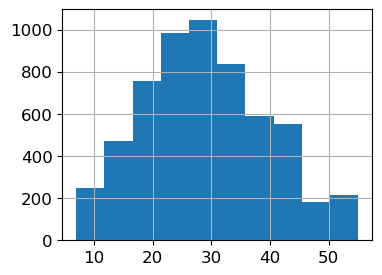

In [16]:
data["total_UPDRS"].hist(figsize=(4, 3))

<Axes: >

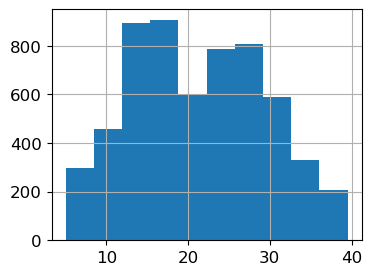

In [17]:
data["motor_UPDRS"].hist(figsize=(4, 3))

In [18]:
# To display just the columns of the DataFrame
column_names = data.columns
# Output the column names
print(column_names)

Index(['age', 'test_time', 'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP',
       'Jitter:PPQ5', 'Jitter:DDP', 'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3',
       'Shimmer:APQ5', 'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE',
       'DFA', 'PPE', 'sex', 'motor_UPDRS', 'total_UPDRS'],
      dtype='object')


# Cleaning Process

## Missing Value

In [19]:
import pandas as pd
missing_values = data.isnull().sum()
# Print the number of missing values for each column
print("Missing values in each column:")
print(missing_values[missing_values > 0])

Missing values in each column:
Series([], dtype: int64)


###### There is no missing Value

In [20]:
Data = data.copy() 

In [21]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   age            5875 non-null   int64  
 1   test_time      5875 non-null   float64
 2   Jitter(%)      5875 non-null   float64
 3   Jitter(Abs)    5875 non-null   float64
 4   Jitter:RAP     5875 non-null   float64
 5   Jitter:PPQ5    5875 non-null   float64
 6   Jitter:DDP     5875 non-null   float64
 7   Shimmer        5875 non-null   float64
 8   Shimmer(dB)    5875 non-null   float64
 9   Shimmer:APQ3   5875 non-null   float64
 10  Shimmer:APQ5   5875 non-null   float64
 11  Shimmer:APQ11  5875 non-null   float64
 12  Shimmer:DDA    5875 non-null   float64
 13  NHR            5875 non-null   float64
 14  HNR            5875 non-null   float64
 15  RPDE           5875 non-null   float64
 16  DFA            5875 non-null   float64
 17  PPE            5875 non-null   float64
 18  sex     

# StandardScaler

In [22]:
from sklearn.preprocessing import StandardScaler

features = data.columns.drop(['motor_UPDRS','total_UPDRS'])  # Exclude target variables
scaler = StandardScaler()

# Standardize the features
data[features] = scaler.fit_transform(data[features])

# Now your data is standardized, and you can confirm by checking the mean and std:
print(data[features].mean())  # Should be close to 0
print(data[features].std())   # Should be close to 1

age             -4.063700e-16
test_time        3.507360e-17
Jitter(%)        1.451321e-16
Jitter(Abs)      1.741586e-16
Jitter:RAP       1.935095e-17
Jitter:PPQ5     -1.935095e-17
Jitter:DDP       1.693208e-16
Shimmer          1.741586e-16
Shimmer(dB)      1.838340e-16
Shimmer:APQ3     4.837738e-17
Shimmer:APQ5     1.548076e-16
Shimmer:APQ11   -3.870190e-17
Shimmer:DDA      9.675476e-17
NHR             -3.870190e-17
HNR             -6.385814e-16
RPDE             1.935095e-16
DFA              4.450719e-16
PPE              1.741586e-16
sex             -1.935095e-17
dtype: float64
age              1.000085
test_time        1.000085
Jitter(%)        1.000085
Jitter(Abs)      1.000085
Jitter:RAP       1.000085
Jitter:PPQ5      1.000085
Jitter:DDP       1.000085
Shimmer          1.000085
Shimmer(dB)      1.000085
Shimmer:APQ3     1.000085
Shimmer:APQ5     1.000085
Shimmer:APQ11    1.000085
Shimmer:DDA      1.000085
NHR              1.000085
HNR              1.000085
RPDE             1.000085

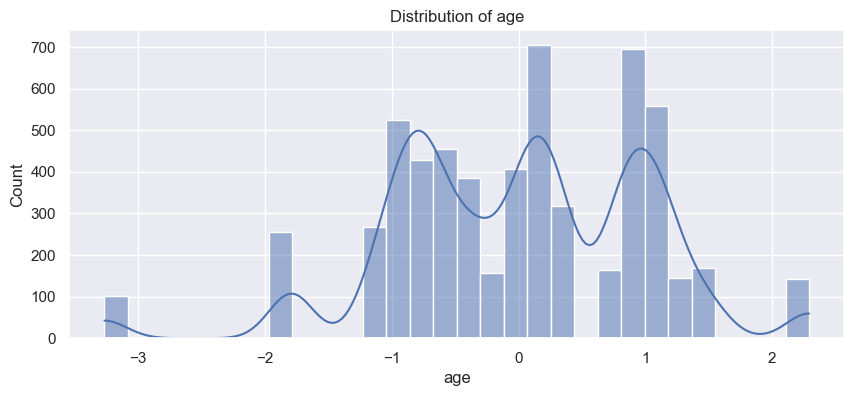

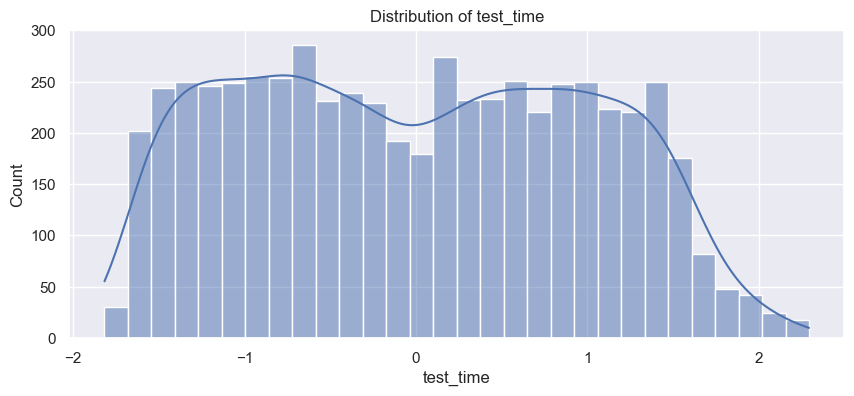

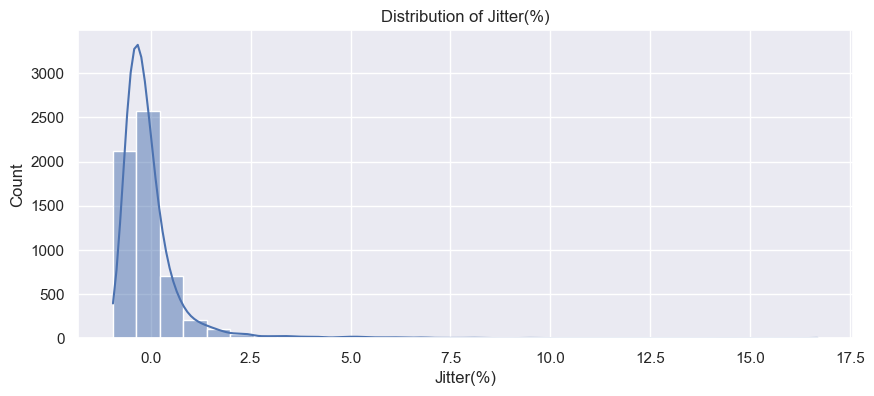

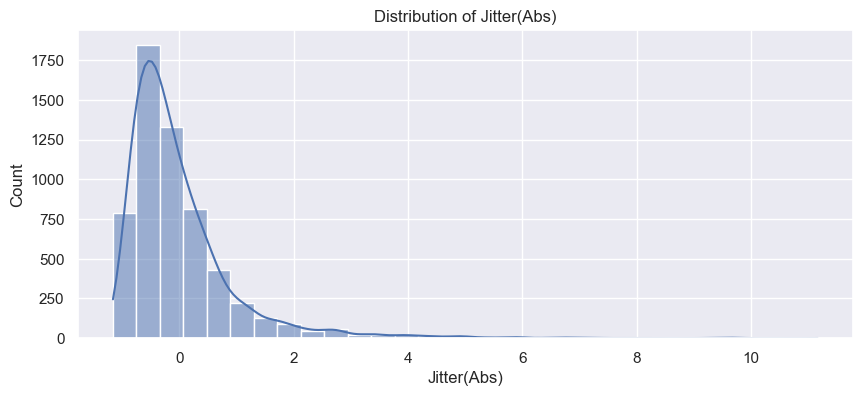

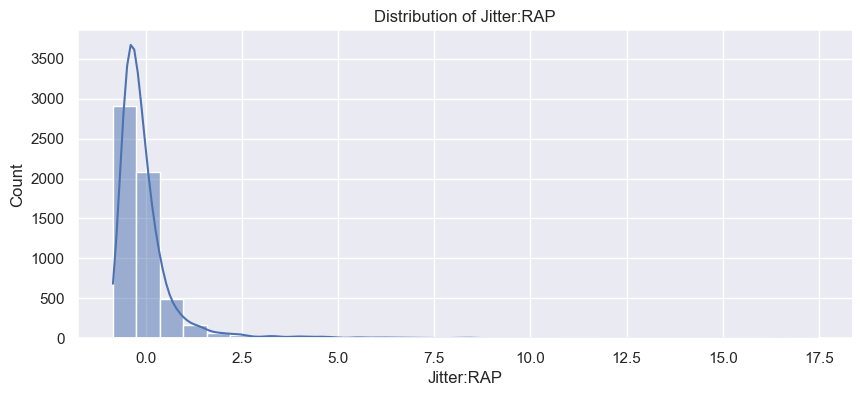

...

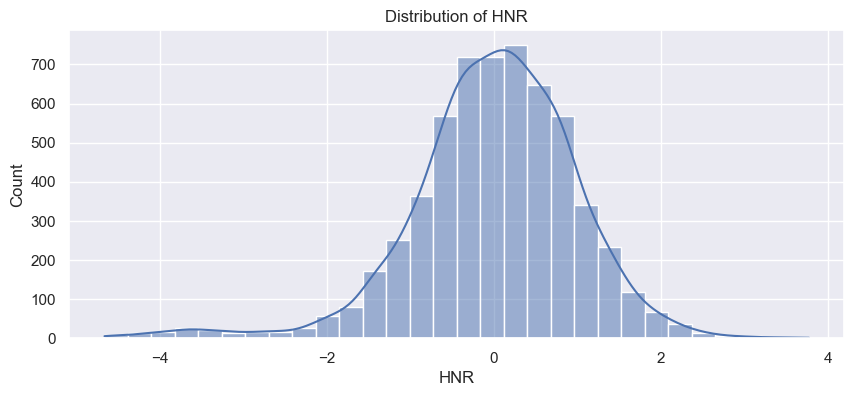

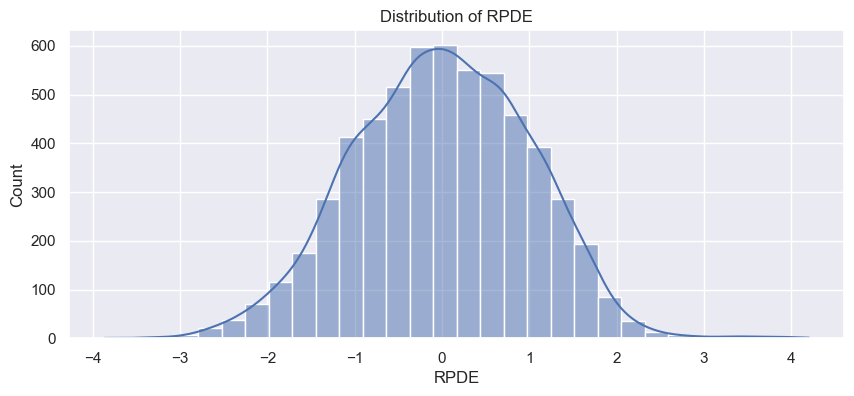

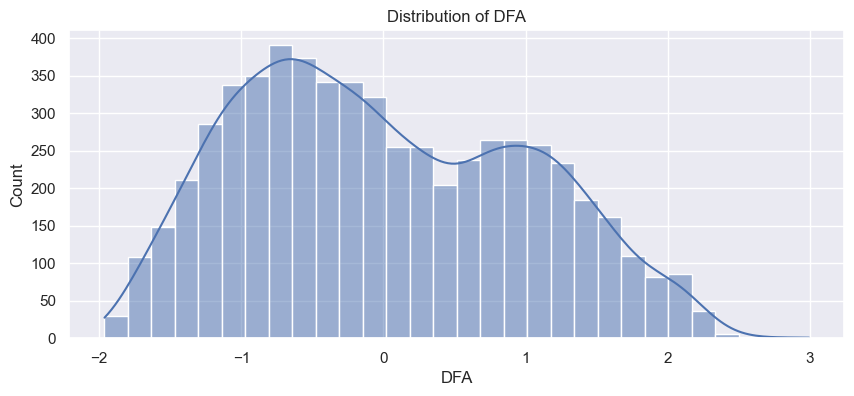

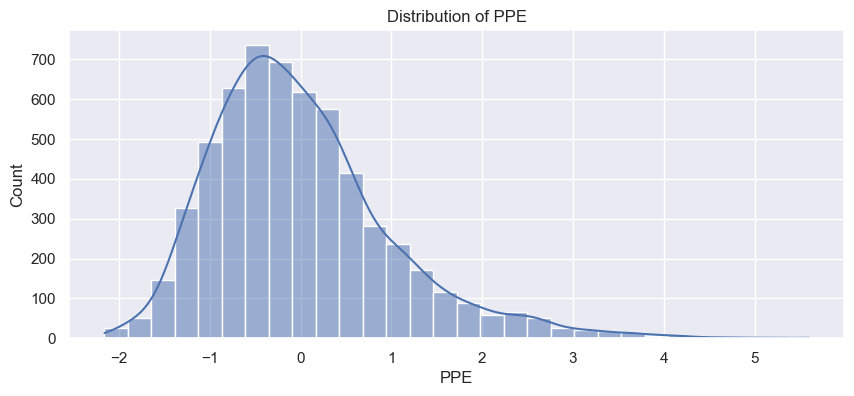

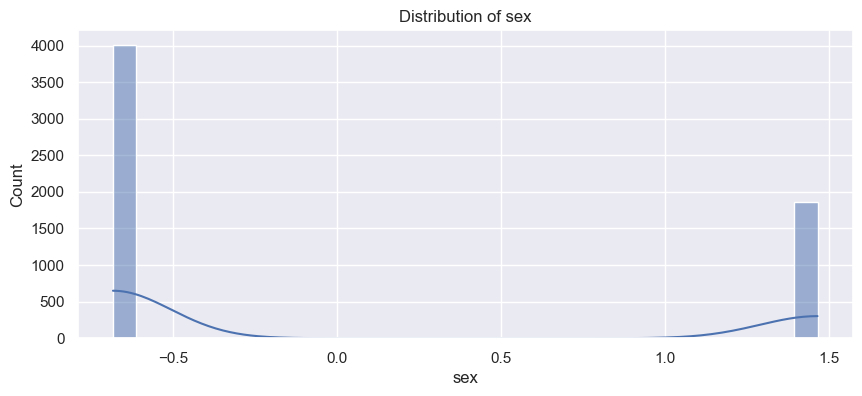

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the aesthetic style of the plots
sns.set()

# Plotting the distribution of each feature
for column in data.columns.drop(['motor_UPDRS', 'total_UPDRS']):
    plt.figure(figsize=(10, 4))
    sns.histplot(data[column], kde=True, bins=30)
    plt.title(f'Distribution of {column}')
    plt.show()


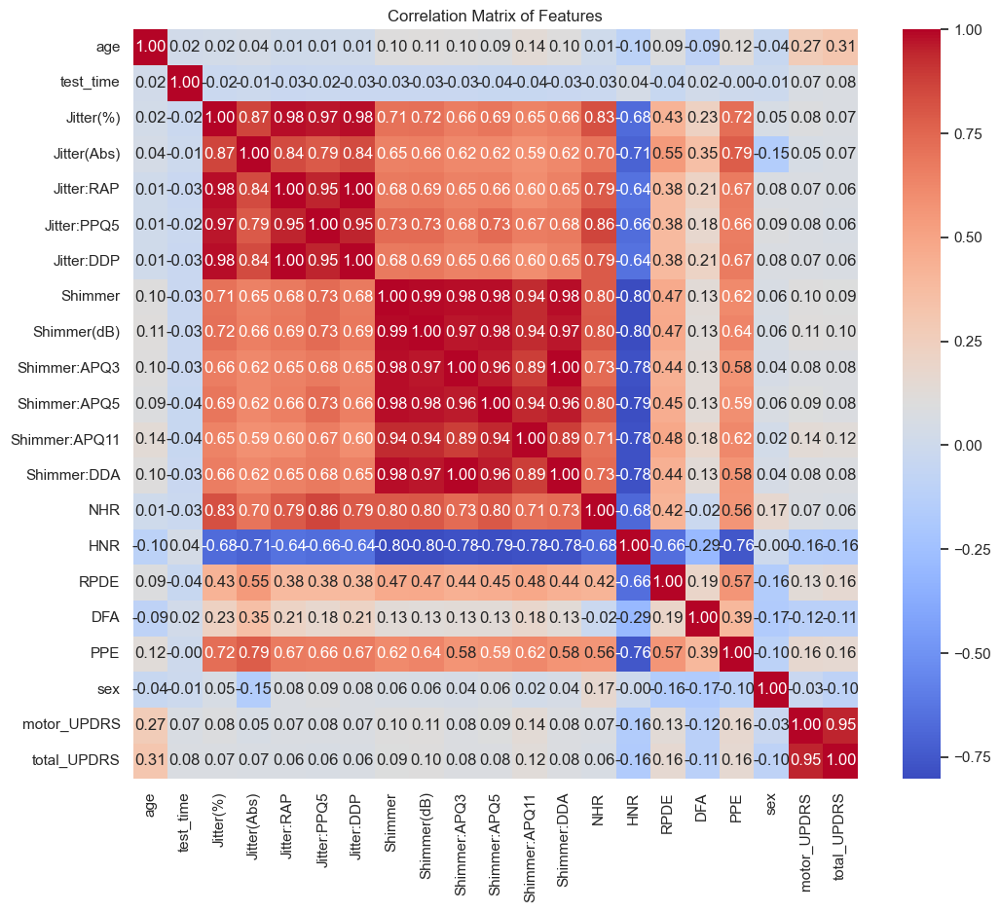

In [24]:
# Calculating the correlation matrix
correlation_matrix = data.corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Features')
plt.show()


C:\Users\Behnam\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


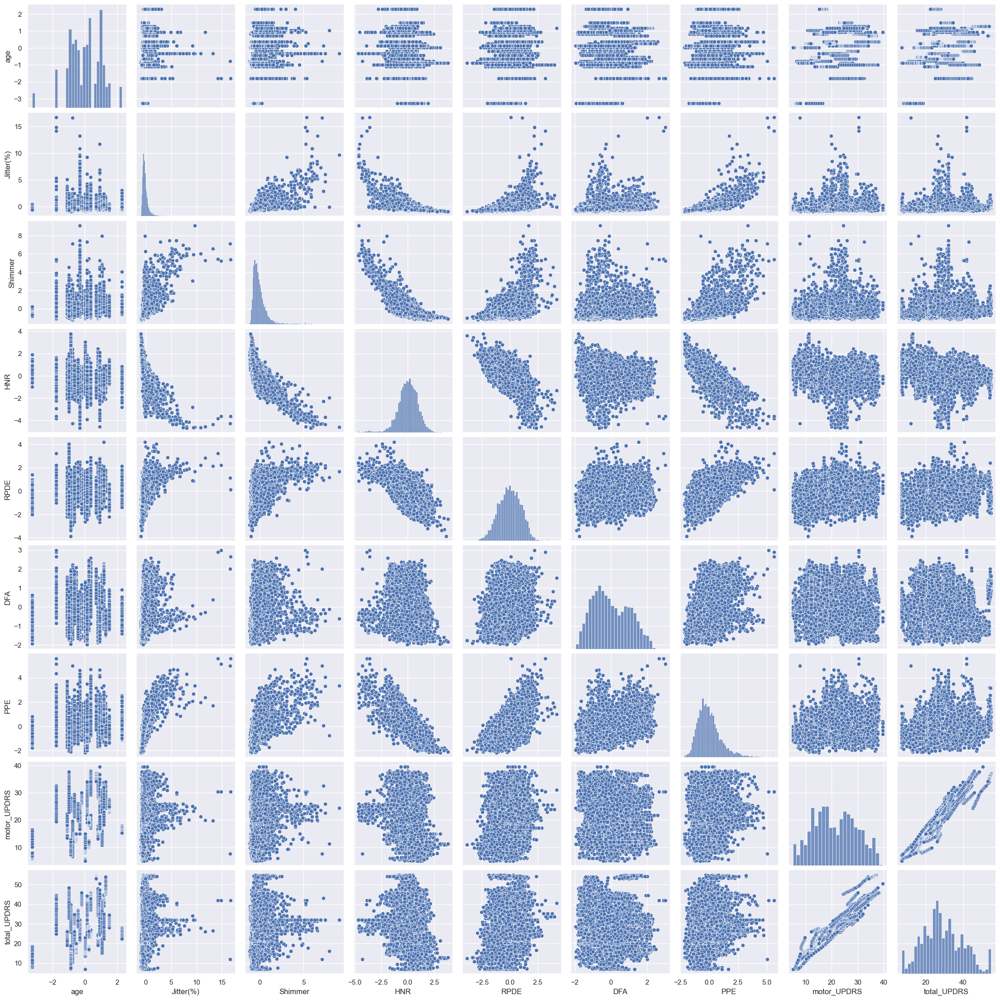

In [25]:
# It's often not practical to plot all features using pairplot if there are many, so select a few
selected_features = ['age', 'Jitter(%)', 'Shimmer', 'HNR', 'RPDE', 'DFA', 'PPE', 'motor_UPDRS', 'total_UPDRS']  # example selection
sns.pairplot(data[selected_features])
plt.show()

# Change type of Age and Sex

In [26]:
Data = pd.get_dummies(Data, columns=['age'])

In [27]:
Data = pd.get_dummies(Data, columns=['sex'])

## New data after chage Dtype 

In [28]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 44 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   test_time      5875 non-null   float64
 1   Jitter(%)      5875 non-null   float64
 2   Jitter(Abs)    5875 non-null   float64
 3   Jitter:RAP     5875 non-null   float64
 4   Jitter:PPQ5    5875 non-null   float64
 5   Jitter:DDP     5875 non-null   float64
 6   Shimmer        5875 non-null   float64
 7   Shimmer(dB)    5875 non-null   float64
 8   Shimmer:APQ3   5875 non-null   float64
 9   Shimmer:APQ5   5875 non-null   float64
 10  Shimmer:APQ11  5875 non-null   float64
 11  Shimmer:DDA    5875 non-null   float64
 12  NHR            5875 non-null   float64
 13  HNR            5875 non-null   float64
 14  RPDE           5875 non-null   float64
 15  DFA            5875 non-null   float64
 16  PPE            5875 non-null   float64
 17  motor_UPDRS    5875 non-null   float64
 18  total_UP

# Feature Selection

## Correlation Analysis

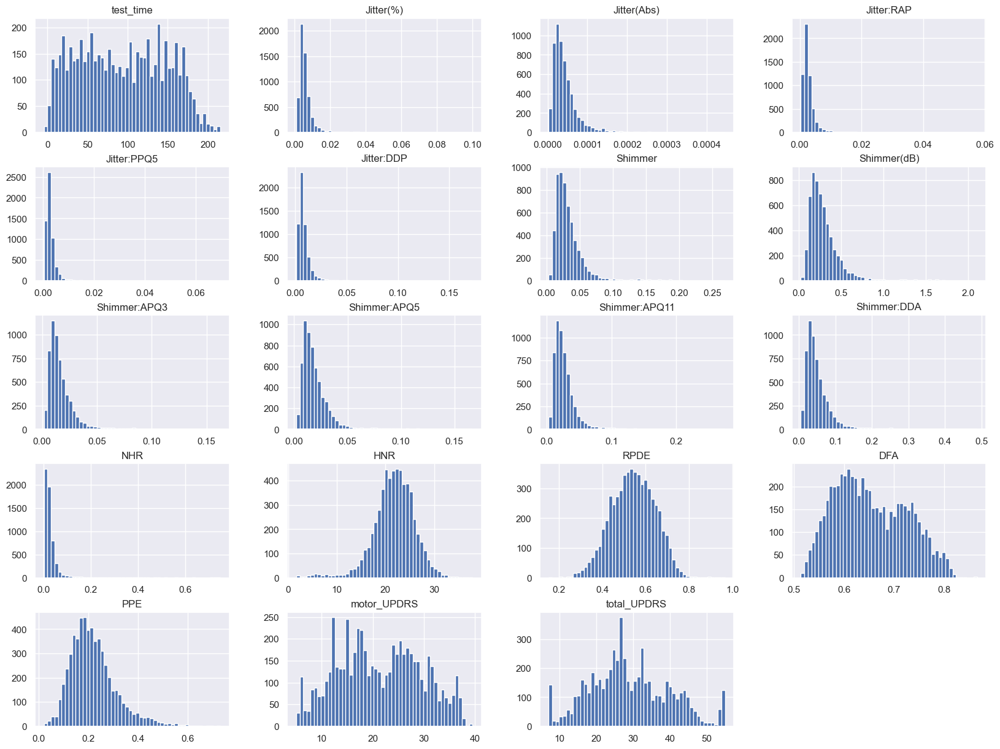

In [29]:
import seaborn as sns
# Histograms for all numeric features
Data.hist(bins=50, figsize=(20, 15))
plt.show()

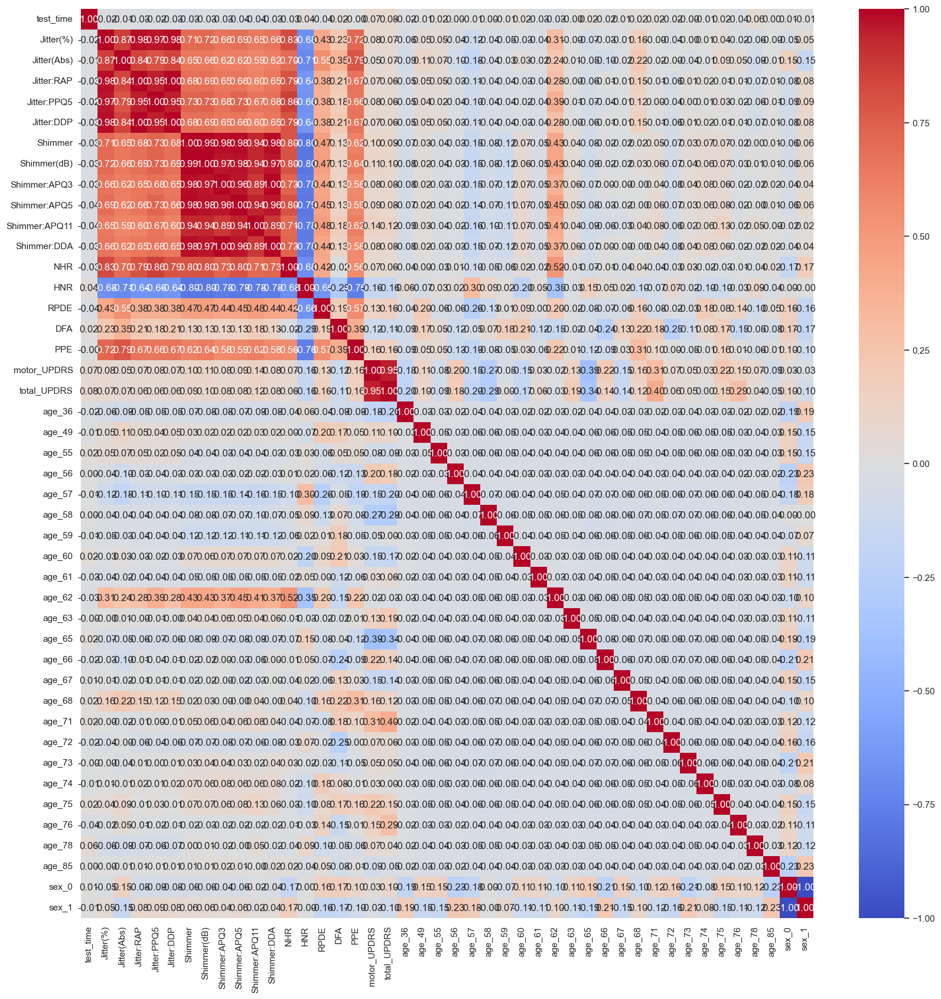

In [30]:
# Pair plots for selected features
# Correlation matrix heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(Data.corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

C:\Users\Behnam\AppData\Local\Temp\ipykernel_10356\4168786826.py:26: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


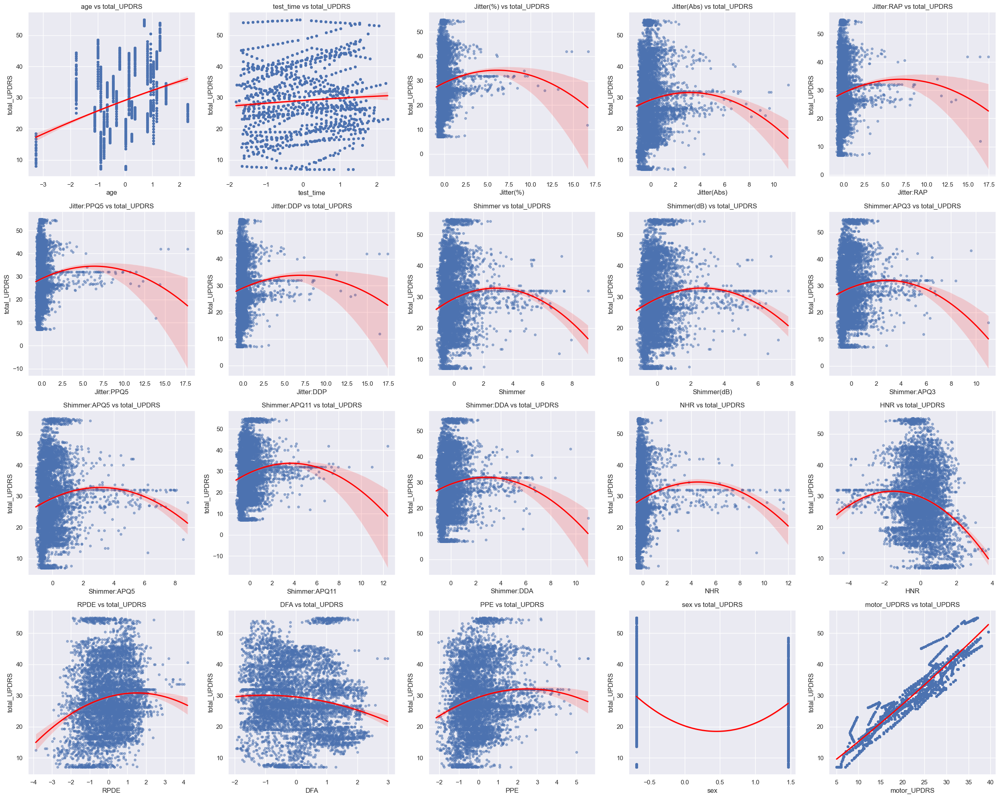

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from numpy import RankWarning

# Ignore RankWarning when fitting polynomials
warnings.simplefilter('ignore', RankWarning)

excluded_columns = ['total_UPDRS']
features = [col for col in data.columns if col not in excluded_columns]

# Determining the number of rows/columns for the subplot grid
n = len(features)
cols = 5
rows = n // cols + (n % cols > 0)

plt.figure(figsize=(5*cols, 5*rows))

# Plotting each feature against 'total_UPDRS'
for i, feature in enumerate(features):
    plt.subplot(rows, cols, i+1)
    sns.regplot(x=data[feature], y=data['total_UPDRS'], order=2, line_kws={"color": "red"}, scatter_kws={"alpha": 0.5, "s": 15})
    plt.title(f'{feature} vs total_UPDRS')
    plt.xlabel(feature)
    plt.ylabel('total_UPDRS')
    plt.tight_layout()

plt.show()

# Re-enable RankWarning after plotting
warnings.simplefilter('default', RankWarning)



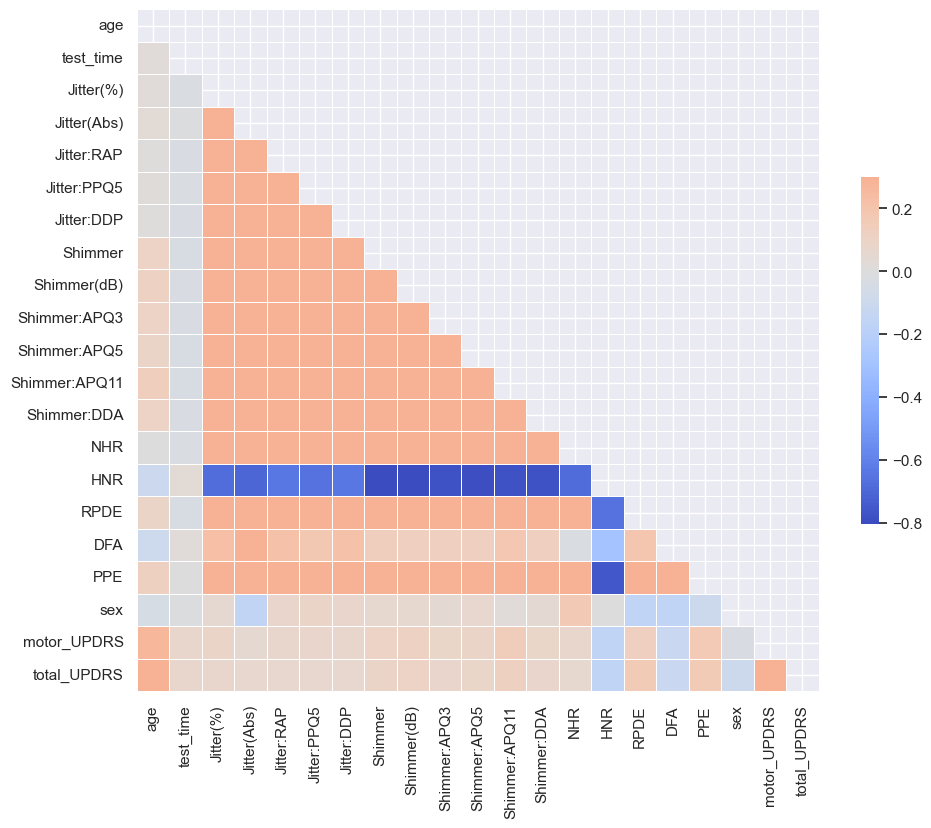

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a target variable named 'target'. If not, replace 'target' with your actual target variable name.
# If your task includes predicting multiple targets (e.g., aveOralF and aveOralM), you might need to perform this analysis separately for each.

# Compute the correlation matrix
corr_matrix = data.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, mask=mask, cmap='coolwarm', vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

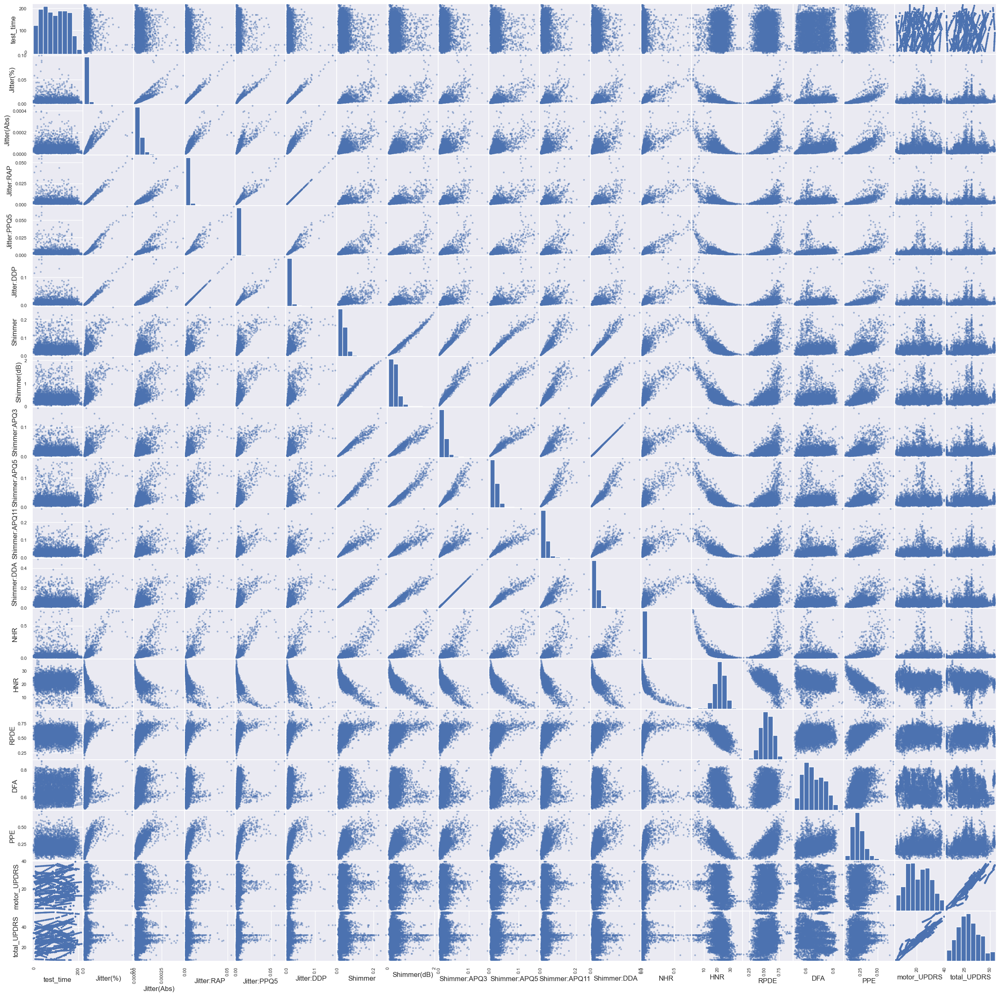

In [33]:
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt

# Selecting only numeric attributes from your DataFrame
numeric_attributes = Data.select_dtypes(include=[np.number]).columns.tolist()

# Creating a scatter plot matrix for all numeric attributes
scatter_matrix(Data[numeric_attributes], figsize=(30, 30))
plt.show()  


## corr_matrix on total_UPDRS

In [34]:
corr_matrix = Data.corr()
corr_matrix["total_UPDRS"].sort_values(ascending=False)

total_UPDRS      1.000000
motor_UPDRS      0.947231
age_71           0.400917
age_76           0.290711
age_63           0.190160
age_56           0.183958
RPDE             0.156897
PPE              0.156195
age_75           0.153209
age_66           0.135543
Shimmer:APQ11    0.120838
age_68           0.115613
age_49           0.100846
Shimmer(dB)      0.098790
sex_0            0.096559
Shimmer          0.092141
Shimmer:APQ5     0.083467
Shimmer:DDA      0.079363
Shimmer:APQ3     0.079363
test_time        0.075263
Jitter(%)        0.074247
Jitter(Abs)      0.066926
Jitter:DDP       0.064027
Jitter:RAP       0.064015
age_61           0.063799
Jitter:PPQ5      0.063352
NHR              0.060952
age_72           0.056034
age_73           0.049220
age_78           0.039874
age_74           0.003204
age_59           0.002906
age_62          -0.027599
age_85          -0.045090
age_55          -0.093037
sex_1           -0.096559
DFA             -0.113475
age_67          -0.144808
HNR         

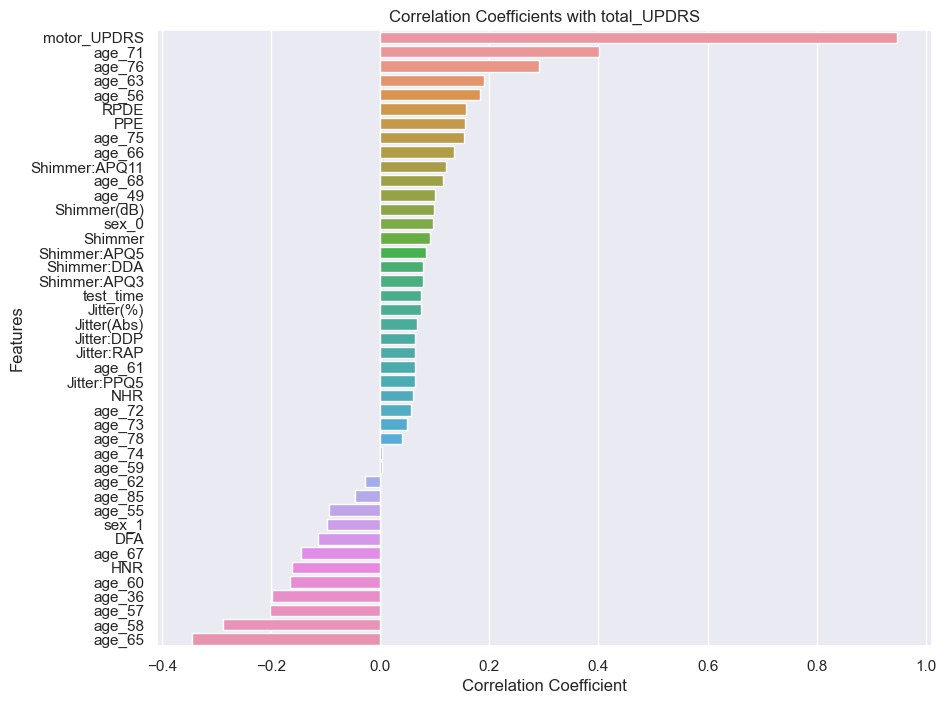

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
corr_matrix = Data.corr()

# Get the correlation of all features with 'total_UPDRS', sort them, and drop 'total_UPDRS' itself
corr_with_total_UPDRS = corr_matrix["total_UPDRS"].sort_values(ascending=False).drop('total_UPDRS')

# Create a bar plot
plt.figure(figsize=(10, 8))
sns.barplot(x=corr_with_total_UPDRS.values, y=corr_with_total_UPDRS.index)

# Add labels and title
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.title('Correlation Coefficients with total_UPDRS')

plt.show()


## corr_matrix on motor_UPDRS

In [36]:
corr_matrix = Data.corr()
corr_matrix["motor_UPDRS"].sort_values(ascending=False)

motor_UPDRS      1.000000
total_UPDRS      0.947231
age_71           0.307282
age_75           0.221517
age_66           0.215028
age_56           0.203061
PPE              0.162433
age_68           0.158430
age_76           0.145014
Shimmer:APQ11    0.136560
RPDE             0.128607
age_63           0.126694
Shimmer(dB)      0.110076
age_49           0.109621
Shimmer          0.102349
Shimmer:APQ5     0.092105
Jitter(%)        0.084816
Shimmer:APQ3     0.084261
Shimmer:DDA      0.084260
Jitter:PPQ5      0.076291
NHR              0.074967
Jitter:DDP       0.072698
Jitter:RAP       0.072684
age_78           0.070393
age_72           0.068814
test_time        0.067918
Jitter(Abs)      0.050899
age_73           0.046395
sex_0            0.031205
age_61           0.030823
age_74           0.029998
age_62          -0.021426
sex_1           -0.031205
age_59          -0.050921
age_55          -0.079822
age_85          -0.092717
DFA             -0.116242
age_57          -0.152599
age_60      

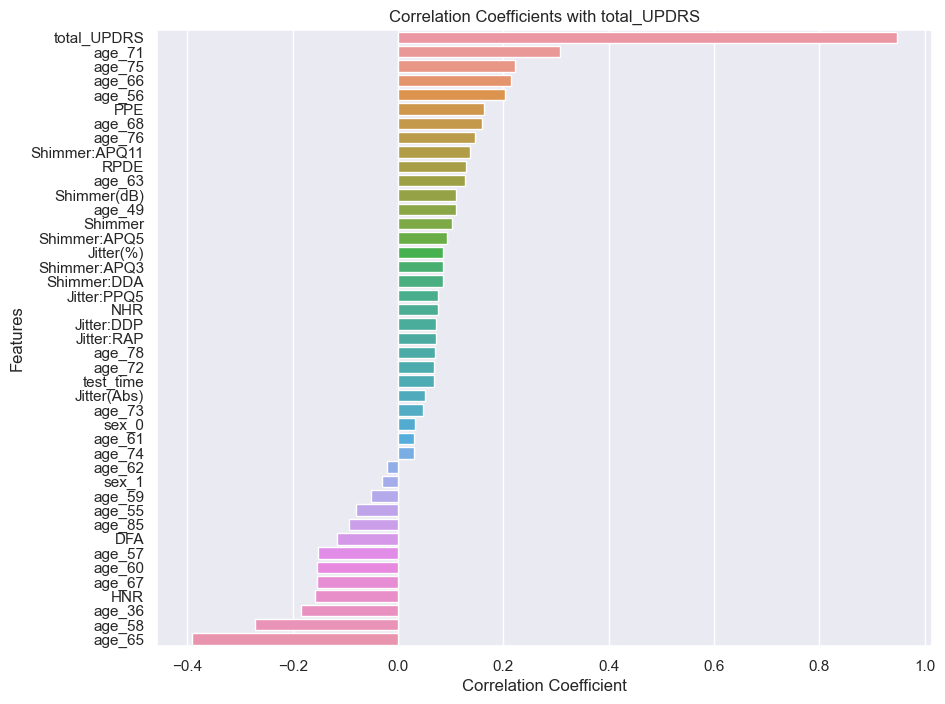

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
corr_matrix = Data.corr()

# Get the correlation of all features with 'total_UPDRS', sort them, and drop 'motor_UPDRS' itself
corr_with_total_UPDRS = corr_matrix["motor_UPDRS"].sort_values(ascending=False).drop('motor_UPDRS')

# Create a bar plot
plt.figure(figsize=(10, 8))
sns.barplot(x=corr_with_total_UPDRS.values, y=corr_with_total_UPDRS.index)

# Add labels and title
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.title('Correlation Coefficients with total_UPDRS')

plt.show()

# Important features with RandomForestRegressor for Total UPDRS

In [38]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split


X = Data.drop(['total_UPDRS'], axis=1)
y = Data['total_UPDRS']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
rf.fit(X_train, y_train)

# Get feature importances
importances = rf.feature_importances_

# Get the indices of the sorted feature importances in descending order
indices = np.argsort(importances)[::-1]

# Decide how many features you want to keep
n_features_to_select = 42  # for example, the top 10 features

# Select the indices of the top important features
top_indices = indices[:n_features_to_select]

# Create new training and testing sets with only the top important features
X_important_train = X_train.iloc[:, top_indices]
X_important_test = X_test.iloc[:, top_indices]

# Print out the top features and their importance scores
for i in top_indices:
    print(f"{X_train.columns[i]}: {importances[i]}")

motor_UPDRS: 0.9021343147763128
age_76: 0.02521375590756222
age_71: 0.019867888251716714
test_time: 0.012218923738393974
age_59: 0.008154831424369107
age_63: 0.007454146088660864
DFA: 0.003772783785257194
sex_0: 0.002920590685841609
age_61: 0.002461375176540285
sex_1: 0.0016582737251489915
age_58: 0.0016571128919118756
age_73: 0.00150865187085225
age_55: 0.001119154810722148
age_75: 0.0008999208176178514
HNR: 0.0008068852264702203
RPDE: 0.0006790351413636703
age_66: 0.0006669073486732671
age_49: 0.0006502845160700383
age_74: 0.0005557199235487933
Jitter(Abs): 0.0005077068865217721
age_36: 0.0005021818401820465
age_57: 0.0004215492354961835
age_67: 0.00041753811861415936
age_85: 0.00038725371125317403
Shimmer:DDA: 0.0003786855421691224
Shimmer:APQ11: 0.0003117629904138093
PPE: 0.0003044502906876095
age_56: 0.0002671071583523838
Shimmer:APQ5: 0.0002636285610986878
Shimmer:APQ3: 0.00025742415700148654
age_72: 0.00018193437127255003
Shimmer: 0.0001728148724167242
age_65: 0.0001691102424855

# Important features with RandomForestRegressor for Motor UPDRS

In [39]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming your DataFrame is named Data
# Prepare the feature set X and the target variable y
X = Data.drop(['motor_UPDRS'], axis=1)
y = Data['motor_UPDRS']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
rf.fit(X_train, y_train)

# Get feature importances
importances = rf.feature_importances_

# Get the indices of the sorted feature importances in descending order
indices = np.argsort(importances)[::-1]

# Decide how many features you want to keep
n_features_to_select = 42  # for example, the top 10 features

# Select the indices of the top important features
top_indices = indices[:n_features_to_select]

# Create new training and testing sets with only the top important features
X_important_train = X_train.iloc[:, top_indices]
X_important_test = X_test.iloc[:, top_indices]

# Print out the top features and their importance scores
for i in top_indices:
    print(f"{X_train.columns[i]}: {importances[i]}")


total_UPDRS: 0.9309863478638145
age_76: 0.009747308505743617
test_time: 0.009637454203780873
age_59: 0.007527769899854588
age_63: 0.0055983885297592835
DFA: 0.005052913420357808
age_75: 0.0038726021958011628
age_65: 0.003590416105410973
age_61: 0.0026313953212514208
age_57: 0.0025146960750637845
age_55: 0.002108869286913002
sex_0: 0.0017134022914466495
age_66: 0.0014569070645442442
sex_1: 0.001371589174298763
age_85: 0.00134137526948873
age_74: 0.0011787068693545136
Jitter(Abs): 0.0011031235256289183
RPDE: 0.0008599535580579071
PPE: 0.0008595637018320894
age_67: 0.0008333461923439562
HNR: 0.0007557660376186242
age_72: 0.0005866656471521363
age_73: 0.0005437314841855625
age_49: 0.0004012345631485372
Shimmer:APQ11: 0.00039659226234180965
age_78: 0.00038800119076293644
age_36: 0.00035484967685889425
age_68: 0.0003018096624406129
age_58: 0.0002769224743990106
age_56: 0.00023444599214890276
Shimmer:APQ5: 0.00020043204621227346
Shimmer:APQ3: 0.00019130094805716534
NHR: 0.00019075857664607274

# Regression Models

# LinearRegression Model for Motor UPDRS 

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target columns
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Further split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Initialize the Linear Regression model
lr_model = LinearRegression()

# Fit the model on the training data
lr_model.fit(X_train, y_train)

LinearRegression()

In [41]:
# Check the result of the splitting
print(f"Training set size (features): {X_train.shape}")
print(f"Testing set size (features): {X_test.shape}")
print(f"Training set size (targets): {y_train.shape}")
print(f"Testing set size (targets): {y_test.shape}")

Training set size (features): (3525, 43)
Testing set size (features): (1175, 43)
Training set size (targets): (3525,)
Testing set size (targets): (1175,)


LinearRegression Validation MSE: 3.0614138493165637
LinearRegression Validation R-squared: 0.9535618133256505
LinearRegression Test MSE: 2.9574923526132904
LinearRegression Test R-squared: 0.953665545649691


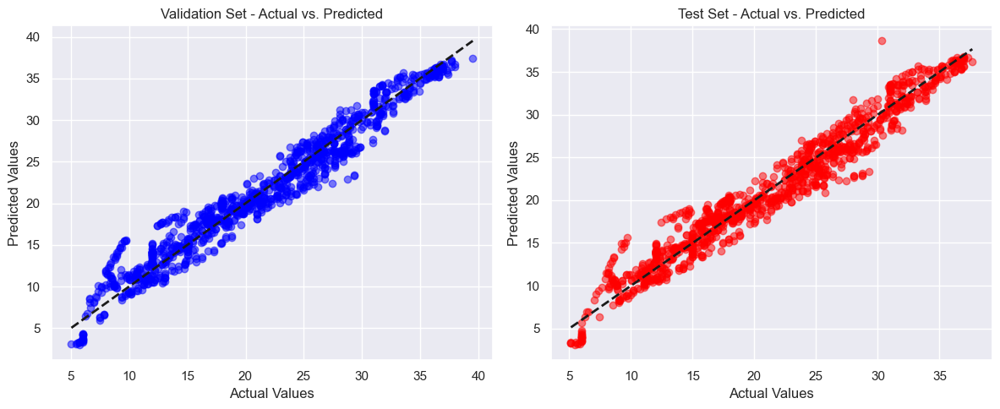

In [42]:
from sklearn.metrics import mean_squared_error, r2_score

# Predict on the validation set
y_val_pred = lr_model.predict(X_val)

# Calculate the Mean Squared Error and R-squared on the validation set
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Predict on the test set
y_test_pred = lr_model.predict(X_test)

# Calculate the Mean Squared Error and R-squared on the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out the evaluation metrics for validation and test sets
print(f"LinearRegression Validation MSE: {mse_val}")
print(f"LinearRegression Validation R-squared: {r2_val}")
print(f"LinearRegression Test MSE: {mse_test}")
print(f"LinearRegression Test R-squared: {r2_test}")

#Plot for LinearRegression Validation MSE and inearRegression Test MSE
import matplotlib.pyplot as plt 

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.scatter(y_val, y_val_pred, alpha=0.5, color='blue')
plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], 'k--', lw=2)  # Diagonal line
plt.title('Validation Set - Actual vs. Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

# Scatter plot for test set
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.scatter(y_test, y_test_pred, alpha=0.5, color='red')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'k--', lw=2)  # Diagonal line
plt.title('Test Set - Actual vs. Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

plt.tight_layout()  
plt.show()

# GridSearchCV on LinearRegression Model for Motor UPDRS

In [43]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge

# Define a set of alpha values for Ridge Regression
alpha_values = np.logspace(-4, 4, 50)

# Create a dictionary of parameters to search
parameters = {'alpha': alpha_values}

# Initialize a Ridge Regression model
ridge_model = Ridge()

# Initialize Grid Search with the model and parameter grid
grid_search = GridSearchCV(estimator=ridge_model, param_grid=parameters, 
                           scoring='neg_mean_squared_error', cv=5, verbose=1)

# Fit the Grid Search to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {grid_search.best_params_}")

# Use the best estimator to make predictions
y_val_pred = grid_search.best_estimator_.predict(X_val)
y_test_pred = grid_search.best_estimator_.predict(X_test)

# Calculate the MSE and R-squared on the validation set
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Calculate the MSE and R-squared on the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out the evaluation metrics for validation and test sets
print(f"GridSearchCV Ridge Regression Validation MSE: {mse_val}")
print(f"GridSearchCV Ridge Regression Validation R-squared: {r2_val}")
print(f"GridSearchCV Ridge Regression Test MSE: {mse_test}")
print(f"GridSearchCV Ridge Regression Test R-squared: {r2_test}")


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters found: {'alpha': 0.00030888435964774815}
GridSearchCV Ridge Regression Validation MSE: 3.0900853182393675
GridSearchCV Ridge Regression Validation R-squared: 0.9531268995597896
GridSearchCV Ridge Regression Test MSE: 2.9442045003118396
GridSearchCV Ridge Regression Test R-squared: 0.9538737238332563


#### best performance:
The performance of the two models is very close to each other. Linear Regression performs marginally better on the validation set, while Ridge Regression has a slight edge on the test set.
If the focus is on generalization to unseen data (test set performance), Ridge Regression with the parameters found through GridSearchCV would be considered slightly better in this case.

Ridge Regression (with GridSearchCV):

Validation MSE: 3.0900853182393675

Validation R²: 0.9531268995597896

Test MSE: 2.9442045003118396

Test R²: 0.9538737238332563

#  LinearRegression RMSE MAE on Motor UPDRS

In [44]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Further split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Initialize the Linear Regression model
lr_model = LinearRegression()

# Fit the model on the training data
lr_model.fit(X_train, y_train)

# Predict on the training set
y_train_pred = lr_model.predict(X_train)

# Predict on the validation set
y_val_pred = lr_model.predict(X_val)

# Predict on the test set
y_test_pred = lr_model.predict(X_test)

# Calculate RMSE and MAE for the training set
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
mae_train = mean_absolute_error(y_train, y_train_pred)

# Calculate RMSE and MAE for the validation set
rmse_val = np.sqrt(mean_squared_error(y_val, y_val_pred))
mae_val = mean_absolute_error(y_val, y_val_pred)

# Calculate RMSE and MAE for the test set
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
mae_test = mean_absolute_error(y_test, y_test_pred)

# Print out the RMSE and MAE for training, validation, and test sets
print(f"Linear Regression Training RMSE: {rmse_train}")
print(f"Linear Regression Training MAE: {mae_train}")
print(f"Linear Regression Validation RMSE: {rmse_val}")
print(f"Linear Regression Validation MAE: {mae_val}")
print(f"Linear Regression Test RMSE: {rmse_test}")
print(f"Linear Regression Test MAE: {mae_test}")



Linear Regression Training RMSE: 1.696527219742676
Linear Regression Training MAE: 1.336750301042279
Linear Regression Validation RMSE: 1.7496896437130112
Linear Regression Validation MAE: 1.3636427164513854
Linear Regression Test RMSE: 1.719736128774787
Linear Regression Test MAE: 1.3529038042147272


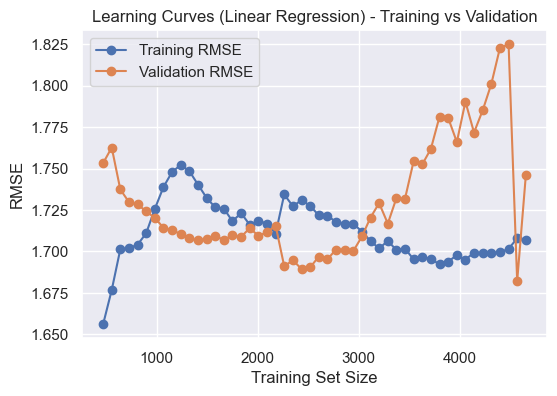

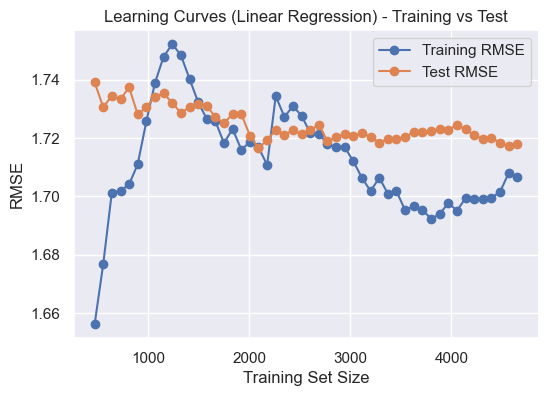

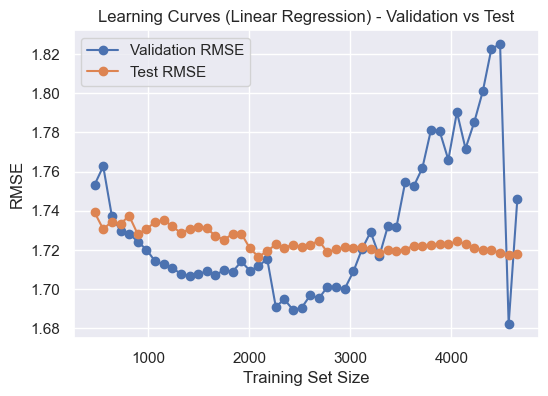

In [45]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming 'Data' is your DataFrame and 'motor_UPDRS' is the target variable

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training+validation and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize lists to store RMSEs for different set sizes
train_errors, val_errors, test_errors = [], [], []

# Generate 50 training set sizes between 10% and 99% of the full training set
train_sizes = (np.linspace(0.1, 0.99, 50) * len(X_train_val)).astype(int)

for train_size in train_sizes:
    # Split the data into training and validation sets
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_val, y_train_val, train_size=train_size, random_state=42
    )
    
    # Train the model
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    # Make predictions
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    y_test_pred = model.predict(X_test)
    
    # Calculate RMSE and append to lists
    train_errors.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
    val_errors.append(np.sqrt(mean_squared_error(y_val, y_val_pred)))
    test_errors.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))

# Plotting Training vs Validation
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, train_errors, label='Training RMSE', marker='o')
plt.plot(train_sizes, val_errors, label='Validation RMSE', marker='o')
plt.title('Learning Curves (Linear Regression) - Training vs Validation')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# Plotting Training vs Test
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, train_errors, label='Training RMSE', marker='o')
plt.plot(train_sizes, test_errors, label='Test RMSE', marker='o')
plt.title('Learning Curves (Linear Regression) - Training vs Test')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# Plotting Validation vs Test
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, val_errors, label='Validation RMSE', marker='o')
plt.plot(train_sizes, test_errors, label='Test RMSE', marker='o')
plt.title('Learning Curves (Linear Regression) - Validation vs Test')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# LinearRegression Model for Total UPDRS 

In [46]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target columns
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Further split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Initialize the Linear Regression model
lr_model = LinearRegression()

# Fit the model on the training data
lr_model.fit(X_train, y_train)

LinearRegression()

LinearRegression Validation MSE: 4.2952740407461425
LinearRegression Validation R-squared: 0.9622087109287265
LinearRegression Test MSE: 4.0940021695681885
LinearRegression Test R-squared: 0.9630548710975152


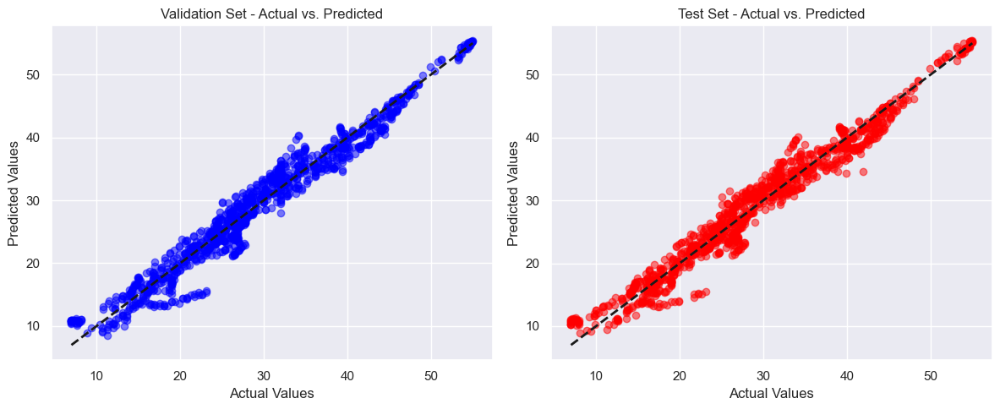

In [47]:
from sklearn.metrics import mean_squared_error, r2_score

# Predict on the validation set
y_val_pred = lr_model.predict(X_val)

# Calculate the Mean Squared Error and R-squared on the validation set
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Predict on the test set
y_test_pred = lr_model.predict(X_test)

# Calculate the Mean Squared Error and R-squared on the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out the evaluation metrics for validation and test sets
print(f"LinearRegression Validation MSE: {mse_val}")
print(f"LinearRegression Validation R-squared: {r2_val}")
print(f"LinearRegression Test MSE: {mse_test}")
print(f"LinearRegression Test R-squared: {r2_test}")

#Plot for LinearRegression Validation MSE and inearRegression Test MSE
import matplotlib.pyplot as plt 

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.scatter(y_val, y_val_pred, alpha=0.5, color='blue')
plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], 'k--', lw=2)  # Diagonal line
plt.title('Validation Set - Actual vs. Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

# Scatter plot for test set
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.scatter(y_test, y_test_pred, alpha=0.5, color='red')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'k--', lw=2)  # Diagonal line
plt.title('Test Set - Actual vs. Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

plt.tight_layout()  
plt.show()

# GridSearchCV on LinearRegression Model for total_UPDRS

In [48]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# Define the Ridge model
ridge = Ridge()

# Set up the parameters we wish to tune
parameters = {'alpha': [1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20]}

# Initialize GridSearchCV
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=5)

# Fit the model on the training data
ridge_regressor.fit(X_train, y_train)

# Get the best parameters
best_parameters = ridge_regressor.best_params_

# Predict on the validation set using the best parameters
y_val_pred_ridge = ridge_regressor.predict(X_val)

# Calculate the Mean Squared Error and R-squared on the validation set
mse_val_ridge = mean_squared_error(y_val, y_val_pred_ridge)
r2_val_ridge = r2_score(y_val, y_val_pred_ridge)

# Predict on the test set using the best parameters
y_test_pred_ridge = ridge_regressor.predict(X_test)

# Calculate the Mean Squared Error and R-squared on the test set
mse_test_ridge = mean_squared_error(y_test, y_test_pred_ridge)
r2_test_ridge = r2_score(y_test, y_test_pred_ridge)

# Print out the best parameters and evaluation metrics
print(f"Best parameters found: {best_parameters}")
print(f"Ridge Regression Validation MSE: {mse_val_ridge}")
print(f"Ridge Regression Validation R-squared: {r2_val_ridge}")
print(f"Ridge Regression Test MSE: {mse_test_ridge}")
print(f"Ridge Regression Test R-squared: {r2_test_ridge}")


Best parameters found: {'alpha': 0.01}
Ridge Regression Validation MSE: 4.305639093034214
Ridge Regression Validation R-squared: 0.9621175156560754
Ridge Regression Test MSE: 4.073747363129158
Ridge Regression Test R-squared: 0.9632376546925868


C:\Users\Behnam\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:211: LinAlgWarning: Ill-conditioned matrix (rcond=1.21908e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\Behnam\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:211: LinAlgWarning: Ill-conditioned matrix (rcond=1.23752e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\Behnam\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:211: LinAlgWarning: Ill-conditioned matrix (rcond=1.23396e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\Behnam\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:211: LinAlgWarning: Ill-conditioned matrix (rcond=1.22634e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\Behnam\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.

# best performance:
 Ridge Regression with an alpha of 0.01 demonstrates slightly better performance compared to the basic Linear Regression model.
 
 Ridge Regression:
Ridge Regression Validation MSE: 4.305639093034214

Ridge Regression Validation R-squared: 0.9621175156560754

Ridge Regression Test MSE: 4.073747363129158

Ridge Regression Test R-squared: 0.9632376546925868

#  LinearRegression RMSE MAE on Total UPDRS

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Assuming 'Data' is your DataFrame with all the features and the target 'motor_UPDRS'

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Further split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Initialize the Linear Regression model
lr_model = LinearRegression()

# Fit the model on the training data
lr_model.fit(X_train, y_train)

# Predict on the training set
y_train_pred = lr_model.predict(X_train)

# Predict on the validation set
y_val_pred = lr_model.predict(X_val)

# Predict on the test set
y_test_pred = lr_model.predict(X_test)

# Calculate RMSE and MAE for the training set
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
mae_train = mean_absolute_error(y_train, y_train_pred)

# Calculate RMSE and MAE for the validation set
rmse_val = np.sqrt(mean_squared_error(y_val, y_val_pred))
mae_val = mean_absolute_error(y_val, y_val_pred)

# Calculate RMSE and MAE for the test set
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
mae_test = mean_absolute_error(y_test, y_test_pred)

# Print out the RMSE and MAE for training, validation, and test sets
print(f"Linear Regression Training RMSE: {rmse_train}")
print(f"Linear Regression Training MAE: {mae_train}")
print(f"Linear Regression Validation RMSE: {rmse_val}")
print(f"Linear Regression Validation MAE: {mae_val}")
print(f"Linear Regression Test RMSE: {rmse_test}")
print(f"Linear Regression Test MAE: {mae_test}")

Linear Regression Training RMSE: 2.0008585292937657
Linear Regression Training MAE: 1.553980948181192
Linear Regression Validation RMSE: 2.0725042920935395
Linear Regression Validation MAE: 1.5891549416660962
Linear Regression Test RMSE: 2.023364072422012
Linear Regression Test MAE: 1.5850075527958156


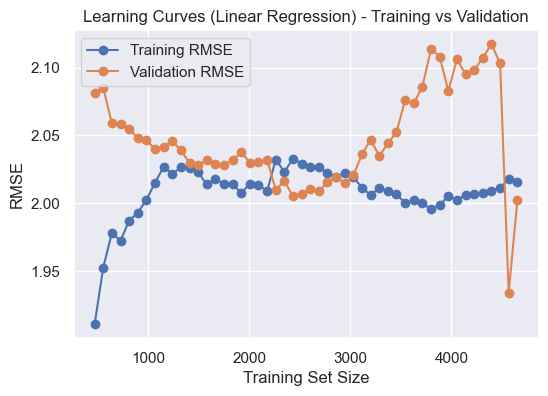

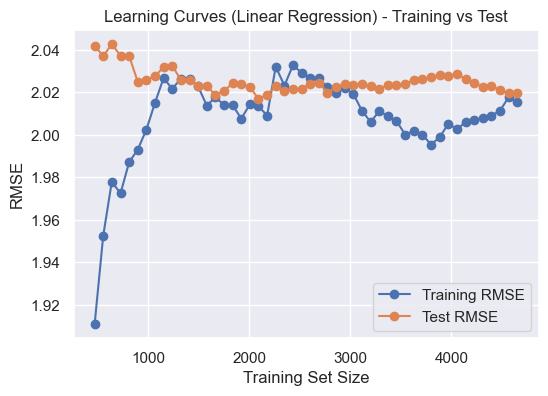

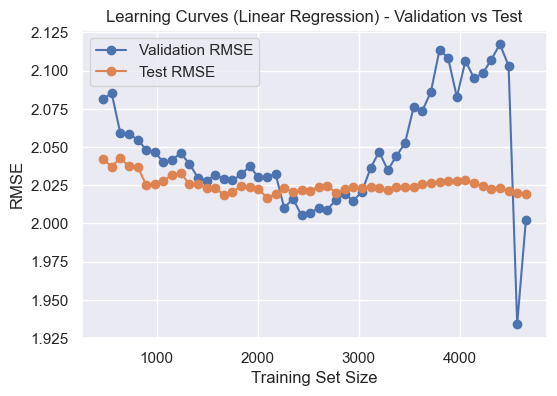

In [50]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training+validation and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize lists to store RMSEs for different set sizes
train_errors, val_errors, test_errors = [], [], []

# Generate 50 training set sizes between 10% and 99% of the full training set
train_sizes = (np.linspace(0.1, 0.99, 50) * len(X_train_val)).astype(int)

for train_size in train_sizes:
    # Split the data into training and validation sets
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_val, y_train_val, train_size=train_size, random_state=42
    )
    
    # Train the model
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    # Make predictions
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    y_test_pred = model.predict(X_test)
    
    # Calculate RMSE and append to lists
    train_errors.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
    val_errors.append(np.sqrt(mean_squared_error(y_val, y_val_pred)))
    test_errors.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))

# Plotting Training vs Validation
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, train_errors, label='Training RMSE', marker='o')
plt.plot(train_sizes, val_errors, label='Validation RMSE', marker='o')
plt.title('Learning Curves (Linear Regression) - Training vs Validation')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# Plotting Training vs Test
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, train_errors, label='Training RMSE', marker='o')
plt.plot(train_sizes, test_errors, label='Test RMSE', marker='o')
plt.title('Learning Curves (Linear Regression) - Training vs Test')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# Plotting Validation vs Test
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, val_errors, label='Validation RMSE', marker='o')
plt.plot(train_sizes, test_errors, label='Test RMSE', marker='o')
plt.title('Learning Curves (Linear Regression) - Validation vs Test')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# Pipeline Model on Motor UPDRS

In [51]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Define features and target variable for aveOralF
X = Data.drop(['motor_UPDRS'], axis=1)
y = Data['motor_UPDRS']

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.3, random_state=42)

# Create a pipeline with scaling and linear regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict using the pipeline on the validation and test data
y_val_pred = pipeline.predict(X_val)
y_test_pred = pipeline.predict(X_test)

# Calculate the MSE and R-squared values for the validation and test sets
val_mse = mean_squared_error(y_val, y_val_pred)
val_r2 = r2_score(y_val, y_val_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

# Print the results
print(f"Pipeline Regression Validation MSE: {val_mse}")
print(f"Pipeline Regression Validation R-squared: {val_r2}")
print(f"Pipeline Regression Test MSE: {test_mse}")
print(f"Pipeline Regression Test R-squared: {test_r2}")

Pipeline Regression Validation MSE: 3.0072899113900595
Pipeline Regression Validation R-squared: 0.9537119044773293
Pipeline Regression Test MSE: 2.821808987241055
Pipeline Regression Test R-squared: 0.9537024621298921


# Pipeline Model on Total UPDRS

In [52]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Define features and target variable for aveOralF
X = Data.drop(['total_UPDRS'], axis=1)
y = Data['total_UPDRS']

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.3, random_state=42)

# Create a pipeline with scaling and linear regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict using the pipeline on the validation and test data
y_val_pred = pipeline.predict(X_val)
y_test_pred = pipeline.predict(X_test)

# Calculate the MSE and R-squared values for the validation and test sets
val_mse = mean_squared_error(y_val, y_val_pred)
val_r2 = r2_score(y_val, y_val_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

# Print the results
print(f"Pipeline Regression Validation MSE total_UPDRS: {val_mse}")
print(f"Pipeline Regression Validation R-squared total_UPDRS: {val_r2}")
print(f"Pipeline Regression Test MSE total_UPDRS: {test_mse}")
print(f"Pipeline Regression Test R-squared total_UPDRS: {test_r2}")

Pipeline Regression Validation MSE total_UPDRS: 4.217573190630007
Pipeline Regression Validation R-squared total_UPDRS: 0.9626542136197772
Pipeline Regression Test MSE total_UPDRS: 3.7443417051980266
Pipeline Regression Test R-squared total_UPDRS: 0.9644361468507675


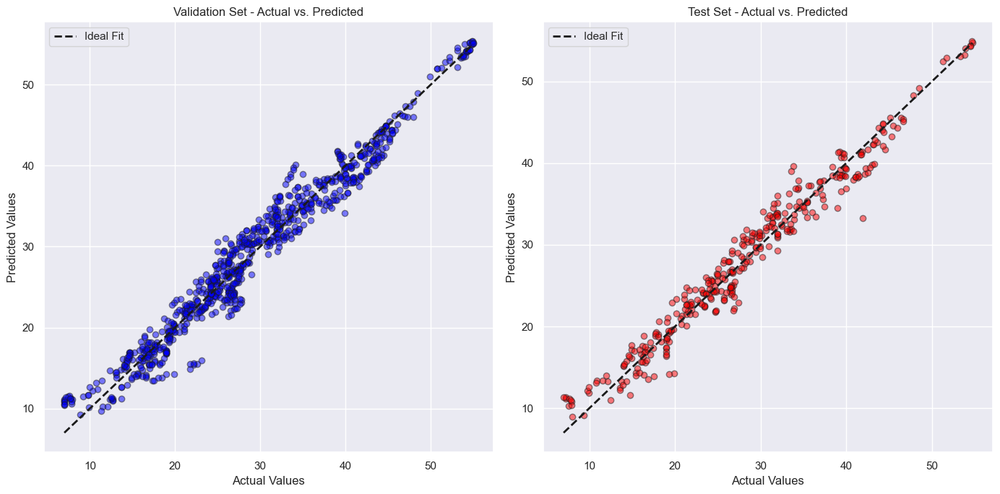

In [53]:
import matplotlib.pyplot as plt
import numpy as np
def plot_actual_vs_predicted(ax, actual, predicted, title, color):
    ax.scatter(actual, predicted, alpha=0.5, color=color, edgecolor='k')
    ax.plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'k--', lw=2, label='Ideal Fit')
    ax.set_title(title)
    ax.set_xlabel('Actual Values')
    ax.set_ylabel('Predicted Values')
    ax.legend()

# Create figure and axes for the subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Plot for the validation set
plot_actual_vs_predicted(axes[0], y_val, y_val_pred, 'Validation Set - Actual vs. Predicted', 'blue')

# Plot for the test set
plot_actual_vs_predicted(axes[1], y_test, y_test_pred, 'Test Set - Actual vs. Predicted', 'red')

# Show the plot
plt.tight_layout()
plt.show()


# Pipeline RMSE MAE  Motor UPDRS

In [54]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split
import numpy as np

# Define features and target variable for motor_UPDRS
X = Data.drop(['motor_UPDRS'], axis=1)
y = Data['motor_UPDRS']

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create a pipeline with scaling and linear regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Make predictions using the pipeline on the training, validation, and test sets
y_train_pred = pipeline.predict(X_train)
y_val_pred = pipeline.predict(X_val)
y_test_pred = pipeline.predict(X_test)

# Calculate the RMSE and MAE for the training set
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
train_mae = mean_absolute_error(y_train, y_train_pred)

# Calculate the RMSE and MAE for the validation set
val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
val_mae = mean_absolute_error(y_val, y_val_pred)

# Calculate the RMSE and MAE for the test set
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_mae = mean_absolute_error(y_test, y_test_pred)

# Print the results
print(f"Pipeline Model Training RMSE: {train_rmse}")
print(f"Pipeline Model Training MAE: {train_mae}")
print(f"Pipeline Model Validation RMSE: {val_rmse}")
print(f"Pipeline Model Validation MAE: {val_mae}")
print(f"Pipeline Model Test RMSE: {test_rmse}")
print(f"Pipeline Model Test MAE: {test_mae}")

Pipeline Model Training RMSE: 1.7070628362509326
Pipeline Model Training MAE: 1.3483632911430474
Pipeline Model Validation RMSE: 1.7481980988552333
Pipeline Model Validation MAE: 1.3894740979981497
Pipeline Model Test RMSE: 1.687339551284291
Pipeline Model Test MAE: 1.317648491912792


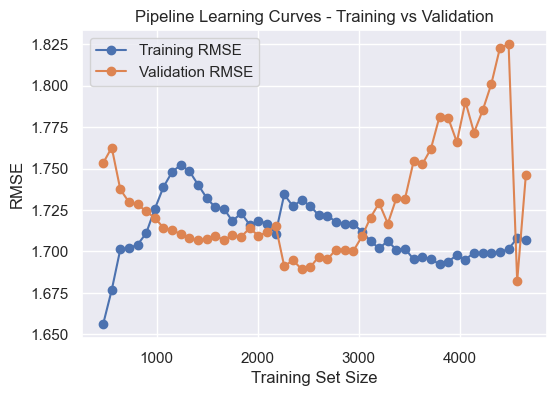

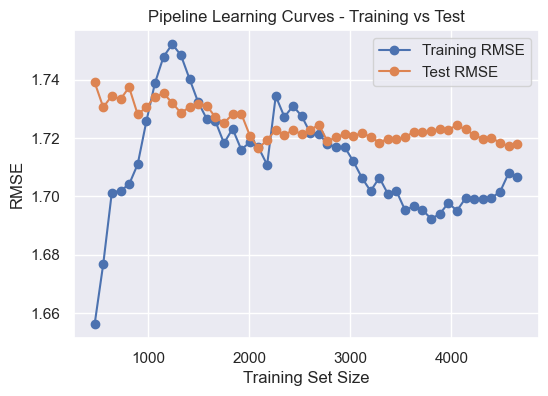

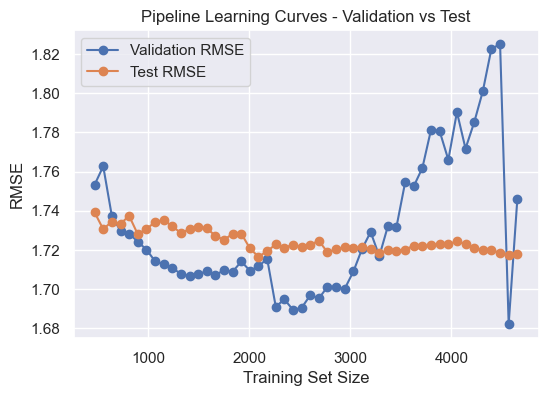

In [55]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming 'Data' is your DataFrame and 'motor_UPDRS' is the target variable

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training+validation and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize lists to store RMSEs for different set sizes
train_errors, val_errors, test_errors = [], [], []

# Generate training set sizes
train_sizes = (np.linspace(0.1, 0.99, 50) * len(X_train_val)).astype(int)

# Create the pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Data scaling
    ('regressor', LinearRegression())  # Regression model
])

for train_size in train_sizes:
    # Split the data into training and validation sets
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_val, y_train_val, train_size=train_size, random_state=42
    )
    
    # Train the pipeline
    pipeline.fit(X_train, y_train)
    
    # Make predictions
    y_train_pred = pipeline.predict(X_train)
    y_val_pred = pipeline.predict(X_val)
    y_test_pred = pipeline.predict(X_test)
    
    # Calculate RMSE and append to lists
    train_errors.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
    val_errors.append(np.sqrt(mean_squared_error(y_val, y_val_pred)))
    test_errors.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))

# Plotting Training vs Validation
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, train_errors, label='Training RMSE', marker='o')
plt.plot(train_sizes, val_errors, label='Validation RMSE', marker='o')
plt.title('Pipeline Learning Curves - Training vs Validation')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# Plotting Training vs Test
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, train_errors, label='Training RMSE', marker='o')
plt.plot(train_sizes, test_errors, label='Test RMSE', marker='o')
plt.title('Pipeline Learning Curves - Training vs Test')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# Plotting Validation vs Test
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, val_errors, label='Validation RMSE', marker='o')
plt.plot(train_sizes, test_errors, label='Test RMSE', marker='o')
plt.title('Pipeline Learning Curves - Validation vs Test')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

#  Pipeline RMSE MAE    Total UPDRS

In [56]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split
import numpy as np

# Define features and target variable for motor_UPDRS
X = Data.drop(['total_UPDRS'], axis=1)
y = Data['total_UPDRS']

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Create a pipeline with scaling and linear regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Make predictions using the pipeline on the training, validation, and test sets
y_train_pred = pipeline.predict(X_train)
y_val_pred = pipeline.predict(X_val)
y_test_pred = pipeline.predict(X_test)

# Calculate the RMSE and MAE for the training set
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
train_mae = mean_absolute_error(y_train, y_train_pred)

# Calculate the RMSE and MAE for the validation set
val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
val_mae = mean_absolute_error(y_val, y_val_pred)

# Calculate the RMSE and MAE for the test set
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_mae = mean_absolute_error(y_test, y_test_pred)

# Print the results
print(f"Pipeline Model Training RMSE: {train_rmse}")
print(f"Pipeline Model Training MAE: {train_mae}")
print(f"Pipeline Model Validation RMSE: {val_rmse}")
print(f"Pipeline Model Validation MAE: {val_mae}")
print(f"Pipeline Model Test RMSE: {test_rmse}")
print(f"Pipeline Model Test MAE: {test_mae}")


Pipeline Model Training RMSE: 2.015212285278486
Pipeline Model Training MAE: 1.5639467392115958
Pipeline Model Validation RMSE: 2.062906033527171
Pipeline Model Validation MAE: 1.610784773776602
Pipeline Model Test RMSE: 1.9737096704923198
Pipeline Model Test MAE: 1.552771603636034


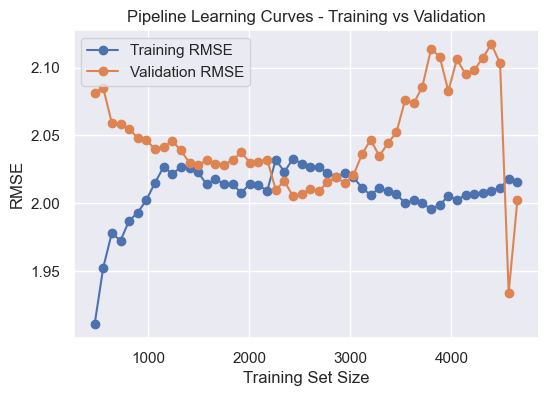

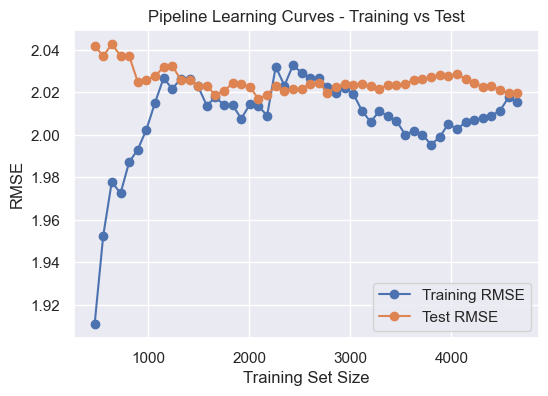

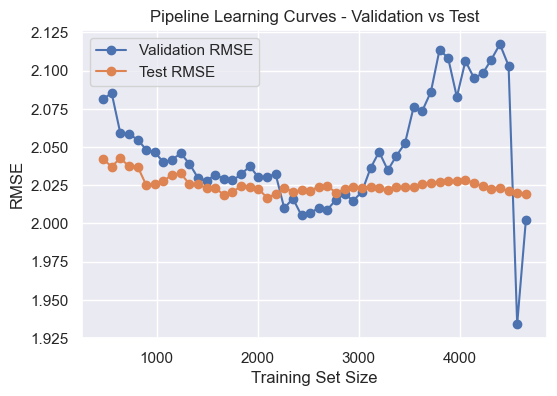

In [57]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming 'Data' is your DataFrame and 'motor_UPDRS' is the target variable

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training+validation and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize lists to store RMSEs for different set sizes
train_errors, val_errors, test_errors = [], [], []

# Generate training set sizes
train_sizes = (np.linspace(0.1, 0.99, 50) * len(X_train_val)).astype(int)

# Create the pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Data scaling
    ('regressor', LinearRegression())  # Regression model
])

for train_size in train_sizes:
    # Split the data into training and validation sets
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_val, y_train_val, train_size=train_size, random_state=42
    )
    
    # Train the pipeline
    pipeline.fit(X_train, y_train)
    
    # Make predictions
    y_train_pred = pipeline.predict(X_train)
    y_val_pred = pipeline.predict(X_val)
    y_test_pred = pipeline.predict(X_test)
    
    # Calculate RMSE and append to lists
    train_errors.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
    val_errors.append(np.sqrt(mean_squared_error(y_val, y_val_pred)))
    test_errors.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))

# Plotting Training vs Validation
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, train_errors, label='Training RMSE', marker='o')
plt.plot(train_sizes, val_errors, label='Validation RMSE', marker='o')
plt.title('Pipeline Learning Curves - Training vs Validation')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# Plotting Training vs Test
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, train_errors, label='Training RMSE', marker='o')
plt.plot(train_sizes, test_errors, label='Test RMSE', marker='o')
plt.title('Pipeline Learning Curves - Training vs Test')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# Plotting Validation vs Test
plt.figure(figsize=(6, 4))
plt.plot(train_sizes, val_errors, label='Validation RMSE', marker='o')
plt.plot(train_sizes, test_errors, label='Test RMSE', marker='o')
plt.title('Pipeline Learning Curves - Validation vs Test')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.legend()
plt.show()

# RandomForestRegressor Model on Motor UPDRS 

In [58]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, random_state=42)

# Initialize the RandomForestRegressor model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
rf_model.fit(X_train, y_train)

# Predict on the validation set
y_val_pred_rf = rf_model.predict(X_val)

# Predict on the test set
y_test_pred_rf = rf_model.predict(X_test)

# Calculate MSE and R-squared for the validation set
mse_val_rf = mean_squared_error(y_val, y_val_pred_rf)
r2_val_rf = r2_score(y_val, y_val_pred_rf)

# Calculate MSE and R-squared for the test set
mse_test_rf = mean_squared_error(y_test, y_test_pred_rf)
r2_test_rf = r2_score(y_test, y_test_pred_rf)

# Print the MSE and R-squared for validation and test sets
print(f"Random Forest Regression Validation MSE: {mse_val_rf}")
print(f"Random Forest Regression Validation R-squared: {r2_val_rf}")
print(f"Random Forest Regression Test MSE: {mse_test_rf}")
print(f"Random Forest Regression Test R-squared: {r2_test_rf}")


Random Forest Regression Validation MSE: 0.17031848392346582
Random Forest Regression Validation R-squared: 0.997416461171267
Random Forest Regression Test MSE: 0.1069605539472957
Random Forest Regression Test R-squared: 0.9983242699174605


# GridSearchCV on RandomForestRegressor Model on Motor UPDRS 

In [59]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.model_selection import train_test_split, GridSearchCV


# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']  # Removed 'auto' and using valid parameters
}

# Initialize the RandomForestRegressor model
rf_model = RandomForestRegressor(random_state=42)

# Initialize GridSearchCV object with RandomForestRegressor and negative mean squared error scoring
grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='neg_mean_squared_error',  # Optimization on negative MSE to find the best model
    verbose=2,
    n_jobs=-1
)

# Fit the GridSearchCV object to the full training data
grid_search.fit(X_train_full, y_train_full)

# Print the best parameters and the best MSE (negative) score from cross-validation
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validated MSE: ", -grid_search.best_score_)

# Best model according to grid search
best_rf_model = grid_search.best_estimator_

# Predict on the test set using the best model
y_test_pred_best_rf = best_rf_model.predict(X_test)

# Calculate MSE and R-squared for the test set using the best model
mse_test_best_rf = mean_squared_error(y_test, y_test_pred_best_rf)
r2_test_best_rf = r2_score(y_test, y_test_pred_best_rf)

# Print the MSE and R-squared for the best model on the test set
print("Random Forest Best Model Test MSE: ", mse_test_best_rf)
print("Random Forest Best Model Test R-squared: ", r2_test_best_rf)


Fitting 5 folds for each of 162 candidates, totalling 810 fits
Best parameters found:  {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best cross-validated MSE:  1.2233834221247537
Random Forest Best Model Test MSE:  0.9251203071663119
Random Forest Best Model Test R-squared:  0.9855063210550434


##### best performance: 
 based on the provided data, the original Random Forest Regression model demonstrates better performance.
 
Original Random Forest Regression:

Validation MSE: 0.17031848392346582

Validation R-squared: 0.997416461171267

Test MSE: 0.1069605539472957

Test R-squared: 0.9983242699174605

# RandomForestRegressor Model on Total UPDRS 

In [60]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Assuming 'Data' is your DataFrame and 'motor_UPDRS' is the target variable

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, random_state=42)

# Initialize the RandomForestRegressor model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
rf_model.fit(X_train, y_train)

# Predict on the validation set
y_val_pred_rf = rf_model.predict(X_val)

# Predict on the test set
y_test_pred_rf = rf_model.predict(X_test)

# Calculate MSE and R-squared for the validation set
mse_val_rf = mean_squared_error(y_val, y_val_pred_rf)
r2_val_rf = r2_score(y_val, y_val_pred_rf)

# Calculate MSE and R-squared for the test set
mse_test_rf = mean_squared_error(y_test, y_test_pred_rf)
r2_test_rf = r2_score(y_test, y_test_pred_rf)

# Print the MSE and R-squared for validation and test sets
print(f"Random Forest Regression Validation MSE: {mse_val_rf}")
print(f"Random Forest Regression Validation R-squared: {r2_val_rf}")
print(f"Random Forest Regression Test MSE: {mse_test_rf}")
print(f"Random Forest Regression Test R-squared: {r2_test_rf}")

Random Forest Regression Validation MSE: 0.2348550252840772
Random Forest Regression Validation R-squared: 0.9979336652175957
Random Forest Regression Test MSE: 0.21536188910060866
Random Forest Regression Test R-squared: 0.9980565294242764


# GridSearchCV on RandomForestRegressor Model on Total UPDRS

In [61]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.model_selection import train_test_split, GridSearchCV


# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']  
}

# Initialize the RandomForestRegressor model
rf_model = RandomForestRegressor(random_state=42)

# Initialize GridSearchCV object with RandomForestRegressor and negative mean squared error scoring
grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='neg_mean_squared_error',  #
    verbose=2,
    n_jobs=-1
)

# Fit the GridSearchCV object to the full training data
grid_search.fit(X_train_full, y_train_full)

# Print the best parameters and the best MSE (negative) score from cross-validation
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validated MSE: ", -grid_search.best_score_)

# Best model according to grid search
best_rf_model = grid_search.best_estimator_

# Predict on the test set using the best model
y_test_pred_best_rf = best_rf_model.predict(X_test)

# Calculate MSE and R-squared for the test set using the best model
mse_test_best_rf = mean_squared_error(y_test, y_test_pred_best_rf)
r2_test_best_rf = r2_score(y_test, y_test_pred_best_rf)

# Print the MSE and R-squared for the best model on the test set
print("Random Forest Best Model Test MSE: ", mse_test_best_rf)
print("Random Forest Best Model Test R-squared: ", r2_test_best_rf)


Fitting 5 folds for each of 162 candidates, totalling 810 fits
Best parameters found:  {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best cross-validated MSE:  1.676438620027882
Random Forest Best Model Test MSE:  1.214410288651696
Random Forest Best Model Test R-squared:  0.9890409084322803


###### best performance
the original Random Forest Regression model has better performance than the tuned model, as it provides more accurate predictions and a better fit to the data.

Original Random Forest Regression:

Validation MSE: 0.2348550252840772

Validation R-squared: 0.9979336652175957

Test MSE: 0.21536188910060866

Test R-squared: 0.9980565294242764

# RandomForestRegressor  RMSE and MAE Motor UPDRS

In [62]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
import numpy as np


# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, random_state=42)

# Create a pipeline with scaling and random forest regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Make predictions using the pipeline on the training set
y_train_pred = pipeline.predict(X_train)

# Make predictions using the pipeline on the validation set
y_val_pred = pipeline.predict(X_val)

# Make predictions using the pipeline on the test set
y_test_pred = pipeline.predict(X_test)

# Calculate the RMSE and MAE for the training set
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
train_mae = mean_absolute_error(y_train, y_train_pred)

# Calculate the RMSE and MAE for the validation set
val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
val_mae = mean_absolute_error(y_val, y_val_pred)

# Calculate the RMSE and MAE for the test set
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_mae = mean_absolute_error(y_test, y_test_pred)

# Print the RMSE and MAE for training, validation, and test sets
print(f"Random Forest Model Training RMSE: {train_rmse}")
print(f"Random Forest Model Training MAE: {train_mae}")
print(f"Random Forest Model Validation RMSE: {val_rmse}")
print(f"Random Forest Model Validation MAE: {val_mae}")
print(f"Random Forest Model Test RMSE: {test_rmse}")
print(f"Random Forest Model Test MAE: {test_mae}")


Random Forest Model Training RMSE: 0.1444643957890552
Random Forest Model Training MAE: 0.08289368765957372
Random Forest Model Validation RMSE: 0.4180698445645802
Random Forest Model Validation MAE: 0.22039687574467992
Random Forest Model Test RMSE: 0.3271863378154819
Random Forest Model Test MAE: 0.20034439574468033


# RandomForestRegressor  RMSE and MAE Total UPDRS

In [63]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
import numpy as np

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, random_state=42)

# Create a pipeline with scaling and random forest regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Make predictions using the pipeline on the training set
y_train_pred = pipeline.predict(X_train)

# Make predictions using the pipeline on the validation set
y_val_pred = pipeline.predict(X_val)

# Make predictions using the pipeline on the test set
y_test_pred = pipeline.predict(X_test)

# Calculate the RMSE and MAE for the training set
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
train_mae = mean_absolute_error(y_train, y_train_pred)

# Calculate the RMSE and MAE for the validation set
val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
val_mae = mean_absolute_error(y_val, y_val_pred)

# Calculate the RMSE and MAE for the test set
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_mae = mean_absolute_error(y_test, y_test_pred)

# Print the RMSE and MAE for training, validation, and test sets
print(f"Random Forest Model Training RMSE: {train_rmse}")
print(f"Random Forest Model Training MAE: {train_mae}")
print(f"Random Forest Model Validation RMSE: {val_rmse}")
print(f"Random Forest Model Validation MAE: {val_mae}")
print(f"Random Forest Model Test RMSE: {test_rmse}")
print(f"Random Forest Model Test MAE: {test_mae}")


Random Forest Model Training RMSE: 0.18773805838534333
Random Forest Model Training MAE: 0.10117157163120624
Random Forest Model Validation RMSE: 0.4869988543207067
Random Forest Model Validation MAE: 0.2667697114893611
Random Forest Model Test RMSE: 0.46163944907481896
Random Forest Model Test MAE: 0.2562447021276587


# KNeighborsRegressor Model for Motor UPDRS 

In [64]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score


# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training, validation, and test sets
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Initialize the KNeighborsRegressor model
knn_model = KNeighborsRegressor(n_neighbors=2)

# Fit the model on the training data
knn_model.fit(X_train, y_train)

# Predict and evaluate on the validation set
y_val_pred = knn_model.predict(X_val)
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Predict and evaluate on the test set
y_test_pred = knn_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print the results
print(f"KNeighborsRegressor Validation MSE: {mse_val}")
print(f"KNeighborsRegressor Validation R-squared: {r2_val}")
print(f"KNeighborsRegressor Test MSE: {mse_test}")
print(f"KNeighborsRegressor Test R-squared: {r2_test}")


KNeighborsRegressor Validation MSE: 2.0560328396191485
KNeighborsRegressor Validation R-squared: 0.9688123064981424
KNeighborsRegressor Test MSE: 1.5598709186063828
KNeighborsRegressor Test R-squared: 0.9755618073511914


# GridSearchCV on KNeighborsRegressor Model on Motor UPDRS

In [65]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split


# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training+validation and test sets (80% train+validation, 20% test)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training+validation data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Define the parameter grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

# Initialize a KNeighborsRegressor
knn = KNeighborsRegressor()

# Initialize Grid Search with the KNeighborsRegressor and parameter grid
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

# Fit the Grid Search to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {grid_search.best_params_}")

# Use the best estimator to make predictions on the validation and test sets
best_knn = grid_search.best_estimator_
y_val_pred = best_knn.predict(X_val)
y_test_pred = best_knn.predict(X_test)

# Calculate MSE and R-squared for the validation set
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Calculate MSE and R-squared for the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out the evaluation metrics for validation and test sets
print(f"Optimized KNeighborsRegressor Validation MSE: {mse_val}")
print(f"Optimized KNeighborsRegressor Validation R-squared: {r2_val}")
print(f"Optimized KNeighborsRegressor Test MSE: {mse_test}")
print(f"Optimized KNeighborsRegressor Test R-squared: {r2_test}")


Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters found: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Optimized KNeighborsRegressor Validation MSE: 0.6103325231486608
Optimized KNeighborsRegressor Validation R-squared: 0.9907419457027244
Optimized KNeighborsRegressor Test MSE: 0.47692056592174575
Optimized KNeighborsRegressor Test R-squared: 0.9925281787555938


### best performance 
the optimized KNeighborsRegressor demonstrates better performance, providing more accurate and reliable predictions than the original model.
Optimized KNeighborsRegressor (after GridSearchCV tuning):

Validation MSE: 0.6103325231486608

Validation R-squared: 0.9907419457027244

Test MSE: 0.47692056592174575

Test R-squared: 0.9925281787555938

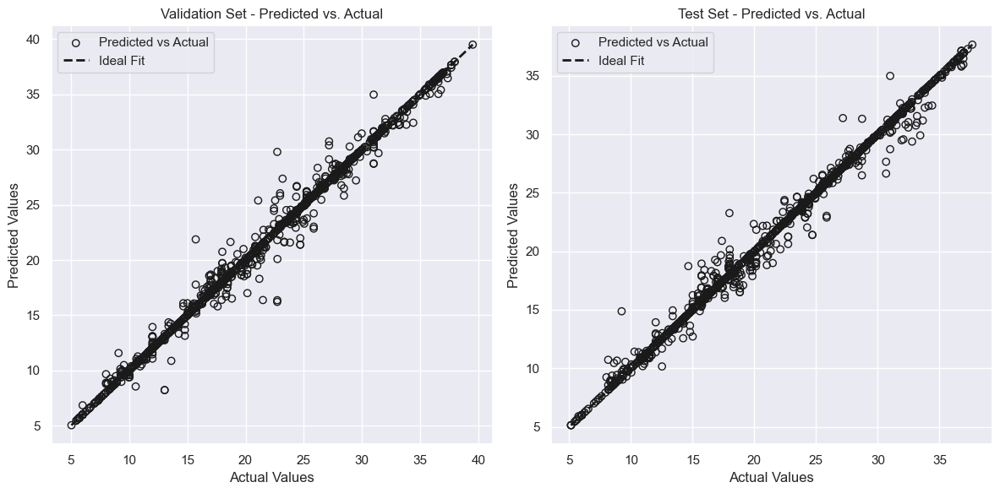

In [66]:
import matplotlib.pyplot as plt

# Plot for the validation set
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_val, y_val_pred, edgecolors='k', facecolors='none', label='Predicted vs Actual')
plt.plot([y_val.min(), y_val.max()], [y_val.min(), y_val.max()], 'k--', lw=2, label='Ideal Fit')
plt.title('Validation Set - Predicted vs. Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()

# Plot for the test set
plt.subplot(1, 2, 2)
plt.scatter(y_test, y_test_pred, edgecolors='k', facecolors='none', label='Predicted vs Actual')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, label='Ideal Fit')
plt.title('Test Set - Predicted vs. Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()

plt.tight_layout()
plt.show()


# KNeighborsRegressor Model for Total UPDRS 

In [67]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score


# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training, validation, and test sets
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Initialize the KNeighborsRegressor model
knn_model = KNeighborsRegressor(n_neighbors=2)

# Fit the model on the training data
knn_model.fit(X_train, y_train)

# Predict and evaluate on the validation set
y_val_pred = knn_model.predict(X_val)
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Predict and evaluate on the test set
y_test_pred = knn_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print the results
print(f"KNeighborsRegressor Validation MSE: {mse_val}")
print(f"KNeighborsRegressor Validation R-squared: {r2_val}")
print(f"KNeighborsRegressor Test MSE: {mse_test}")
print(f"KNeighborsRegressor Test R-squared: {r2_test}")

KNeighborsRegressor Validation MSE: 5.126864922831915
KNeighborsRegressor Validation R-squared: 0.9548920901227397
KNeighborsRegressor Test MSE: 3.216653489314894
KNeighborsRegressor Test R-squared: 0.9709722484563557


# GridSearchCV ON KNeighborsRegressor for  Total UPDRS

In [68]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split



# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training+validation and test sets (80% train+validation, 20% test)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training+validation data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Define the parameter grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

# Initialize a KNeighborsRegressor
knn = KNeighborsRegressor()

# Initialize Grid Search with the KNeighborsRegressor and parameter grid
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

# Fit the Grid Search to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {grid_search.best_params_}")

# Use the best estimator to make predictions on the validation and test sets
best_knn = grid_search.best_estimator_
y_val_pred = best_knn.predict(X_val)
y_test_pred = best_knn.predict(X_test)

# Calculate MSE and R-squared for the validation set
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Calculate MSE and R-squared for the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out the evaluation metrics for validation and test sets
print(f"Optimized KNeighborsRegressor Validation MSE: {mse_val}")
print(f"Optimized KNeighborsRegressor Validation R-squared: {r2_val}")
print(f"Optimized KNeighborsRegressor Test MSE: {mse_test}")
print(f"Optimized KNeighborsRegressor Test R-squared: {r2_test}")

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters found: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Optimized KNeighborsRegressor Validation MSE: 1.3370756817005844
Optimized KNeighborsRegressor Validation R-squared: 0.9882359511598149
Optimized KNeighborsRegressor Test MSE: 0.6525990773151071
Optimized KNeighborsRegressor Test R-squared: 0.994110809903261


#### best performance:
the optimized KNeighborsRegressor outperforms the original version, offering more accurate and reliable predictions.

Optimized KNeighborsRegressor (after GridSearchCV tuning):

Validation MSE: 1.3370756817005844

Validation R-squared: 0.9882359511598149

Test MSE: 0.6525990773151071

Test R-squared: 0.994110809903261








# KNeighborsRegressor Model  for RMSE and MAE  Motor UPDRS¶

In [69]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from math import sqrt

# Assuming 'Data' is your DataFrame and 'motor_UPDRS' is the target variable

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the KNeighborsRegressor model
knn_model = KNeighborsRegressor(n_neighbors=5)  # You can tune the number of neighbors

# Fit the model on the training data
knn_model.fit(X_train, y_train)

# Predict on the test set
y_test_pred_knn = knn_model.predict(X_test)

# Calculate RMSE and MAE for the test set
rmse_knn = sqrt(mean_squared_error(y_test, y_test_pred_knn))
mae_knn = mean_absolute_error(y_test, y_test_pred_knn)

# Print the RMSE and MAE for the KNeighborsRegressor on the test set
print("KNeighborsRegressor Test RMSE: ", rmse_knn)
print("KNeighborsRegressor Test MAE: ", mae_knn)


KNeighborsRegressor Test RMSE:  1.4486399554647287
KNeighborsRegressor Test MAE:  1.0114220425531915


# KNeighborsRegressor Model for  RMSE and MAE Total UPDRS¶

In [70]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from math import sqrt

# Assuming 'Data' is your DataFrame and 'motor_UPDRS' is the target variable

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the KNeighborsRegressor model
knn_model = KNeighborsRegressor(n_neighbors=5)  # You can tune the number of neighbors

# Fit the model on the training data
knn_model.fit(X_train, y_train)

# Predict on the test set
y_test_pred_knn = knn_model.predict(X_test)

# Calculate RMSE and MAE for the test set
rmse_knn = sqrt(mean_squared_error(y_test, y_test_pred_knn))
mae_knn = mean_absolute_error(y_test, y_test_pred_knn)

# Print the RMSE and MAE for the KNeighborsRegressor on the test set
print("KNeighborsRegressor Test RMSE: ", rmse_knn)
print("KNeighborsRegressor Test MAE: ", mae_knn)


KNeighborsRegressor Test RMSE:  2.1956881421935113
KNeighborsRegressor Test MAE:  1.4763761531914896


# DecisionTreeRegressor Model for Motor UPDRS

Decision Tree Regressor Validation MSE for total_UPDRS: 0.5081093040851065
Decision Tree Regressor Validation R2 for total_UPDRS: 0.9922925563561602
Decision Tree Regressor Test MSE for total_UPDRS: 0.3546531214042553
Decision Tree Regressor Test R2 for total_UPDRS: 0.9944437188994318


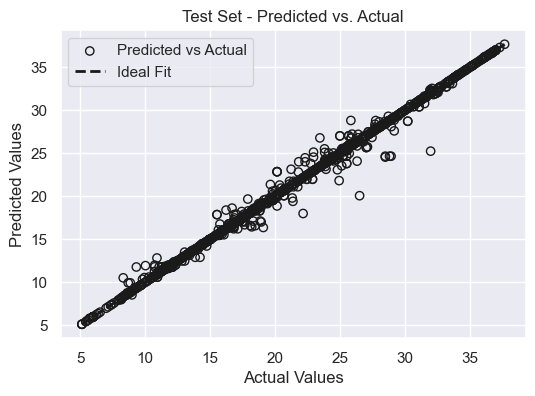

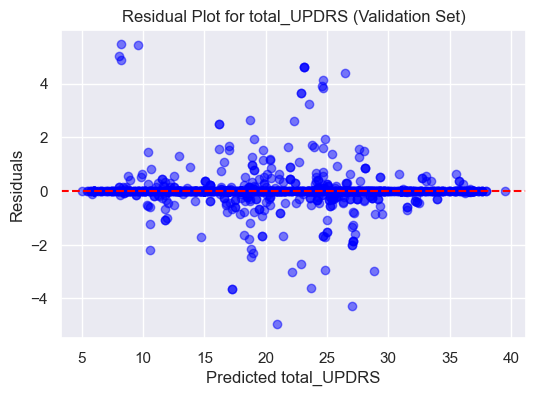

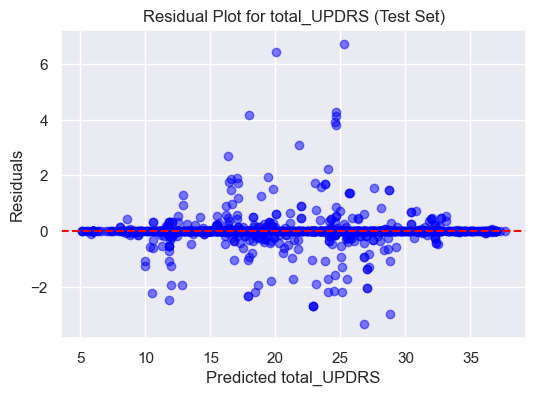

In [71]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt



# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target columns
y = Data['motor_UPDRS']  # Target variable for total_UPDRS

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Further split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Initialize the Decision Tree Regressor
decision_tree_model_total_UPDRS = DecisionTreeRegressor(random_state=42)

# Fit the model on the training data
decision_tree_model_total_UPDRS.fit(X_train, y_train)

# Predict on the validation set
y_val_pred_total_UPDRS = decision_tree_model_total_UPDRS.predict(X_val)

# Predict on the test set
y_test_pred_total_UPDRS = decision_tree_model_total_UPDRS.predict(X_test)

# Calculate the Mean Squared Error and R-squared for the validation set
mse_val_total_UPDRS = mean_squared_error(y_val, y_val_pred_total_UPDRS)
r2_val_total_UPDRS = r2_score(y_val, y_val_pred_total_UPDRS)

# Calculate the Mean Squared Error and R-squared for the test set
mse_test_total_UPDRS = mean_squared_error(y_test, y_test_pred_total_UPDRS)
r2_test_total_UPDRS = r2_score(y_test, y_test_pred_total_UPDRS)

# Print out the evaluation metrics for validation and test sets
print(f"Decision Tree Regressor Validation MSE for total_UPDRS: {mse_val_total_UPDRS}")
print(f"Decision Tree Regressor Validation R2 for total_UPDRS: {r2_val_total_UPDRS}")
print(f"Decision Tree Regressor Test MSE for total_UPDRS: {mse_test_total_UPDRS}")
print(f"Decision Tree Regressor Test R2 for total_UPDRS: {r2_test_total_UPDRS}")

# Plotting the predictions vs actual values for the test set
plt.figure(figsize=(6, 4))
plt.scatter(y_test, y_test_pred_total_UPDRS, edgecolors='k', facecolors='none', label='Predicted vs Actual')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, label='Ideal Fit')
plt.title('Test Set - Predicted vs. Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()


import matplotlib.pyplot as plt

# Calculate residuals for the validation set
residuals_val_total_UPDRS = y_val - y_val_pred_total_UPDRS

# Create residual plot for the validation set
plt.figure(figsize=(6, 4))
plt.scatter(y_val_pred_total_UPDRS, residuals_val_total_UPDRS, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residual Plot for total_UPDRS (Validation Set)')
plt.xlabel('Predicted total_UPDRS')
plt.ylabel('Residuals')
plt.grid(True)
plt.show()

# Calculate residuals for the test set
residuals_test_total_UPDRS = y_test - y_test_pred_total_UPDRS

# Create residual plot for the test set
plt.figure(figsize=(6, 4))
plt.scatter(y_test_pred_total_UPDRS, residuals_test_total_UPDRS, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residual Plot for total_UPDRS (Test Set)')
plt.xlabel('Predicted total_UPDRS')
plt.ylabel('Residuals')
plt.grid(True)
plt.show()


# GridSearchCV ON DecisionTreeRegressor for Motor UPDRS

In [72]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target columns
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Initialize the DecisionTreeRegressor
dtree = DecisionTreeRegressor(random_state=42)

# Initialize Grid Search with the DecisionTreeRegressor and parameter grid
grid_search = GridSearchCV(dtree, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

# Fit the Grid Search to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {grid_search.best_params_}")

# Use the best estimator to make predictions
best_dtree = grid_search.best_estimator_
y_test_pred = best_dtree.predict(X_test)

# Calculate the MSE and R-squared on the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out the MSE and R-squared for the test set
print(f"Optimized Decision Tree Regressor Test MSE: {mse_test}")
print(f"Optimized Decision Tree Regressor Test R-squared: {r2_test}")


Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best parameters found: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5}
Optimized Decision Tree Regressor Test MSE: 0.13807668234769502
Optimized Decision Tree Regressor Test R-squared: 0.9978367796185751


##### best performance 
the optimized Decision Tree Regressor has better performance than the original model.

Optimized Decision Tree Regressor (after tuning):

Test MSE: 0.13807668234769502

Test R2: 0.9978367796185751






# DecisionTreeRegressor Model for Total UPDRS

Decision Tree Regressor Validation MSE for total_UPDRS: 0.4809333188255319
Decision Tree Regressor Validation R2 for total_UPDRS: 0.9957685842851169
Decision Tree Regressor Test MSE for total_UPDRS: 0.5197672459744681
Decision Tree Regressor Test R2 for total_UPDRS: 0.9953095120357883


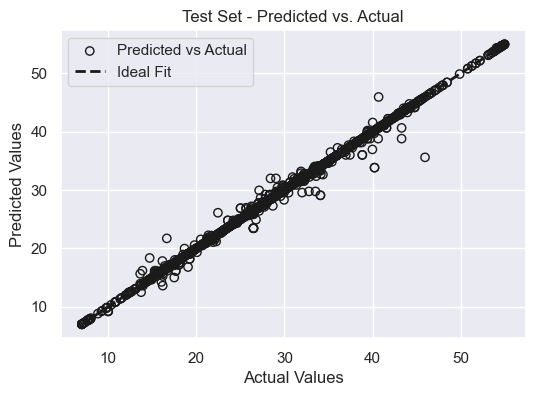

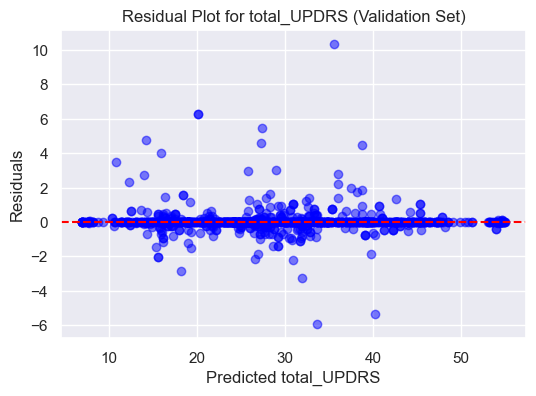

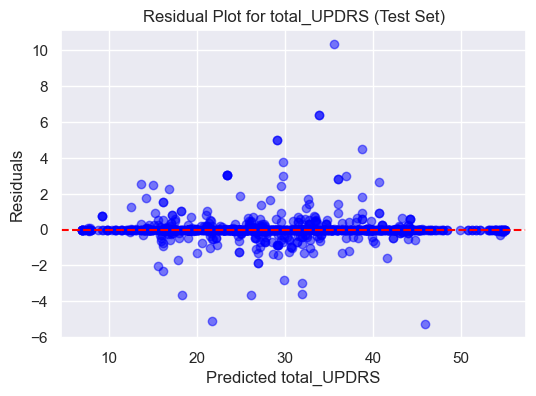

In [73]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Assuming 'Data' is your DataFrame and 'total_UPDRS' is the target variable

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target columns
y = Data['total_UPDRS']  # Target variable for total_UPDRS

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Further split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42)

# Initialize the Decision Tree Regressor
decision_tree_model_total_UPDRS = DecisionTreeRegressor(random_state=42)

# Fit the model on the training data
decision_tree_model_total_UPDRS.fit(X_train, y_train)

# Predict on the validation set
y_val_pred_total_UPDRS = decision_tree_model_total_UPDRS.predict(X_val)

# Predict on the test set
y_test_pred_total_UPDRS = decision_tree_model_total_UPDRS.predict(X_test)

# Calculate the Mean Squared Error and R-squared for the validation set
mse_val_total_UPDRS = mean_squared_error(y_val, y_val_pred_total_UPDRS)
r2_val_total_UPDRS = r2_score(y_val, y_val_pred_total_UPDRS)

# Calculate the Mean Squared Error and R-squared for the test set
mse_test_total_UPDRS = mean_squared_error(y_test, y_test_pred_total_UPDRS)
r2_test_total_UPDRS = r2_score(y_test, y_test_pred_total_UPDRS)

# Print out the evaluation metrics for validation and test sets
print(f"Decision Tree Regressor Validation MSE for total_UPDRS: {mse_val_total_UPDRS}")
print(f"Decision Tree Regressor Validation R2 for total_UPDRS: {r2_val_total_UPDRS}")
print(f"Decision Tree Regressor Test MSE for total_UPDRS: {mse_test_total_UPDRS}")
print(f"Decision Tree Regressor Test R2 for total_UPDRS: {r2_test_total_UPDRS}")

# Plotting the predictions vs actual values for the test set
plt.figure(figsize=(6, 4))
plt.scatter(y_test, y_test_pred_total_UPDRS, edgecolors='k', facecolors='none', label='Predicted vs Actual')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, label='Ideal Fit')
plt.title('Test Set - Predicted vs. Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()


import matplotlib.pyplot as plt

# Calculate residuals for the validation set
residuals_val_total_UPDRS = y_val - y_val_pred_total_UPDRS

# Create residual plot for the validation set
plt.figure(figsize=(6, 4))
plt.scatter(y_val_pred_total_UPDRS, residuals_val_total_UPDRS, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residual Plot for total_UPDRS (Validation Set)')
plt.xlabel('Predicted total_UPDRS')
plt.ylabel('Residuals')
plt.grid(True)
plt.show()

# Calculate residuals for the test set
residuals_test_total_UPDRS = y_test - y_test_pred_total_UPDRS

# Create residual plot for the test set
plt.figure(figsize=(6, 4))
plt.scatter(y_test_pred_total_UPDRS, residuals_test_total_UPDRS, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residual Plot for total_UPDRS (Test Set)')
plt.xlabel('Predicted total_UPDRS')
plt.ylabel('Residuals')
plt.grid(True)
plt.show()


# GridSearchCV ON DecisionTreeRegressor for Total UPDRS

In [74]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target columns
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Initialize the DecisionTreeRegressor
dtree = DecisionTreeRegressor(random_state=42)

# Initialize Grid Search with the DecisionTreeRegressor and parameter grid
grid_search = GridSearchCV(dtree, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

# Fit the Grid Search to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {grid_search.best_params_}")

# Use the best estimator to make predictions
best_dtree = grid_search.best_estimator_
y_test_pred = best_dtree.predict(X_test)

# Calculate the MSE and R-squared on the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out the MSE and R-squared for the test set
print(f"Optimized Decision Tree Regressor Test MSE: {mse_test}")
print(f"Optimized Decision Tree Regressor Test R-squared: {r2_test}")


Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best parameters found: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2}
Optimized Decision Tree Regressor Test MSE: 0.32058111887679197
Optimized Decision Tree Regressor Test R-squared: 0.9971070091636383


#### best performance: 
the optimized Decision Tree Regressor demonstrates better performance compared to the standard version.

Optimized Decision Tree Regressor:

Test MSE: 0.32058111887679197

Test R2: 0.9971070091636383


#  DecisionTreeRegressor for  RMSE and  MAE on Motor UPDRS

In [75]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Assuming 'Data' is your DataFrame and 'motor_UPDRS' is the target variable

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training+validation and test sets (80% train+validation, 20% test)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training+validation data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Initialize the DecisionTreeRegressor model
dt_model = DecisionTreeRegressor(random_state=42)

# Fit the model on the training data
dt_model.fit(X_train, y_train)

# Predict on the training set
y_train_pred = dt_model.predict(X_train)

# Predict on the validation set
y_val_pred = dt_model.predict(X_val)

# Predict on the test set
y_test_pred = dt_model.predict(X_test)

# Calculate RMSE and MAE for the training set
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
mae_train = mean_absolute_error(y_train, y_train_pred)

# Calculate RMSE and MAE for the validation set
rmse_val = np.sqrt(mean_squared_error(y_val, y_val_pred))
mae_val = mean_absolute_error(y_val, y_val_pred)

# Calculate RMSE and MAE for the test set
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
mae_test = mean_absolute_error(y_test, y_test_pred)

# Print the RMSE and MAE for training, validation, and test sets
print(f"DecisionTreeRegressor Training RMSE: {rmse_train}")
print(f"DecisionTreeRegressor Training MAE: {mae_train}")
print(f"DecisionTreeRegressor Validation RMSE: {rmse_val}")
print(f"DecisionTreeRegressor Validation MAE: {mae_val}")
print(f"DecisionTreeRegressor Test RMSE: {rmse_test}")
print(f"DecisionTreeRegressor Test MAE: {mae_test}")

DecisionTreeRegressor Training RMSE: 7.242682708644688e-16
DecisionTreeRegressor Training MAE: 1.5924220177318557e-16
DecisionTreeRegressor Validation RMSE: 0.7128178617887647
DecisionTreeRegressor Validation MAE: 0.2337751489361703
DecisionTreeRegressor Test RMSE: 0.5955275991960871
DecisionTreeRegressor Test MAE: 0.18591838297872346


#  DecisionTreeRegressor for  RMSE and  MAE on Total UPDRS

In [76]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Assuming 'Data' is your DataFrame and 'motor_UPDRS' is the target variable

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training+validation and test sets (80% train+validation, 20% test)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training+validation data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Initialize the DecisionTreeRegressor model
dt_model = DecisionTreeRegressor(random_state=42)

# Fit the model on the training data
dt_model.fit(X_train, y_train)

# Predict on the training set
y_train_pred = dt_model.predict(X_train)

# Predict on the validation set
y_val_pred = dt_model.predict(X_val)

# Predict on the test set
y_test_pred = dt_model.predict(X_test)

# Calculate RMSE and MAE for the training set
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
mae_train = mean_absolute_error(y_train, y_train_pred)

# Calculate RMSE and MAE for the validation set
rmse_val = np.sqrt(mean_squared_error(y_val, y_val_pred))
mae_val = mean_absolute_error(y_val, y_val_pred)

# Calculate RMSE and MAE for the test set
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
mae_test = mean_absolute_error(y_test, y_test_pred)

# Print the RMSE and MAE for training, validation, and test sets
print(f"DecisionTreeRegressor Training RMSE: {rmse_train}")
print(f"DecisionTreeRegressor Training MAE: {mae_train}")
print(f"DecisionTreeRegressor Validation RMSE: {rmse_val}")
print(f"DecisionTreeRegressor Validation MAE: {mae_val}")
print(f"DecisionTreeRegressor Test RMSE: {rmse_test}")
print(f"DecisionTreeRegressor Test MAE: {mae_test}")


DecisionTreeRegressor Training RMSE: 9.838156165658432e-16
DecisionTreeRegressor Training MAE: 1.7965140801310335e-16
DecisionTreeRegressor Validation RMSE: 0.6934935607671725
DecisionTreeRegressor Validation MAE: 0.19477770212765963
DecisionTreeRegressor Test RMSE: 0.7209488511499745
DecisionTreeRegressor Test MAE: 0.2099720851063831


# GradientBoostingRegressor Model for Motor UPDRS

In [77]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training+validation and test sets (80% train+validation, 20% test)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training+validation data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Initialize the GradientBoostingRegressor model
gbr_model = GradientBoostingRegressor(random_state=42)

# Fit the model on the training data
gbr_model.fit(X_train, y_train)

# Predict on the validation set
y_val_pred = gbr_model.predict(X_val)

# Predict on the test set
y_test_pred = gbr_model.predict(X_test)

# Calculate MSE and R-squared for the validation set
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Calculate MSE and R-squared for the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print the MSE and R-squared for validation and test sets
print(f"GradientBoostingRegressor Validation MSE: {mse_val}")
print(f"GradientBoostingRegressor Validation R-squared: {r2_val}")
print(f"GradientBoostingRegressor Test MSE: {mse_test}")
print(f"GradientBoostingRegressor Test R-squared: {r2_test}")


GradientBoostingRegressor Validation MSE: 1.1339061459832473
GradientBoostingRegressor Validation R-squared: 0.9827999258283497
GradientBoostingRegressor Test MSE: 1.1027113881077428
GradientBoostingRegressor Test R-squared: 0.9827240363178972


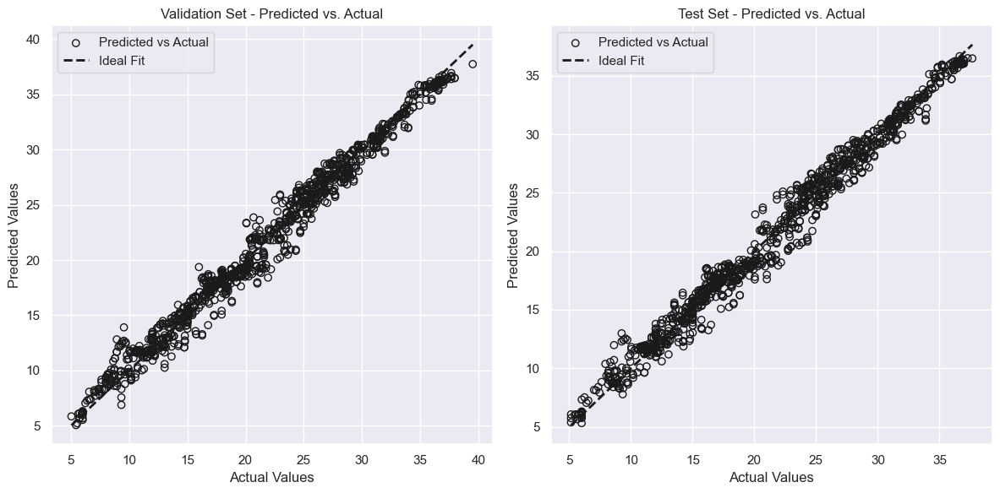

In [78]:
import matplotlib.pyplot as plt

# Plot for the validation set
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(y_val, y_val_pred, edgecolors='k', facecolors='none', label='Predicted vs Actual')
plt.plot([y_val.min(), y_val.max()], [y_val.min(), y_val.max()], 'k--', lw=2, label='Ideal Fit')
plt.title('Validation Set - Predicted vs. Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()

# Plot for the test set
plt.subplot(1, 2, 2)
plt.scatter(y_test, y_test_pred, edgecolors='k', facecolors='none', label='Predicted vs Actual')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, label='Ideal Fit')
plt.title('Test Set - Predicted vs. Actual')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()

plt.tight_layout()
plt.show()


# RandomizedSearchCV on GradientBoostingRegressor Model for motor_UPDRS

In [79]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingRegressor

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter distribution
param_dist = {
    'n_estimators': [100, 200, 300],  # Number of boosting stages to perform
    'learning_rate': [0.01, 0.05, 0.1],  # Shrinks the contribution of each tree
    'max_depth': [3, 4, 5],  # Maximum depth of the individual regression estimators
    'min_samples_split': [2, 4, 6],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 3],  # Minimum number of samples required to be at a leaf node
    'max_features': ['sqrt', 'log2'],  # Number of features to consider when looking for the best split
    # You can add more parameters here to tune
}

# Initialize the GradientBoostingRegressor
gbr = GradientBoostingRegressor(random_state=42)

# Initialize RandomizedSearchCV object
random_search = RandomizedSearchCV(gbr, param_distributions=param_dist, n_iter=10,
                                   scoring='neg_mean_squared_error', cv=5, verbose=1, random_state=42)

# Fit the randomized search to the training data
random_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {random_search.best_params_}")

# Use the best estimator to make predictions
best_gbr = random_search.best_estimator_
y_test_pred = best_gbr.predict(X_test)

# Calculate the MSE and R-squared on the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out the MSE and R-squared for the test set
print(f"Optimized GradientBoostingRegressor Test MSE: {mse_test}")
print(f"Optimized GradientBoostingRegressor Test R-squared: {r2_test}")


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters found: {'n_estimators': 200, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 5, 'learning_rate': 0.1}
Optimized GradientBoostingRegressor Test MSE: 0.6795239514477528
Optimized GradientBoostingRegressor Test R-squared: 0.989354031133681


#### best performance: 
 the optimized GradientBoostingRegressor outperforms the standard model, exhibiting better performance in terms of both accuracy and fit.
 
 Optimized GradientBoostingRegressor:

Test MSE: 0.6795239514477528

Test R2: 0.989354031133681

# GradientBoostingRegressor Model for Total UPDRS

In [80]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training+validation and test sets (80% train+validation, 20% test)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training+validation data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Initialize the GradientBoostingRegressor model
gbr_model = GradientBoostingRegressor(random_state=42)

# Fit the model on the training data
gbr_model.fit(X_train, y_train)

# Predict on the validation set
y_val_pred = gbr_model.predict(X_val)

# Predict on the test set
y_test_pred = gbr_model.predict(X_test)

# Calculate MSE and R-squared for the validation set
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Calculate MSE and R-squared for the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print the MSE and R-squared for validation and test sets
print(f"GradientBoostingRegressor Validation MSE: {mse_val}")
print(f"GradientBoostingRegressor Validation R-squared: {r2_val}")
print(f"GradientBoostingRegressor Test MSE: {mse_test}")
print(f"GradientBoostingRegressor Test R-squared: {r2_test}")


GradientBoostingRegressor Validation MSE: 1.7644440202024503
GradientBoostingRegressor Validation R-squared: 0.9844758184495331
GradientBoostingRegressor Test MSE: 1.6460317361148842
GradientBoostingRegressor Test R-squared: 0.9851458665263093


# RandomizedSearchCV on GradientBoostingRegressor Model for Total UPDRS¶

In [81]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingRegressor

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter distribution
param_dist = {
    'n_estimators': [100, 200, 300],  # Number of boosting stages to perform
    'learning_rate': [0.01, 0.05, 0.1],  # Shrinks the contribution of each tree
    'max_depth': [3, 4, 5],  # Maximum depth of the individual regression estimators
    'min_samples_split': [2, 4, 6],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 3],  # Minimum number of samples required to be at a leaf node
    'max_features': ['sqrt', 'log2'],  # Number of features to consider when looking for the best split
    # You can add more parameters here to tune
}

# Initialize the GradientBoostingRegressor
gbr = GradientBoostingRegressor(random_state=42)

# Initialize RandomizedSearchCV object
random_search = RandomizedSearchCV(gbr, param_distributions=param_dist, n_iter=10,
                                   scoring='neg_mean_squared_error', cv=5, verbose=1, random_state=42)

# Fit the randomized search to the training data
random_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {random_search.best_params_}")

# Use the best estimator to make predictions
best_gbr = random_search.best_estimator_
y_test_pred = best_gbr.predict(X_test)

# Calculate the MSE and R-squared on the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out the MSE and R-squared for the test set
print(f"Optimized GradientBoostingRegressor Test MSE: {mse_test}")
print(f"Optimized GradientBoostingRegressor Test R-squared: {r2_test}")


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters found: {'n_estimators': 200, 'min_samples_split': 6, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 5, 'learning_rate': 0.1}
Optimized GradientBoostingRegressor Test MSE: 0.8325185323956297
Optimized GradientBoostingRegressor Test R-squared: 0.9924871792395


#### best performance:
 the optimized GradientBoostingRegressor demonstrates superior performance in terms of prediction accuracy and model fit compared to the standard version.

Optimized GradientBoostingRegressor:

Test MSE: 0.8325185323956297

Test R²: 0.9924871792395

# GradientBoostingRegressor Model for Motor UPDRS RMSE and MAE

In [82]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the GradientBoostingRegressor model
gbr_model = GradientBoostingRegressor(random_state=42)

# Fit the model on the training data
gbr_model.fit(X_train, y_train)

# Predict on the training set
y_train_pred = gbr_model.predict(X_train)

# Predict on the test set
y_test_pred = gbr_model.predict(X_test)

# Calculate RMSE and MAE for the training set
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
mae_train = mean_absolute_error(y_train, y_train_pred)

# Calculate RMSE and MAE for the test set
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
mae_test = mean_absolute_error(y_test, y_test_pred)

# Print the RMSE and MAE for training and test sets
print(f"GradientBoostingRegressor Training RMSE: {rmse_train}")
print(f"GradientBoostingRegressor Training MAE: {mae_train}")
print(f"GradientBoostingRegressor Test RMSE: {rmse_test}")
print(f"GradientBoostingRegressor Test MAE: {mae_test}")


GradientBoostingRegressor Training RMSE: 1.004733543659675
GradientBoostingRegressor Training MAE: 0.7765596909671741
GradientBoostingRegressor Test RMSE: 1.0393662336839526
GradientBoostingRegressor Test MAE: 0.8069159031355605


# GradientBoostingRegressor Model for Total UPDRS RMSE and MAE

In [83]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the GradientBoostingRegressor model
gbr_model = GradientBoostingRegressor(random_state=42)

# Fit the model on the training data
gbr_model.fit(X_train, y_train)

# Predict on the training set
y_train_pred = gbr_model.predict(X_train)

# Predict on the test set
y_test_pred = gbr_model.predict(X_test)

# Calculate RMSE and MAE for the training set
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
mae_train = mean_absolute_error(y_train, y_train_pred)

# Calculate RMSE and MAE for the test set
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
mae_test = mean_absolute_error(y_test, y_test_pred)

# Print the RMSE and MAE for training and test sets
print(f"GradientBoostingRegressor Training RMSE: {rmse_train}")
print(f"GradientBoostingRegressor Training MAE: {mae_train}")
print(f"GradientBoostingRegressor Test RMSE: {rmse_test}")
print(f"GradientBoostingRegressor Test MAE: {mae_test}")


GradientBoostingRegressor Training RMSE: 1.2167478449540237
GradientBoostingRegressor Training MAE: 0.9340635264634486
GradientBoostingRegressor Test RMSE: 1.2725514171162657
GradientBoostingRegressor Test MAE: 0.9829666745558783


# XGBRegressor Model for Motor UPDRS

In [84]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [85]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training+validation and test sets (80% train+validation, 20% test)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training+validation data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Initialize the XGBRegressor model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Fit the model on the training data
xgb_model.fit(X_train, y_train)

# Predict on the validation set
y_val_pred = xgb_model.predict(X_val)

# Predict on the test set
y_test_pred = xgb_model.predict(X_test)

# Calculate MSE and R-squared for the validation set
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Calculate MSE and R-squared for the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print the MSE and R-squared for validation and test sets
print(f"XGBRegressor Validation MSE: {mse_val}")
print(f"XGBRegressor Validation R-squared: {r2_val}")
print(f"XGBRegressor Test MSE: {mse_test}")
print(f"XGBRegressor Test R-squared: {r2_test}")


XGBRegressor Validation MSE: 0.1878534007278385
XGBRegressor Validation R-squared: 0.9971504763093829
XGBRegressor Test MSE: 0.14560567881503717
XGBRegressor Test R-squared: 0.9977188243032177


# GridSearchCV on XGBRegressor for Motor UPDRS

In [86]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6],
    'colsample_bytree': [0.7, 0.8],
    'subsample': [0.7, 0.8],
    # Other parameters can be added here
}

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Initialize GridSearchCV object
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, 
                           scoring='neg_mean_squared_error', cv=5, verbose=1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {grid_search.best_params_}")

# Retrieve the best XGBRegressor model
best_xgb_reg = grid_search.best_estimator_

# Predict and evaluate using the best model
y_test_pred = best_xgb_reg.predict(X_test)

# Calculate MSE and R-squared for the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out MSE and R-squared for the test set
print(f"Optimized XGBRegressor Test MSE: {mse_test}")
print(f"Optimized XGBRegressor Test R-squared: {r2_test}")



Fitting 5 folds for each of 144 candidates, totalling 720 fits
Best parameters found: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 300, 'subsample': 0.8}
Optimized XGBRegressor Test MSE: 0.10539223922092508
Optimized XGBRegressor Test R-squared: 0.9983488403975943


# RandomizedSearchCV on XGBRegressor model for  Motor UPDRS

In [87]:
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter distribution
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6, 7, 8],
    'colsample_bytree': [0.5, 0.6, 0.7, 0.8],
    'subsample': [0.5, 0.6, 0.7, 0.8],
    'gamma': [0, 0.1, 0.2, 0.3],
    # Other parameters can be added here
}

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Initialize RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=xgb_reg, param_distributions=param_dist, 
                                   n_iter=100, scoring='neg_mean_squared_error', 
                                   cv=5, verbose=2, random_state=42, n_jobs=-1)

# Fit the randomized search to the data
random_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {random_search.best_params_}")

# Retrieve the best XGBRegressor model
best_xgb_reg = random_search.best_estimator_

# Predict and evaluate using the best model
y_test_pred = best_xgb_reg.predict(X_test)

# Calculate MSE and R-squared for the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out MSE and R-squared for the test set
print(f"Optimized XGBRegressor Test MSE: {mse_test}")
print(f"Optimized XGBRegressor Test R-squared: {r2_test}")



Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters found: {'subsample': 0.7, 'n_estimators': 400, 'max_depth': 6, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.8}
Optimized XGBRegressor Test MSE: 0.10734757268701925
Optimized XGBRegressor Test R-squared: 0.9983182065705468


#### best performance: 
When comparing these models, the First Optimized XGBRegressor shows the lowest Test MSE, indicating the most accurate predictions. It also has the highest Test R² value, demonstrating the best fit to the variance in the data.

First Optimized XGBRegressor:

Test MSE: 0.10539223922092508

Test R²: 0.9983488403975943

# XGBRegressor Model for Total UPDRS

In [88]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training+validation and test sets (80% train+validation, 20% test)
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the training+validation data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Initialize the XGBRegressor model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Fit the model on the training data
xgb_model.fit(X_train, y_train)

# Predict on the validation set
y_val_pred = xgb_model.predict(X_val)

# Predict on the test set
y_test_pred = xgb_model.predict(X_test)

# Calculate MSE and R-squared for the validation set
mse_val = mean_squared_error(y_val, y_val_pred)
r2_val = r2_score(y_val, y_val_pred)

# Calculate MSE and R-squared for the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print the MSE and R-squared for validation and test sets
print(f"XGBRegressor Validation MSE: {mse_val}")
print(f"XGBRegressor Validation R-squared: {r2_val}")
print(f"XGBRegressor Test MSE: {mse_test}")
print(f"XGBRegressor Test R-squared: {r2_test}")



XGBRegressor Validation MSE: 0.24048063384930865
XGBRegressor Validation R-squared: 0.9978841691906895
XGBRegressor Test MSE: 0.2034134808087441
XGBRegressor Test R-squared: 0.9981643543511423


# GridSearchCV on XGBRegressor for Total UPDRS

In [89]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6],
    'colsample_bytree': [0.7, 0.8],
    'subsample': [0.7, 0.8],
    # Other parameters can be added here
}

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Initialize GridSearchCV object
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_grid, 
                           scoring='neg_mean_squared_error', cv=5, verbose=1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {grid_search.best_params_}")

# Retrieve the best XGBRegressor model
best_xgb_reg = grid_search.best_estimator_

# Predict and evaluate using the best model
y_test_pred = best_xgb_reg.predict(X_test)

# Calculate MSE and R-squared for the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out MSE and R-squared for the test set
print(f"Optimized XGBRegressor Test MSE: {mse_test}")
print(f"Optimized XGBRegressor Test R-squared: {r2_test}")


Fitting 5 folds for each of 144 candidates, totalling 720 fits
Best parameters found: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 300, 'subsample': 0.8}
Optimized XGBRegressor Test MSE: 0.17285432966020353
Optimized XGBRegressor Test R-squared: 0.9984401265006358


# RandomizedSearchCV on XGBRegressor for Total UPDRS

In [90]:
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter distribution
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6, 7, 8],
    'colsample_bytree': [0.5, 0.6, 0.7, 0.8],
    'subsample': [0.5, 0.6, 0.7, 0.8],
    'gamma': [0, 0.1, 0.2, 0.3],
    # Other parameters can be added here
}

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Initialize RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=xgb_reg, param_distributions=param_dist, 
                                   n_iter=100, scoring='neg_mean_squared_error', 
                                   cv=5, verbose=2, random_state=42, n_jobs=-1)

# Fit the randomized search to the data
random_search.fit(X_train, y_train)

# Print the best parameters found
print(f"Best parameters found: {random_search.best_params_}")

# Retrieve the best XGBRegressor model
best_xgb_reg = random_search.best_estimator_

# Predict and evaluate using the best model
y_test_pred = best_xgb_reg.predict(X_test)

# Calculate MSE and R-squared for the test set
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

# Print out MSE and R-squared for the test set
print(f"Optimized XGBRegressor Test MSE: {mse_test}")
print(f"Optimized XGBRegressor Test R-squared: {r2_test}")

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters found: {'subsample': 0.7, 'n_estimators': 400, 'max_depth': 6, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.8}
Optimized XGBRegressor Test MSE: 0.1675261886628855
Optimized XGBRegressor Test R-squared: 0.9984882087555549


#### best performance: 
the second optimized XGBRegressor demonstrates the lowest Test MSE and the highest Test R², suggesting it has the best predictive accuracy and explains the most variance in the target variable.

Second Optimized XGBRegressor:

Test MSE: 0.1675261886628855

Test R²: 0.9984882087555549

# xgboost Model RMSE and MAE for Motor UPDRS

In [91]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np


# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the XGBRegressor model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Fit the model on the training data
xgb_model.fit(X_train, y_train)

# Predict on the training set
y_train_pred = xgb_model.predict(X_train)

# Predict on the test set
y_test_pred = xgb_model.predict(X_test)

# Calculate RMSE and MAE for the training set
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
mae_train = mean_absolute_error(y_train, y_train_pred)

# Calculate RMSE and MAE for the test set
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
mae_test = mean_absolute_error(y_test, y_test_pred)

# Print the RMSE and MAE for training and test sets
print(f"XGBRegressor Training RMSE: {rmse_train}")
print(f"XGBRegressor Training MAE: {mae_train}")
print(f"XGBRegressor Test RMSE: {rmse_test}")
print(f"XGBRegressor Test MAE: {mae_test}")


XGBRegressor Training RMSE: 0.11753877484171715
XGBRegressor Training MAE: 0.08487715022699882
XGBRegressor Test RMSE: 0.3449433604969212
XGBRegressor Test MAE: 0.23132156626924544


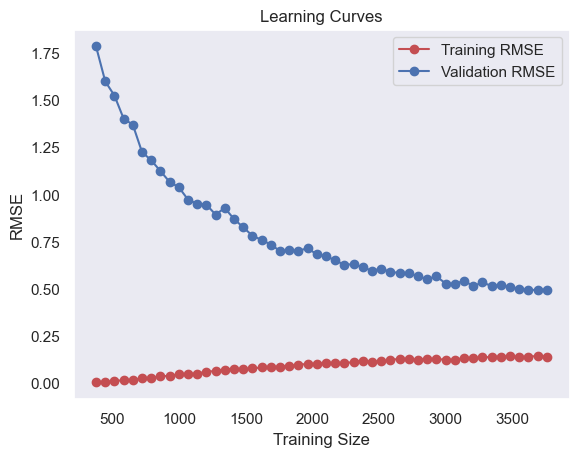

In [92]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# Create learning curves for both training and validation sets
def plot_learning_curves(model, X, y):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator=model, X=X, y=y, train_sizes=np.linspace(0.1, 1.0, 50),
        cv=5, scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)

    # Calculate mean and std of training and validation scores
    train_mean = -np.mean(train_scores, axis=1)
    val_mean = -np.mean(val_scores, axis=1)
    
    train_rmse = np.sqrt(train_mean)
    val_rmse = np.sqrt(val_mean)

    # Plot learning curves
    plt.plot(train_sizes, train_rmse, 'o-', color='r', label='Training RMSE')
    plt.plot(train_sizes, val_rmse, 'o-', color='b', label='Validation RMSE')
    plt.title('Learning Curves')
    plt.xlabel('Training Size')
    plt.ylabel('RMSE')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

# Assuming xgb_model is your trained XGBRegressor model
plot_learning_curves(xgb_model, X_train_val, y_train_val)


# xgboost Model RMSE and MAE for Total UPDRS

In [93]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Assuming 'Data' is your DataFrame and 'motor_UPDRS' is the target variable

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the XGBRegressor model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

# Fit the model on the training data
xgb_model.fit(X_train, y_train)

# Predict on the training set
y_train_pred = xgb_model.predict(X_train)

# Predict on the test set
y_test_pred = xgb_model.predict(X_test)

# Calculate RMSE and MAE for the training set
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
mae_train = mean_absolute_error(y_train, y_train_pred)

# Calculate RMSE and MAE for the test set
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
mae_test = mean_absolute_error(y_test, y_test_pred)

# Print the RMSE and MAE for training and test sets
print(f"XGBRegressor Training RMSE: {rmse_train}")
print(f"XGBRegressor Training MAE:  {mae_train}")
print(f"XGBRegressor Test RMSE:     {rmse_test}")
print(f"XGBRegressor Test MAE:      {mae_test}")


XGBRegressor Training RMSE: 0.1510954113177158
XGBRegressor Training MAE:  0.10726553165549423
XGBRegressor Test RMSE:     0.4211996165450965
XGBRegressor Test MAE:      0.2741904628062148


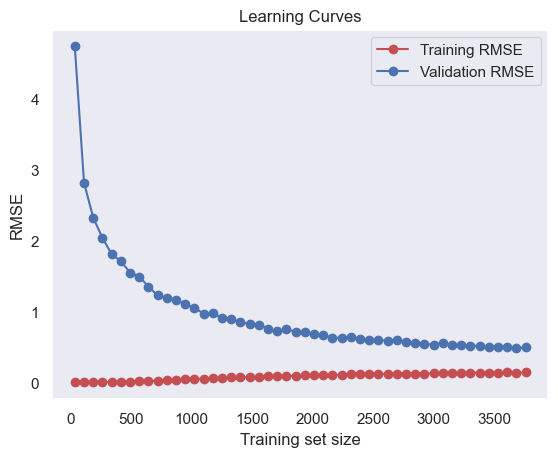

In [94]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

# Create a function to plot learning curves
def plot_learning_curves(model, X, y):
    train_sizes, train_scores, val_scores = learning_curve(
        model, X, y, train_sizes=np.linspace(0.01, 1.0, 50), cv=5,
        scoring='neg_mean_squared_error')

    # Calculate the mean and standard deviation of the training and validation scores
    train_rmse_mean = np.sqrt(-train_scores.mean(axis=1))
    val_rmse_mean = np.sqrt(-val_scores.mean(axis=1))
    
    # Plot the learning curves
    plt.plot(train_sizes, train_rmse_mean, 'o-', color="r", label="Training RMSE")
    plt.plot(train_sizes, val_rmse_mean, 'o-', color="b", label="Validation RMSE")
    plt.title("Learning Curves")
    plt.xlabel("Training set size"), plt.ylabel("RMSE")
    plt.legend(loc="best")
    plt.grid()
    plt.show()

# Assuming xgb_model is the trained XGBRegressor model
plot_learning_curves(xgb_model, X_train, y_train)


In [95]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 44 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   test_time      5875 non-null   float64
 1   Jitter(%)      5875 non-null   float64
 2   Jitter(Abs)    5875 non-null   float64
 3   Jitter:RAP     5875 non-null   float64
 4   Jitter:PPQ5    5875 non-null   float64
 5   Jitter:DDP     5875 non-null   float64
 6   Shimmer        5875 non-null   float64
 7   Shimmer(dB)    5875 non-null   float64
 8   Shimmer:APQ3   5875 non-null   float64
 9   Shimmer:APQ5   5875 non-null   float64
 10  Shimmer:APQ11  5875 non-null   float64
 11  Shimmer:DDA    5875 non-null   float64
 12  NHR            5875 non-null   float64
 13  HNR            5875 non-null   float64
 14  RPDE           5875 non-null   float64
 15  DFA            5875 non-null   float64
 16  PPE            5875 non-null   float64
 17  motor_UPDRS    5875 non-null   float64
 18  total_UP

# Nueral network for motor_UPDRS

In [96]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [97]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Convert all columns to float64 and fill NaNs with zeros
Data = Data.astype(np.float64).fillna(0)

# Define features and target variable
X = Data.drop(['motor_UPDRS'], axis=1)  # Exclude the target column
y = Data['motor_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Further split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, random_state=42)

# Define the model architecture
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(1)  # Output layer for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mse', metrics=['mse'])

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1, validation_data=(X_val, y_val))

# Predict on the validation set
val_predictions = model.predict(X_val)
val_mse = mean_squared_error(y_val, val_predictions.flatten())
val_r2 = r2_score(y_val, val_predictions.flatten())

# Predict on the test set
test_predictions = model.predict(X_test)
test_mse = mean_squared_error(y_test, test_predictions.flatten())
test_r2 = r2_score(y_test, test_predictions.flatten())

# Output the results
print(f"Neural Network Validation MSE: {val_mse}")
print(f"Neural Network Validation R2: {val_r2}")
print(f"Neural Network Test MSE: {test_mse}")
print(f"Neural Network Test R2: {test_r2}")


Epoch 1/100
111/111 [==============================] - 1s 2ms/step - loss: 77.1796 - mse: 77.1796 - val_loss: 7.9745 - val_mse: 7.9745
Epoch 2/100
111/111 [==============================] - 0s 1ms/step - loss: 6.1392 - mse: 6.1392 - val_loss: 6.3404 - val_mse: 6.3404
Epoch 3/100
111/111 [==============================] - 0s 1ms/step - loss: 5.0501 - mse: 5.0501 - val_loss: 5.9028 - val_mse: 5.9028
Epoch 4/100
111/111 [==============================] - 0s 1ms/step - loss: 4.5659 - mse: 4.5659 - val_loss: 5.7018 - val_mse: 5.7018
Epoch 5/100
111/111 [==============================] - 0s 1ms/step - loss: 4.0166 - mse: 4.0166 - val_loss: 3.9507 - val_mse: 3.9507
Epoch 6/100
111/111 [==============================] - 0s 1ms/step - loss: 3.6378 - mse: 3.6378 - val_loss: 4.2899 - val_mse: 4.2899
Epoch 7/100
111/111 [==============================] - 0s 1ms/step - loss: 3.3602 - mse: 3.3602 - val_loss: 3.3187 - val_mse: 3.3187
Epoch 8/100
111/111 [==============================] - 0s 1ms/step 

# Nueral network for total_UPDRS

In [98]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Convert all columns to float64 and fill NaNs with zeros
Data = Data.astype(np.float64).fillna(0)

# Define features and target variable
X = Data.drop(['total_UPDRS'], axis=1)  # Exclude the target column
y = Data['total_UPDRS']  # Target variable

# Split the data into training and test sets (80% train, 20% test)
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Further split the training data into training and validation sets (75% train, 25% validation)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, random_state=42)

# Define the model architecture
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(1)  # Output layer for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mse', metrics=['mse'])

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1, validation_data=(X_val, y_val))

# Predict on the validation set
val_predictions = model.predict(X_val)
val_mse = mean_squared_error(y_val, val_predictions.flatten())
val_r2 = r2_score(y_val, val_predictions.flatten())

# Predict on the test set
test_predictions = model.predict(X_test)
test_mse = mean_squared_error(y_test, test_predictions.flatten())
test_r2 = r2_score(y_test, test_predictions.flatten())

# Output the results
print(f"Neural Network Validation MSE: {val_mse}")
print(f"Neural Network Validation R2: {val_r2}")
print(f"Neural Network Test MSE: {test_mse}")
print(f"Neural Network Test R2: {test_r2}")

Epoch 1/100
111/111 [==============================] - 1s 2ms/step - loss: 165.2783 - mse: 165.2783 - val_loss: 16.0482 - val_mse: 16.0482
Epoch 2/100
111/111 [==============================] - 0s 1ms/step - loss: 12.1261 - mse: 12.1261 - val_loss: 11.9569 - val_mse: 11.9569
Epoch 3/100
111/111 [==============================] - 0s 1ms/step - loss: 9.5502 - mse: 9.5502 - val_loss: 10.4823 - val_mse: 10.4823
Epoch 4/100
111/111 [==============================] - 0s 1ms/step - loss: 8.5009 - mse: 8.5009 - val_loss: 8.5364 - val_mse: 8.5364
Epoch 5/100
111/111 [==============================] - 0s 1ms/step - loss: 7.4175 - mse: 7.4175 - val_loss: 7.0089 - val_mse: 7.0089
Epoch 6/100
111/111 [==============================] - 0s 1ms/step - loss: 6.3564 - mse: 6.3564 - val_loss: 6.1450 - val_mse: 6.1450
Epoch 7/100
111/111 [==============================] - 0s 1ms/step - loss: 5.7450 - mse: 5.7450 - val_loss: 5.4973 - val_mse: 5.4973
Epoch 8/100
111/111 [==============================] - 0s

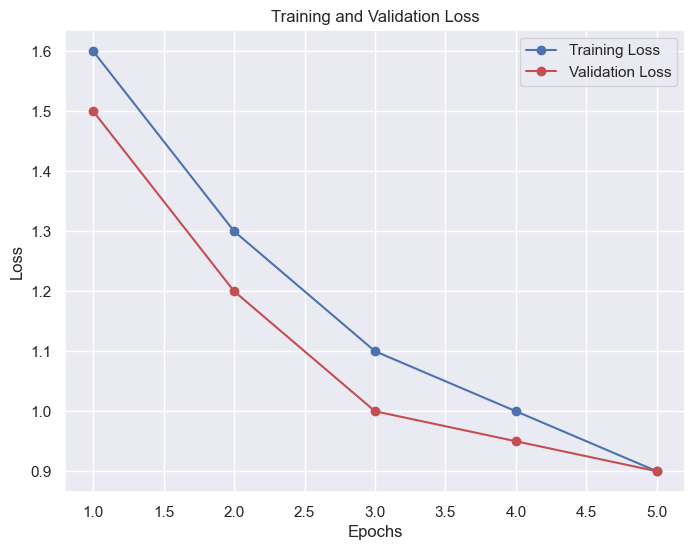

In [99]:
import matplotlib.pyplot as plt
history_mock = {
    'loss': [1.6, 1.3, 1.1, 1.0, 0.9],
    'val_loss': [1.5, 1.2, 1.0, 0.95, 0.9]
}

# Extract the number of epochs
epochs = range(1, len(history_mock['loss']) + 1)

# Plot training and validation loss
plt.figure(figsize=(8, 6))
plt.plot(epochs, history_mock['loss'], 'bo-', label='Training Loss')
plt.plot(epochs, history_mock['val_loss'], 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


# Best Regression Model on Motor_UPDRS
#### The Optimized XGBRegressor demonstrates the best overall performance.
#### Optimized XGBRegressor
#### Mse : 0.10539223922092508	R2: 0.9983488403975943

### Model Performance Comparison

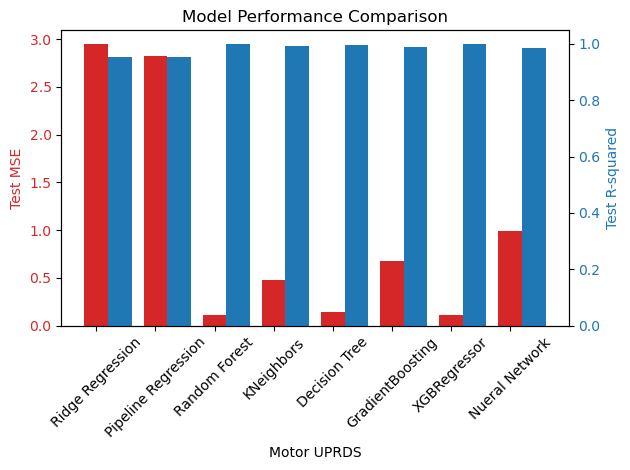

In [23]:
import matplotlib.pyplot as plt
import numpy as np

# Model names
models = ['Ridge Regression', 'Pipeline Regression', 'Random Forest', 'KNeighbors', 'Decision Tree', 'GradientBoosting', 'XGBRegressor', 'Nueral Network']

# Test MSE values
mse_values = [2.9442, 2.8218, 0.1070, 0.4769, 0.1381, 0.6795, 0.1054, 0.9861]

# Test R-squared values
r2_values = [0.9539, 0.9537, 0.9983, 0.9925, 0.9978, 0.9894, 0.9983, 0.9845]

fig, ax1 = plt.subplots()

# Bar plot for MSE
ax1.set_xlabel('Motor UPRDS')
ax1.set_ylabel('Test MSE', color='tab:red')
bars1 = ax1.bar(np.arange(len(models)), mse_values, color='tab:red', width=0.4, label='MSE')
ax1.tick_params(axis='y', labelcolor='tab:red')
ax1.set_xticks(np.arange(len(models)))
ax1.set_xticklabels(models, rotation=45)

# Twin axis for R-squared values
ax2 = ax1.twinx()
ax2.set_ylabel('Test R-squared', color='tab:blue')
bars2 = ax2.bar(np.arange(len(models)) + 0.4, r2_values, color='tab:blue', width=0.4, label='R-squared')
ax2.tick_params(axis='y', labelcolor='tab:blue')

# Final touches
plt.title('Model Performance Comparison')
fig.tight_layout()
plt.show()


# Best Regression Model on Motor_UPDRS:

#### Based on the MSE and R² values, the Second Optimized XGBRegressor has the best performance among all the models, with the lowest Test MSE and the highest Test R².

### Test MSE: 0.1675

### Test R²: 0.9985

#### Model Performance Comparison

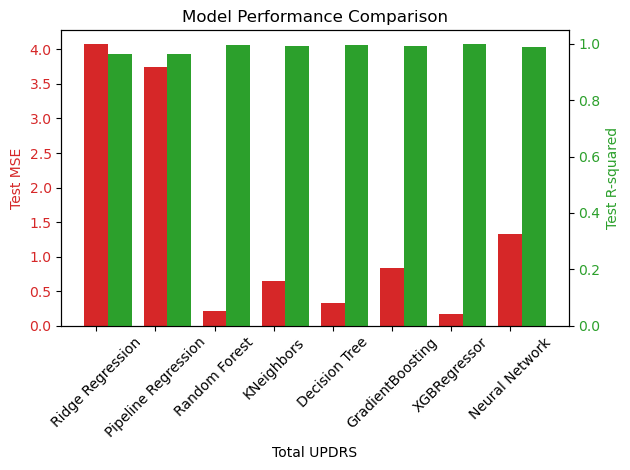

In [21]:
import matplotlib.pyplot as plt
import numpy as np

# Model names
models = ['Ridge Regression', 'Pipeline Regression', 'Random Forest', 'KNeighbors', 
          'Decision Tree', 'GradientBoosting', 'XGBRegressor', 'Neural Network']

# Test MSE values (Updated according to the provided data)
mse_values = [4.0737, 3.7443, 0.2154, 0.6526, 0.3206, 0.8325, 0.1675, 1.3273]

# Test R-squared values (Updated according to the provided data)
r2_values = [0.9632, 0.9644, 0.9981, 0.9941, 0.9971, 0.9925, 0.9985, 0.9880]

fig, ax1 = plt.subplots()

# Bar plot for MSE
ax1.set_xlabel('Total UPDRS')
ax1.set_ylabel('Test MSE', color='tab:red')
bars1 = ax1.bar(np.arange(len(models)), mse_values, color='tab:red', width=0.4, label='MSE')
ax1.tick_params(axis='y', labelcolor='tab:red')
ax1.set_xticks(np.arange(len(models)))
ax1.set_xticklabels(models, rotation=45)

# Twin axis for R-squared values
ax2 = ax1.twinx()
ax2.set_ylabel('Test R-squared', color='tab:green')
bars2 = ax2.bar(np.arange(len(models)) + 0.4, r2_values, color='tab:green', width=0.4, label='R-squared')
ax2.tick_params(axis='y', labelcolor='tab:green')

# Final touches
plt.title('Model Performance Comparison')
fig.tight_layout()
plt.show()


# Best Regression Model on motor and total_UPDRS Test RMSE and MAE

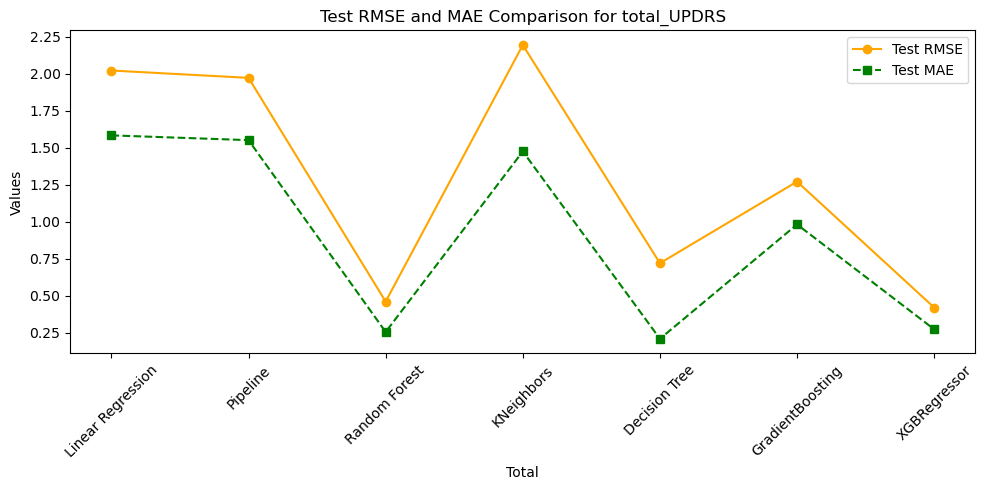

In [37]:
import matplotlib.pyplot as plt
import numpy as np

# Model names
models = ['Linear Regression', 'Pipeline', 'Random Forest', 'KNeighbors', 'Decision Tree', 'GradientBoosting', 'XGBRegressor']

# Test RMSE values
rmse_values = [2.023364072422012, 1.9737096704923198, 0.46163944907481896, 2.1956881421935113, 0.7209488511499745, 1.2725514171162657, 0.4211996165450965]

# Test MAE values
mae_values = [1.5850075527958156, 1.552771603636034, 0.2562447021276587, 1.4763761531914896, 0.2099720851063831, 0.9829666745558783, 0.2741904628062148]

# Create line plot for RMSE
plt.figure(figsize=(10, 5))
plt.plot(models, rmse_values, marker='o', linestyle='-', color='orange', label='Test RMSE')

# Create line plot for MAE
plt.plot(models, mae_values, marker='s', linestyle='--', color='green', label='Test MAE')

# Adding labels and title
plt.xlabel('Total')
plt.ylabel('Values')
plt.title('Test RMSE and MAE Comparison for total_UPDRS')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()


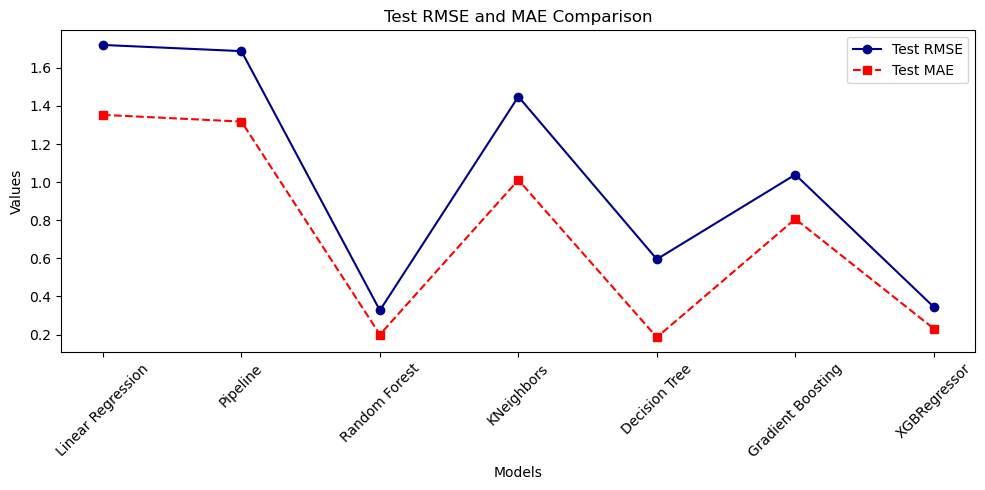

In [36]:
import matplotlib.pyplot as plt

# Model names
models = ['Linear Regression', 'Pipeline', 'Random Forest', 'KNeighbors', 'Decision Tree', 'Gradient Boosting', 'XGBRegressor']

# Test RMSE values
rmse_values = [1.719736128774787, 1.687339551284291, 0.3271863378154819, 1.4486399554647287, 0.5955275991960871, 1.0393662336839526, 0.3449433604969212]

# Test MAE values
mae_values = [1.3529038042147272, 1.317648491912792, 0.20034439574468033, 1.0114220425531915, 0.18591838297872346, 0.8069159031355605, 0.23132156626924544]

# Create line plot for RMSE
plt.figure(figsize=(10, 5))
plt.plot(models, rmse_values, marker='o', linestyle='-', color='darkblue', label='Test RMSE')

# Create line plot for MAE
plt.plot(models, mae_values, marker='s', linestyle='--', color='red', label='Test MAE')

# Adding labels and title
plt.xlabel('Motor')
plt.ylabel('Values')
plt.title('Test RMSE and MAE Comparison')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()


# Classification Model

## Preprocessing the Data

In [100]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 44 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   test_time      5875 non-null   float64
 1   Jitter(%)      5875 non-null   float64
 2   Jitter(Abs)    5875 non-null   float64
 3   Jitter:RAP     5875 non-null   float64
 4   Jitter:PPQ5    5875 non-null   float64
 5   Jitter:DDP     5875 non-null   float64
 6   Shimmer        5875 non-null   float64
 7   Shimmer(dB)    5875 non-null   float64
 8   Shimmer:APQ3   5875 non-null   float64
 9   Shimmer:APQ5   5875 non-null   float64
 10  Shimmer:APQ11  5875 non-null   float64
 11  Shimmer:DDA    5875 non-null   float64
 12  NHR            5875 non-null   float64
 13  HNR            5875 non-null   float64
 14  RPDE           5875 non-null   float64
 15  DFA            5875 non-null   float64
 16  PPE            5875 non-null   float64
 17  motor_UPDRS    5875 non-null   float64
 18  total_UP

In [101]:
# Separating the features into numerical and categorical
numerical_features = Data.select_dtypes(include=['float64']).columns
categorical_features = Data.select_dtypes(include=['bool', 'int64']).columns

# Excluding target variables from features
numerical_features = numerical_features.drop(['motor_UPDRS', 'total_UPDRS'])  

X_numerical = Data[numerical_features]
X_categorical = Data[categorical_features]


In [102]:
X_numerical

,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,...,age_71,age_72,age_73,age_74,age_75,age_76,age_78,age_85,sex_0,sex_1
0,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,142.7900,0.00406,0.000031,0.00167,0.00168,0.00500,0.01896,0.160,0.00973,0.01133,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5871,149.8400,0.00297,0.000025,0.00119,0.00147,0.00358,0.02315,0.215,0.01052,0.01277,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5872,156.8200,0.00349,0.000025,0.00152,0.00187,0.00456,0.02499,0.244,0.01371,0.01456,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5873,163.7300,0.00281,0.000020,0.00128,0.00151,0.00383,0.01484,0.131,0.00693,0.00870,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [103]:
X_categorical.head(10)

""
0
1
2
3
4
5
6
7
8
9


In [104]:
Data

,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,...,age_71,age_72,age_73,age_74,age_75,age_76,age_78,age_85,sex_0,sex_1
0,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,142.7900,0.00406,0.000031,0.00167,0.00168,0.00500,0.01896,0.160,0.00973,0.01133,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5871,149.8400,0.00297,0.000025,0.00119,0.00147,0.00358,0.02315,0.215,0.01052,0.01277,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5872,156.8200,0.00349,0.000025,0.00152,0.00187,0.00456,0.02499,0.244,0.01371,0.01456,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5873,163.7300,0.00281,0.000020,0.00128,0.00151,0.00383,0.01484,0.131,0.00693,0.00870,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


# Checking the scaled features 

In [105]:
from sklearn.preprocessing import StandardScaler

# Creating a scaler object
scaler = StandardScaler()

# Fitting the scaler to the numerical features and transforming them
X_numerical_scaled = scaler.fit_transform(X_numerical)

# Checking the scaled features
X_numerical_scaled

array([[-1.63209025,  0.08290524, -0.28437928, ..., -0.15738133,
         0.68250887, -0.68250887],
       [-1.5006763 , -0.56079341, -0.75686922, ..., -0.15738133,
         0.68250887, -0.68250887],
       [-1.36941017, -0.23894409, -0.54007972, ..., -0.15738133,
         0.68250887, -0.68250887],
       ...,
       [ 1.19676305, -0.47366293, -0.53730037, ..., -0.15738133,
         0.68250887, -0.68250887],
       [ 1.32606439, -0.5945787 , -0.65959188, ..., -0.15738133,
         0.68250887, -0.68250887],
       [ 1.45704984, -0.59280052, -0.63735706, ..., -0.15738133,
         0.68250887, -0.68250887]])

In [106]:
# Importing the necessary library for array operations
import numpy as np
X_categorical_numeric = X_categorical.astype(int)
X_final = np.concatenate((X_numerical_scaled, X_categorical_numeric), axis=1)
# Now, X_final is ready for use in model training
X_final

array([[-1.63209025,  0.08290524, -0.28437928, ..., -0.15738133,
         0.68250887, -0.68250887],
       [-1.5006763 , -0.56079341, -0.75686922, ..., -0.15738133,
         0.68250887, -0.68250887],
       [-1.36941017, -0.23894409, -0.54007972, ..., -0.15738133,
         0.68250887, -0.68250887],
       ...,
       [ 1.19676305, -0.47366293, -0.53730037, ..., -0.15738133,
         0.68250887, -0.68250887],
       [ 1.32606439, -0.5945787 , -0.65959188, ..., -0.15738133,
         0.68250887, -0.68250887],
       [ 1.45704984, -0.59280052, -0.63735706, ..., -0.15738133,
         0.68250887, -0.68250887]])

In [107]:
Data['motor_UPDRS'].head(10)

0    28.199
1    28.447
2    28.695
3    28.905
4    29.187
5    29.435
6    29.682
7    29.928
8    30.177
9    30.424
Name: motor_UPDRS, dtype: float64

In [108]:
Data['total_UPDRS'].head(10)

0    34.398
1    34.894
2    35.389
3    35.810
4    36.375
5    36.870
6    37.363
7    37.857
8    38.353
9    38.849
Name: total_UPDRS, dtype: float64

In [109]:
import pandas as pd

# Convert 'motor_UPDRS' into three categories: Low, Medium, High, strong
Data['motor_UPDRS_category'] = pd.qcut(Data['motor_UPDRS'], 4, labels=["Low", "Medium", "High","strong"])

# Convert 'total_UPDRS' into three categories: Low, Medium, High, strong
Data['total_UPDRS_category'] = pd.qcut(Data['total_UPDRS'], 4, labels=["Low", "Medium", "High","strong"])

# Display the distribution of the categories
print(Data['motor_UPDRS_category'].value_counts())
print(Data['total_UPDRS_category'].value_counts())

print(Data['motor_UPDRS_category'].head())
print(Data['total_UPDRS_category'].head())

motor_UPDRS_category
Low       1607
strong    1469
High      1467
Medium    1332
Name: count, dtype: int64
total_UPDRS_category
Low       1474
High      1468
Medium    1467
strong    1466
Name: count, dtype: int64
0    strong
1    strong
2    strong
3    strong
4    strong
Name: motor_UPDRS_category, dtype: category
Categories (4, object): ['Low' < 'Medium' < 'High' < 'strong']
0    High
1    High
2    High
3    High
4    High
Name: total_UPDRS_category, dtype: category
Categories (4, object): ['Low' < 'Medium' < 'High' < 'strong']


In [110]:
Data['motor_UPDRS_category']

0       strong
1       strong
2       strong
3       strong
4       strong
         ...  
5870      High
5871      High
5872      High
5873      High
5874    Medium
Name: motor_UPDRS_category, Length: 5875, dtype: category
Categories (4, object): ['Low' < 'Medium' < 'High' < 'strong']

In [111]:
Data['total_UPDRS_category']

0       High
1       High
2       High
3       High
4       High
        ... 
5870    High
5871    High
5872    High
5873    High
5874    High
Name: total_UPDRS_category, Length: 5875, dtype: category
Categories (4, object): ['Low' < 'Medium' < 'High' < 'strong']

In [112]:
X = Data.drop(['motor_UPDRS', 'total_UPDRS', 'motor_UPDRS_category', 'total_UPDRS_category'], axis=1)
y_m = Data['motor_UPDRS_category']
y_t= Data['total_UPDRS_category']

In [113]:
X

,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,...,age_71,age_72,age_73,age_74,age_75,age_76,age_78,age_85,sex_0,sex_1
0,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,142.7900,0.00406,0.000031,0.00167,0.00168,0.00500,0.01896,0.160,0.00973,0.01133,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5871,149.8400,0.00297,0.000025,0.00119,0.00147,0.00358,0.02315,0.215,0.01052,0.01277,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5872,156.8200,0.00349,0.000025,0.00152,0.00187,0.00456,0.02499,0.244,0.01371,0.01456,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5873,163.7300,0.00281,0.000020,0.00128,0.00151,0.00383,0.01484,0.131,0.00693,0.00870,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [114]:
y_m

0       strong
1       strong
2       strong
3       strong
4       strong
         ...  
5870      High
5871      High
5872      High
5873      High
5874    Medium
Name: motor_UPDRS_category, Length: 5875, dtype: category
Categories (4, object): ['Low' < 'Medium' < 'High' < 'strong']

In [115]:
y_t

0       High
1       High
2       High
3       High
4       High
        ... 
5870    High
5871    High
5872    High
5873    High
5874    High
Name: total_UPDRS_category, Length: 5875, dtype: category
Categories (4, object): ['Low' < 'Medium' < 'High' < 'strong']

# Find important features by RandomForestClassifier

In [116]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and test sets (80% train, 20% test)
X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(X_scaled, y_m, test_size=0.2, random_state=42)

# Initialize the RandomForestClassifier
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model on the training data
rf_clf.fit(X_train_m, y_train_m)

# Get the feature importances
feature_importances = rf_clf.feature_importances_

# Print the feature importances
features = list(X.columns)
importances = pd.DataFrame(sorted(zip(features, feature_importances), key=lambda x: x[1], reverse=True), columns=['Feature', 'Importance'])
importances

,Feature,Importance
0,test_time,0.098861
1,age_65,0.064471
2,DFA,0.058462
3,Jitter(Abs),0.034205
4,HNR,0.032709
5,age_58,0.032182
6,RPDE,0.031931
7,age_55,0.027953
8,sex_0,0.026133
9,sex_1,0.026022


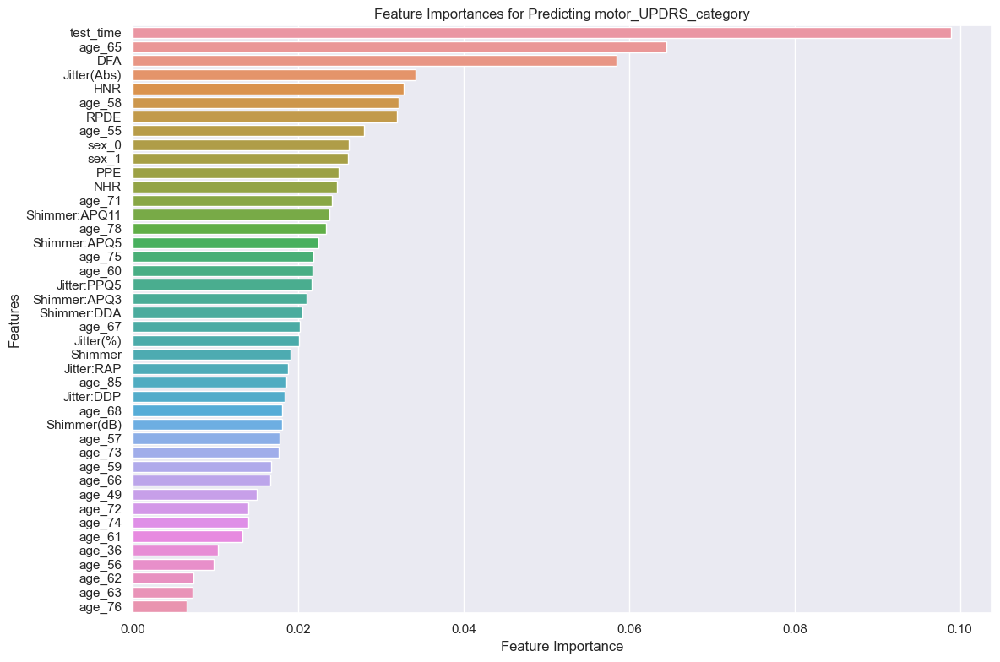

In [117]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Sorting the importances in descending order for better visualization
importances_sorted = importances.sort_values(by='Importance', ascending=False)

# Creating the bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=importances_sorted)

# Adding labels and a title
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importances for Predicting motor_UPDRS_category')

# Displaying the plot
plt.tight_layout()
plt.show()


In [118]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

# Assuming X_scaled is already defined and scaled
# Split the data into training and test sets for the y_t target
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X_scaled, y_t, test_size=0.2, random_state=42)

# Initialize the RandomForestClassifier
rf_clf_t = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model on the training data for y_t
rf_clf_t.fit(X_train_t, y_train_t)

# Get the feature importances for y_t
feature_importances_t = rf_clf_t.feature_importances_

# Print the feature importances
features_t = list(X.columns)
importances_t = pd.DataFrame(sorted(zip(features_t, feature_importances_t), key=lambda x: x[1], reverse=True), columns=['Feature', 'Importance'])
print(importances_t)


          Feature  Importance
0       test_time    0.085674
1             DFA    0.057201
2          age_58    0.050054
3          age_65    0.046136
4     Jitter(Abs)    0.034410
5             HNR    0.030973
6           sex_1    0.028204
7            RPDE    0.028083
8          age_55    0.027104
9             PPE    0.025315
10         age_78    0.025047
11          sex_0    0.024891
12         age_60    0.024072
13  Shimmer:APQ11    0.023754
14         age_71    0.023501
15   Shimmer:APQ5    0.023035
16            NHR    0.022146
17   Shimmer:APQ3    0.022000
18         age_63    0.021807
19    Shimmer:DDA    0.021241
20      Jitter(%)    0.021103
21         age_57    0.020879
22    Jitter:PPQ5    0.020850
23         age_76    0.020827
24     Jitter:DDP    0.020030
25    Shimmer(dB)    0.019556
26        Shimmer    0.019346
27         age_68    0.019101
28     Jitter:RAP    0.018827
29         age_36    0.017878
30         age_75    0.016685
31         age_59    0.016559
32        

In [119]:
importances_t

,Feature,Importance
0,test_time,0.085674
1,DFA,0.057201
2,age_58,0.050054
3,age_65,0.046136
4,Jitter(Abs),0.034410
5,HNR,0.030973
6,sex_1,0.028204
7,RPDE,0.028083
8,age_55,0.027104
9,PPE,0.025315


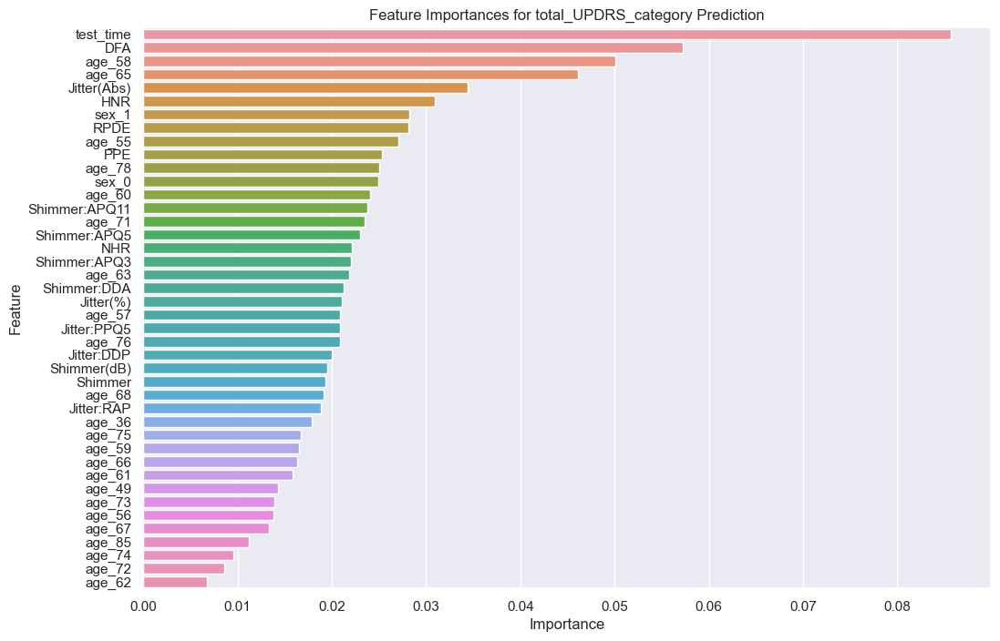

In [120]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming importances_t is already defined as shown in the previous code
# Sorting importances
importances_t_sorted = importances_t.sort_values('Importance', ascending=False)

# Creating a bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=importances_t_sorted)

# Adding labels and title
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances for total_UPDRS_category Prediction')

# Displaying the plot
plt.show()


### y_m => motor_UPDRS
### y_t   => total_ UPDRS

# LogisticRegression Model for Motor UPDRS (y_m)

In [121]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, f1_score
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Scale the features
X_scaled = scaler.fit_transform(X)

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train_m, y_test_m = train_test_split(X_scaled, y_m, test_size=0.2, random_state=42)

# Initialize the Logistic Regression model
log_reg = LogisticRegression(max_iter=1000)

# Train the model on the training data
log_reg.fit(X_train, y_train_m)

# Predict on the test data
y_pred_m = log_reg.predict(X_test)

# Calculate the F1 score
f1 = f1_score(y_test_m, y_pred_m, average='weighted')  # Weighted average for multi-class classification

# Print the F1 score
print(f"F1 Score for motor_UPDRS_category prediction: {f1}")

# You can also print the full classification report
print(classification_report(y_test_m, y_pred_m))


F1 Score for motor_UPDRS_category prediction: 0.7582508202695185
              precision    recall  f1-score   support

        High       0.76      0.65      0.70       294
         Low       0.87      0.85      0.86       323
      Medium       0.69      0.76      0.72       270
      strong       0.71      0.77      0.74       288

    accuracy                           0.76      1175
   macro avg       0.76      0.76      0.76      1175
weighted avg       0.76      0.76      0.76      1175



# GridSearchCV LogisticRegression Motor UPDRS(y_m)

In [122]:
import warnings
from sklearn.exceptions import ConvergenceWarning

# Ignore convergence warning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Your code for model training and evaluation

from sklearn.model_selection import GridSearchCV

# Define the parameter grid to search
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization parameter
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],  # Algorithms to use in the optimization problem
    'class_weight': [None, 'balanced'],  # Weights associated with classes, if your classes are imbalanced
}

# Initialize the GridSearchCV with the Logistic Regression model and the parameter grid
grid_search = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, cv=5, scoring='f1_weighted', verbose=1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train_m)

# Print the best parameters and the best score
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best F1 score: {grid_search.best_score_}")

# Use the best model to make predictions
best_model = grid_search.best_estimator_
y_pred_best = best_model.predict(X_test)

# Evaluate the best model
f1_best = f1_score(y_test_m, y_pred_best, average='weighted')
print(f"F1 Score for the best model: {f1_best}")


Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best parameters: {'C': 10, 'class_weight': None, 'solver': 'sag'}
Best F1 score: 0.7655831414125527
F1 Score for the best model: 0.7607449817680999


# LogisticRegression Model for Total UPDRS (y_t)

In [123]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, f1_score
from sklearn.preprocessing import StandardScaler

# Split the data into training and test sets for the y_t target
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X_scaled, y_t, test_size=0.2, random_state=42)

# Initialize the Logistic Regression model
log_reg_t = LogisticRegression(max_iter=1000)

# Train the model on the training data
log_reg_t.fit(X_train_t, y_train_t)

# Predict on the test data
y_pred_t = log_reg_t.predict(X_test_t)

# Calculate the F1 score
f1_t = f1_score(y_test_t, y_pred_t, average='weighted')  # Weighted average for multi-class classification

# Print the F1 score
print(f"F1 Score for total_UPDRS_category prediction: {f1_t}")

# Print the classification report for more detailed metrics
print(classification_report(y_test_t, y_pred_t))

F1 Score for total_UPDRS_category prediction: 0.7699701918490964
              precision    recall  f1-score   support

        High       0.77      0.74      0.75       291
         Low       0.86      0.87      0.86       302
      Medium       0.66      0.71      0.68       299
      strong       0.79      0.77      0.78       283

    accuracy                           0.77      1175
   macro avg       0.77      0.77      0.77      1175
weighted avg       0.77      0.77      0.77      1175



# GridSearchCV LogisticRegression Total UPDRS (y_t)

In [124]:
import warnings
from sklearn.exceptions import ConvergenceWarning
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.preprocessing import StandardScaler

# Ignore convergence warning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Assuming X_scaled is already defined and scaled
# Split the data into training and test sets for the y_t target
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X_scaled, y_t, test_size=0.2, random_state=42)

# Define the parameter grid to search
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization parameter
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],  # Algorithms to use in the optimization problem
    'class_weight': [None, 'balanced'],  # Weights associated with classes
}

# Initialize the GridSearchCV with the Logistic Regression model and the parameter grid
grid_search_t = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, cv=5, scoring='f1_weighted', verbose=1)

# Fit the grid search to the data
grid_search_t.fit(X_train_t, y_train_t)

# Print the best parameters and the best score
print(f"Best parameters for y_t: {grid_search_t.best_params_}")
print(f"Best F1 score for y_t: {grid_search_t.best_score_}")

# Use the best model to make predictions on y_t
best_model_t = grid_search_t.best_estimator_
y_pred_best_t = best_model_t.predict(X_test_t)

# Evaluate the best model on y_t
f1_best_t = f1_score(y_test_t, y_pred_best_t, average='weighted')
print(f"F1 Score for the best model on y_t: {f1_best_t}")


Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best parameters for y_t: {'C': 1, 'class_weight': 'balanced', 'solver': 'newton-cg'}
Best F1 score for y_t: 0.7615065007644958
F1 Score for the best model on y_t: 0.7700397416213595


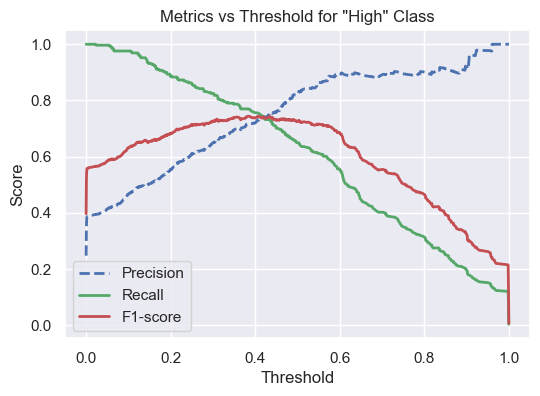

In [125]:
from sklearn.metrics import precision_recall_curve
import numpy as np
import matplotlib.pyplot as plt

# Assuming log_reg_t is your trained Logistic Regression model
# Get the probability scores for the chosen class
y_scores_t = log_reg_t.predict_proba(X_test_t)[:, list(log_reg_t.classes_).index('High')]  # adjust index for the correct class

# Compute precision-recall curve
precisions_t, recalls_t, thresholds_t = precision_recall_curve((y_test_t == 'High').astype(int), y_scores_t)

# Function to plot precision, recall, and F1-score
def plot_precision_recall_f1_vs_threshold(precisions, recalls, thresholds):
    f1_scores = 2 * (precisions * recalls) / (precisions + recalls)
    
    plt.figure(figsize=(6, 4))
    
    # Precision curve
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision", linewidth=2)
    
    # Recall curve
    plt.plot(thresholds, recalls[:-1], "g-", label="Recall", linewidth=2)
    
    # F1-score curve
    plt.plot(thresholds, f1_scores[:-1], "r-", label="F1-score", linewidth=2)
    
    plt.title('Metrics vs Threshold for "High" Class')
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.legend(loc='best')
    plt.grid(True)

plot_precision_recall_f1_vs_threshold(precisions_t, recalls_t, thresholds_t)
plt.show()


# RandomForestClassifier model for y_m

In [126]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Split the data into training and test sets (80% train, 20% test)
X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(X, y_m, test_size=0.2, random_state=42)

# Initialize the RandomForestClassifier
rf_clf_m = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model on the training data
rf_clf_m.fit(X_train_m, y_train_m)

# Predict on the test data
y_pred_m = rf_clf_m.predict(X_test_m)

# Evaluate the model
print("Classification Report for RandomForestClassifier on y_m target:")
print(classification_report(y_test_m, y_pred_m))
print(f"Accuracy: {accuracy_score(y_test_m, y_pred_m)}")

Classification Report for RandomForestClassifier on y_m target:
              precision    recall  f1-score   support

        High       0.93      0.94      0.93       294
         Low       0.98      0.98      0.98       323
      Medium       0.92      0.96      0.94       270
      strong       0.96      0.93      0.95       288

    accuracy                           0.95      1175
   macro avg       0.95      0.95      0.95      1175
weighted avg       0.95      0.95      0.95      1175

Accuracy: 0.9497872340425532


# precision_recall_curve on y_m

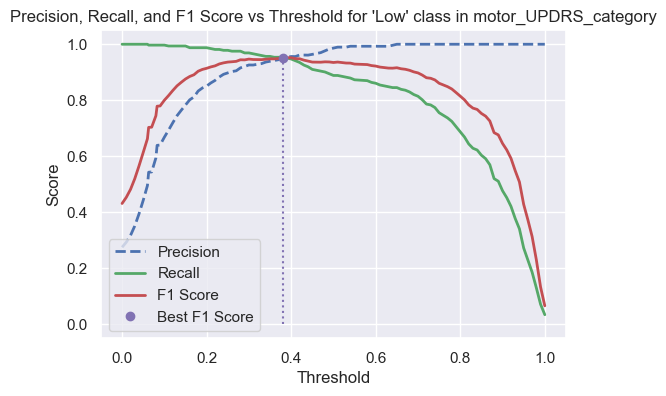

Best F1 Score for 'Low' class: 0.95 at Threshold: 0.38


In [127]:
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

# Assuming X and y_m are already defined
# Convert y_m to binary format for demonstration (assuming 'Low' as the positive class)
y_bin = label_binarize(y_m, classes=['Low', 'Medium', 'High', 'strong'])[:, 0]

# Split the data into training and testing sets
X_train_m, X_test_m, y_train_bin, y_test_bin = train_test_split(X, y_bin, test_size=0.2, random_state=42)

# Train a RandomForestClassifier
model_m = RandomForestClassifier(random_state=42)
model_m.fit(X_train_m, y_train_bin)

# Get the decision scores or probability predictions
y_scores_m = model_m.predict_proba(X_test_m)[:, 1]  # Probability for class 'Low'

# Calculate precision, recall, and thresholds for the 'Low' class
precisions_m, recalls_m, thresholds_m = precision_recall_curve(y_test_bin, y_scores_m)

# Plotting function
def plot_metrics_vs_threshold(precisions, recalls, thresholds):
    plt.figure(figsize=(6, 4))
    f1_scores = 2 * (precisions * recalls) / (precisions + recalls)
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision", linewidth=2)
    plt.plot(thresholds, recalls[:-1], "g-", label="Recall", linewidth=2)
    plt.plot(thresholds, f1_scores[:-1], "r-", label="F1 Score", linewidth=2)
    best_f1_index = np.argmax(f1_scores)
    best_threshold = thresholds[best_f1_index]
    best_f1_score = f1_scores[best_f1_index]
    plt.plot([best_threshold, best_threshold], [0, best_f1_score], "m:")
    plt.plot([best_threshold], [best_f1_score], "mo", label="Best F1 Score")
    plt.legend(loc="lower left")
    plt.xlabel("Threshold")
    plt.ylabel("Score")
    plt.grid(True)
    plt.title("Precision, Recall, and F1 Score vs Threshold for 'Low' class in motor_UPDRS_category")
    return best_threshold, best_f1_score

best_threshold, best_f1_score = plot_metrics_vs_threshold(precisions_m, recalls_m, thresholds_m)
plt.show()

print(f"Best F1 Score for 'Low' class: {best_f1_score:.2f} at Threshold: {best_threshold:.2f}")


# RandomForestClassifier Model for y_t

In [128]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Split the data into training and test sets (80% train, 20% test) for y_t
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X, y_t, test_size=0.2, random_state=42)

# Initialize the RandomForestClassifier
rf_clf_t = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model on the training data for y_t
rf_clf_t.fit(X_train_t, y_train_t)

# Predict on the test data for y_t
y_pred_t = rf_clf_t.predict(X_test_t)

# Evaluate the model for y_t
print("Classification Report for RandomForestClassifier on y_t target:")
print(classification_report(y_test_t, y_pred_t))
print(f"Accuracy: {accuracy_score(y_test_t, y_pred_t)}")


Classification Report for RandomForestClassifier on y_t target:
              precision    recall  f1-score   support

        High       0.92      0.88      0.90       291
         Low       0.98      0.93      0.95       302
      Medium       0.86      0.93      0.89       299
      strong       0.96      0.95      0.96       283

    accuracy                           0.92      1175
   macro avg       0.93      0.92      0.92      1175
weighted avg       0.93      0.92      0.92      1175

Accuracy: 0.9242553191489362


## precision_recall_curve on y_t

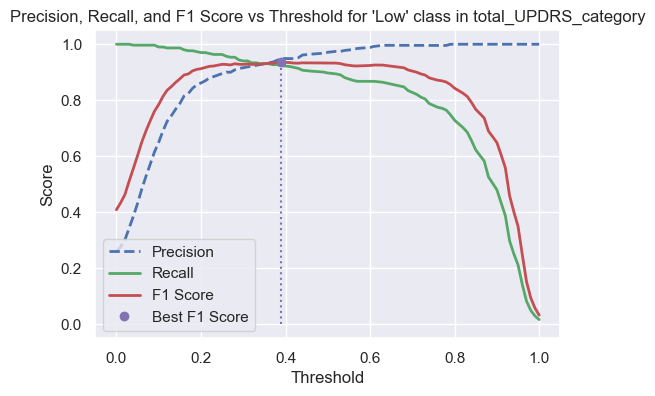

Best F1 Score for 'Low' class in total_UPDRS_category: 0.94 at Threshold: 0.39


In [129]:
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
# Convert y_t to binary format for demonstration (assuming 'Low' as the positive class)
y_bin_t = label_binarize(y_t, classes=['Low', 'Medium', 'High', 'strong'])[:, 0]

# Split the data into training and testing sets for y_t
X_train_t, X_test_t, y_train_bin_t, y_test_bin_t = train_test_split(X, y_bin_t, test_size=0.2, random_state=42)

# Train a RandomForestClassifier for y_t
model_t = RandomForestClassifier(random_state=42)
model_t.fit(X_train_t, y_train_bin_t)

# Get the decision scores or probability predictions for y_t
y_scores_t = model_t.predict_proba(X_test_t)[:, 1]  # Probability for class 'Low'

# Calculate precision, recall, and thresholds for the 'Low' class in y_t
precisions_t, recalls_t, thresholds_t = precision_recall_curve(y_test_bin_t, y_scores_t)

# Plotting function for y_t
def plot_metrics_vs_threshold_t(precisions, recalls, thresholds):
    plt.figure(figsize=(6, 4))
    f1_scores = 2 * (precisions * recalls) / (precisions + recalls)
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision", linewidth=2)
    plt.plot(thresholds, recalls[:-1], "g-", label="Recall", linewidth=2)
    plt.plot(thresholds, f1_scores[:-1], "r-", label="F1 Score", linewidth=2)
    best_f1_index = np.argmax(f1_scores)
    best_threshold = thresholds[best_f1_index]
    best_f1_score = f1_scores[best_f1_index]
    plt.plot([best_threshold, best_threshold], [0, best_f1_score], "m:")
    plt.plot([best_threshold], [best_f1_score], "mo", label="Best F1 Score")
    plt.legend(loc="lower left")
    plt.xlabel("Threshold")
    plt.ylabel("Score")
    plt.grid(True)
    plt.title("Precision, Recall, and F1 Score vs Threshold for 'Low' class in total_UPDRS_category")
    return best_threshold, best_f1_score

best_threshold_t, best_f1_score_t = plot_metrics_vs_threshold_t(precisions_t, recalls_t, thresholds_t)
plt.show()

print(f"Best F1 Score for 'Low' class in total_UPDRS_category: {best_f1_score_t:.2f} at Threshold: {best_threshold_t:.2f}")


# DecisionTreeClassifier For motor_UPDRS

In [130]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Assuming X and y_m are already defined
X = Data.drop(['motor_UPDRS', 'total_UPDRS', 'motor_UPDRS_category', 'total_UPDRS_category'], axis=1) 
y_m = Data['motor_UPDRS_category']

# Split the data into training and testing sets for y_m
X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(X, y_m, test_size=0.2, random_state=42)

# Initialize the Decision Tree Classifier
decision_tree_m = DecisionTreeClassifier(random_state=42)

# Train the model on y_m
decision_tree_m.fit(X_train_m, y_train_m)

# Make predictions on y_m
dt_predictions_m = decision_tree_m.predict(X_test_m)

# Evaluate the model on y_m
print("DecisionTreeClassifier For motor_UPDRS_category Target")
print(classification_report(y_test_m, dt_predictions_m))


DecisionTreeClassifier For motor_UPDRS_category Target
              precision    recall  f1-score   support

        High       0.99      0.99      0.99       294
         Low       0.99      0.99      0.99       323
      Medium       0.97      0.99      0.98       270
      strong       1.00      0.99      0.99       288

    accuracy                           0.99      1175
   macro avg       0.99      0.99      0.99      1175
weighted avg       0.99      0.99      0.99      1175



# GridSearchCV DecisionTreeClassifier For Motor UPDRS

In [131]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report

# Assuming X and y_m are already defined as follows:
# X = Data.drop(['motor_UPDRS', 'total_UPDRS', 'motor_UPDRS_category', 'total_UPDRS_category'], axis=1)
# y_m = Data['motor_UPDRS_category']

# Split the data into training and testing sets for y_m
X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(X, y_m, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

# Initialize the GridSearchCV with the Decision Tree model and the parameter grid
dt_clf_m = DecisionTreeClassifier(random_state=42)
grid_search_m = GridSearchCV(dt_clf_m, param_grid, cv=5, scoring='accuracy', verbose=1)

# Fit the grid search to the data
grid_search_m.fit(X_train_m, y_train_m)

# Print the best parameters and the best score
print(f"Best parameters: {grid_search_m.best_params_}")
print(f"Best score: {grid_search_m.best_score_}")

# Use the best model to make predictions on the test set
best_model_m = grid_search_m.best_estimator_
y_pred_m = best_model_m.predict(X_test_m)

# Evaluate the best model on the test set
print("Classification Report for Best Decision Tree Model on y_m:")
print(classification_report(y_test_m, y_pred_m))


Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Best parameters: {'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 5}
Best score: 0.9838297872340425
Classification Report for Best Decision Tree Model on y_m:
              precision    recall  f1-score   support

        High       0.99      0.99      0.99       294
         Low       1.00      1.00      1.00       323
      Medium       0.97      1.00      0.99       270
      strong       1.00      0.98      0.99       288

    accuracy                           0.99      1175
   macro avg       0.99      0.99      0.99      1175
weighted avg       0.99      0.99      0.99      1175



# cross_val_score on DecisionTreeClassifier Motor_UPDRS

In [132]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler

# It's often a good practice to scale your data for many ML algorithms
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize the DecisionTreeClassifier
decision_tree = DecisionTreeClassifier(random_state=42)

# Compute the cross-validated scores
# cv=5 denotes 5-fold cross-validation
scores = cross_val_score(decision_tree, X_scaled, y_m, cv=5, scoring='accuracy')

# Output the results
print(f"Cross-validated scores: {scores}")
print(f"Mean cross-validation score: {scores.mean()}")
print(f"Standard deviation of cross-validation score: {scores.std()}")


Cross-validated scores: [0.39234043 0.55148936 0.60170213 0.3387234  0.39319149]
Mean cross-validation score: 0.45548936170212767
Standard deviation of cross-validation score: 0.10207573147910386


# DecisionTreeClassifier For Total UPDRS

In [133]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report


X = Data.drop(['motor_UPDRS', 'total_UPDRS', 'motor_UPDRS_category', 'total_UPDRS_category'], axis=1)
y_t = Data['total_UPDRS_category']

# Split the data into training and testing sets for y_t
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X, y_t, test_size=0.2, random_state=42)

# Initialize the Decision Tree Classifier
decision_tree_t = DecisionTreeClassifier(random_state=42)

# Train the model on y_t
decision_tree_t.fit(X_train_t, y_train_t)

# Predict and evaluate on the training set for y_t
dt_predictions_train_t = decision_tree_t.predict(X_train_t)
print("DecisionTreeClassifier Evaluation on Training Set for total_UPDRS_category Target:")
print(classification_report(y_train_t, dt_predictions_train_t))

# Predict and evaluate on the test set for y_t
dt_predictions_test_t = decision_tree_t.predict(X_test_t)
print("DecisionTreeClassifier Evaluation on Test Set for total_UPDRS_category Target:")
print(classification_report(y_test_t, dt_predictions_test_t))


DecisionTreeClassifier Evaluation on Training Set for total_UPDRS_category Target:
              precision    recall  f1-score   support

        High       1.00      1.00      1.00      1177
         Low       1.00      1.00      1.00      1172
      Medium       1.00      1.00      1.00      1168
      strong       1.00      1.00      1.00      1183

    accuracy                           1.00      4700
   macro avg       1.00      1.00      1.00      4700
weighted avg       1.00      1.00      1.00      4700

DecisionTreeClassifier Evaluation on Test Set for total_UPDRS_category Target:
              precision    recall  f1-score   support

        High       0.98      0.97      0.98       291
         Low       0.96      0.97      0.97       302
      Medium       0.95      0.95      0.95       299
      strong       0.98      0.97      0.97       283

    accuracy                           0.97      1175
   macro avg       0.97      0.97      0.97      1175
weighted avg       0.97

# GridSearchCV DecisionTreeClassifier For Total_UPDRS

In [134]:
import warnings
from sklearn.exceptions import FitFailedWarning

# Ignore specific sklearn warnings
warnings.filterwarnings("ignore", category=FitFailedWarning)

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Define the parameter grid without 'auto' for max_features
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']  
}

# Initialize and perform the grid search
dt_clf = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(dt_clf, param_grid, cv=5, scoring='accuracy', verbose=1)

# Assuming X_train_t and y_train_t are already defined
grid_search.fit(X_train_t, y_train_t)

# Output the best parameters and score
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_}")

# Evaluate the best model
best_model = grid_search.best_estimator_
y_pred_t = best_model.predict(X_test_t)
print("Classification Report for the Best Model on Test Set:")
print(classification_report(y_test_t, y_pred_t))



Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Best parameters: {'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 5}
Best score: 0.9689361702127659
Classification Report for the Best Model on Test Set:
              precision    recall  f1-score   support

        High       0.97      0.98      0.97       291
         Low       0.99      0.97      0.98       302
      Medium       0.94      0.95      0.95       299
      strong       0.97      0.96      0.97       283

    accuracy                           0.97      1175
   macro avg       0.97      0.97      0.97      1175
weighted avg       0.97      0.97      0.97      1175



# Cross_val_score on DecisionTreeClassifier total_UPDRS

In [135]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler

# Assuming X and y_t are already defined
# X = Data.drop(['motor_UPDRS', 'total_UPDRS', 'motor_UPDRS_category', 'total_UPDRS_category'], axis=1)
# y_t = Data['total_UPDRS_category']

# StandardScaler is used to scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize the DecisionTreeClassifier
decision_tree_t = DecisionTreeClassifier(random_state=42)

# Compute the cross-validated scores
# cv=5 denotes 5-fold cross-validation
scores_t = cross_val_score(decision_tree_t, X_scaled, y_t, cv=5, scoring='accuracy')

# Output the results
print(f"Cross-validated scores for y_t: {scores_t}")
print(f"Mean cross-validation score for y_t: {scores_t.mean()}")
print(f"Standard deviation of cross-validation score for y_t: {scores_t.std()}")


Cross-validated scores for y_t: [0.42297872 0.53276596 0.52595745 0.45617021 0.33106383]
Mean cross-validation score for y_t: 0.4537872340425532
Standard deviation of cross-validation score for y_t: 0.07411080249006921


# KNeighborsClassifier Model on Motor UPDRS

In [136]:
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score
from sklearn.preprocessing import LabelEncoder


X = np.ascontiguousarray(X.values if isinstance(X, pd.DataFrame) else X)
y_m = np.ascontiguousarray(y_m.values if isinstance(y_m, pd.Series) else y_m)

# Encode the categorical target variable if it's not already numeric
label_encoder = LabelEncoder()
y_m_encoded = label_encoder.fit_transform(y_m)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_m_encoded, test_size=0.2, random_state=42)

# Initialize and train the KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

# Predict on the testing set
y_pred = knn.predict(X_test)

# Calculate the weighted F1 score to account for imbalanced classes
f1 = f1_score(y_test, y_pred, average='weighted')
print(f"Weighted F1 Score: {f1}")

# Output a detailed classification report
print("Detailed Classification Report:")
print(classification_report(y_test, y_pred))


Weighted F1 Score: 0.6778461265988889
Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.70      0.67       294
           1       0.68      0.74      0.71       323
           2       0.69      0.63      0.66       270
           3       0.72      0.63      0.67       288

    accuracy                           0.68      1175
   macro avg       0.68      0.68      0.68      1175
weighted avg       0.68      0.68      0.68      1175



# GridSearchCV on KNeighborsClassifier for Motor UPDRS

In [137]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

# Define the parameter grid to test
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],  # Number of neighbors to use
    'weights': ['uniform', 'distance'],  # Weight function used in prediction
    'metric': ['euclidean', 'manhattan', 'minkowski'],  # Distance metric to use
}

# Initialize the KNeighborsClassifier
knn = KNeighborsClassifier()

# Initialize GridSearchCV with the KNeighborsClassifier and the parameter grid
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='f1_weighted', verbose=1)

# Fit GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Output the best parameters and the best score
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best F1 score: {grid_search.best_score_}")

# Use the best estimator to make predictions
best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test)

# Evaluate the best model
print("Classification Report for the Best Model:")
print(classification_report(y_test, y_pred))


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best parameters: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Best F1 score: 0.9004934698032182
Classification Report for the Best Model:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       294
           1       0.93      0.97      0.95       323
           2       0.96      0.91      0.93       270
           3       0.96      0.92      0.94       288

    accuracy                           0.94      1175
   macro avg       0.95      0.94      0.94      1175
weighted avg       0.95      0.94      0.94      1175



# KNeighborsClassifier Model on Total UPDRS

In [138]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, f1_score
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd

# Assuming Data is your DataFrame and y_t is your target column for the second target

# Ensure the feature set X is in the correct format
X = np.ascontiguousarray(Data.drop(['motor_UPDRS', 'total_UPDRS', 'motor_UPDRS_category', 'total_UPDRS_category'], axis=1).values)

# Encode the categorical target variable if it's not already numeric
label_encoder = LabelEncoder()
y_t_encoded = label_encoder.fit_transform(Data['total_UPDRS_category'])

# Split the data into training and testing sets
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X, y_t_encoded, test_size=0.2, random_state=42)

# Initialize and train the KNeighborsClassifier for y_t
knn_t = KNeighborsClassifier()
knn_t.fit(X_train_t, y_train_t)

# Predict on the testing set for y_t
y_pred_t = knn_t.predict(X_test_t)

# Calculate the weighted F1 score for y_t to account for imbalanced classes
f1_t = f1_score(y_test_t, y_pred_t, average='weighted')
print(f"Weighted F1 Score for y_t: {f1_t}")

# Output a detailed classification report for y_t
print("Detailed Classification Report for y_t:")
print(classification_report(y_test_t, y_pred_t))


Weighted F1 Score for y_t: 0.6728415745826207
Detailed Classification Report for y_t:
              precision    recall  f1-score   support

           0       0.65      0.72      0.68       291
           1       0.65      0.71      0.68       302
           2       0.74      0.64      0.69       299
           3       0.66      0.61      0.64       283

    accuracy                           0.67      1175
   macro avg       0.68      0.67      0.67      1175
weighted avg       0.68      0.67      0.67      1175



# GridSearchCV on KNeighborsClassifier for Total UPDRS

In [139]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid to explore
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],  # Number of neighbors
    'weights': ['uniform', 'distance'],  # Weight function used in prediction
    'metric': ['euclidean', 'manhattan', 'minkowski'],  # Distance metric
}

# Initialize the KNeighborsClassifier
knn_t = KNeighborsClassifier()

# Initialize GridSearchCV with the classifier and parameter grid
grid_search_t = GridSearchCV(knn_t, param_grid, cv=5, scoring='f1_weighted', verbose=1)

# Fit GridSearchCV to the training data
grid_search_t.fit(X_train_t, y_train_t)

# Print the best parameters and the best F1 score
print(f"Best parameters for y_t: {grid_search_t.best_params_}")
print(f"Best F1 score for y_t: {grid_search_t.best_score_}")

# Use the best estimator to make predictions on the test set
best_knn_t = grid_search_t.best_estimator_
y_pred_best_t = best_knn_t.predict(X_test_t)

# Evaluate and print the F1 score for the best model on the test set
f1_best_t = f1_score(y_test_t, y_pred_best_t, average='weighted')
print(f"Best F1 Score for y_t on the test set: {f1_best_t}")

# Output a detailed classification report for the best model on y_t
print("Detailed Classification Report for the Best Model on y_t:")
print(classification_report(y_test_t, y_pred_best_t))

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best parameters for y_t: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Best F1 score for y_t: 0.8975212434446302
Best F1 Score for y_t on the test set: 0.9394704267274947
Detailed Classification Report for the Best Model on y_t:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       291
           1       0.93      0.96      0.94       302
           2       0.96      0.91      0.93       299
           3       0.94      0.93      0.93       283

    accuracy                           0.94      1175
   macro avg       0.94      0.94      0.94      1175
weighted avg       0.94      0.94      0.94      1175



# SGDClassifier Model for Motor UPDRS 

In [140]:
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, accuracy_score

# Assuming X and y_m are already defined
X = Data.drop(['motor_UPDRS', 'total_UPDRS', 'motor_UPDRS_category', 'total_UPDRS_category'], axis=1)
y_m = Data['motor_UPDRS_category']

# Encode the target variable if it's categorical
label_encoder = LabelEncoder()
y_m_encoded = label_encoder.fit_transform(y_m)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y_m_encoded, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the SGDClassifier
sgd_clf = SGDClassifier(random_state=42)

# Train the model
sgd_clf.fit(X_train_scaled, y_train)

# Make predictions
y_pred = sgd_clf.predict(X_test_scaled)

# Evaluate the model
print("SGDClassifier Model Performance for y_m:")
print(classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")

SGDClassifier Model Performance for y_m:
              precision    recall  f1-score   support

           0       0.76      0.68      0.71       294
           1       0.89      0.82      0.86       323
           2       0.67      0.77      0.72       270
           3       0.74      0.77      0.75       288

    accuracy                           0.76      1175
   macro avg       0.76      0.76      0.76      1175
weighted avg       0.77      0.76      0.76      1175

Accuracy: 0.7625531914893617


# GridSearchCV SGDClassifier Model for Motor UPDRS 

In [141]:
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report, accuracy_score

# Assuming X and y_m are already defined and y_m is encoded

# Create a pipeline that includes scaling and the classifier
pipeline = make_pipeline(StandardScaler(), SGDClassifier(random_state=42))

# Define the parameter grid to search
param_grid = {
    'sgdclassifier__loss': ['hinge', 'log', 'modified_huber'],  # Different loss functions
    'sgdclassifier__alpha': [0.0001, 0.001, 0.01, 0.1],  # Regularization parameter
    'sgdclassifier__penalty': ['l2', 'l1', 'elasticnet'],  # Different penalties
    'sgdclassifier__max_iter': [1000, 2000],  # Number of epochs
}

# Initialize GridSearchCV with the pipeline and parameter grid
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy', verbose=1)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y_m_encoded, test_size=0.2, random_state=42)

# Fit GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Print the best parameters and the best score
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best accuracy: {grid_search.best_score_}")

# Use the best estimator to make predictions on the test set
best_model = grid_search.best_estimator_
y_pred_best = best_model.predict(X_test)

# Evaluate and print the accuracy for the best model on the test set
print(f"Accuracy for the best model on the test set: {accuracy_score(y_test, y_pred_best)}")

# Output a detailed classification report for the best model on y_m
print("Detailed Classification Report for the Best Model on y_m:")
print(classification_report(y_test, y_pred_best))



Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters: {'sgdclassifier__alpha': 0.001, 'sgdclassifier__loss': 'hinge', 'sgdclassifier__max_iter': 1000, 'sgdclassifier__penalty': 'l2'}
Best accuracy: 0.7648936170212766
Accuracy for the best model on the test set: 0.7506382978723404
Detailed Classification Report for the Best Model on y_m:
              precision    recall  f1-score   support

           0       0.71      0.67      0.69       294
           1       0.83      0.88      0.85       323
           2       0.73      0.72      0.73       270
           3       0.72      0.72      0.72       288

    accuracy                           0.75      1175
   macro avg       0.75      0.75      0.75      1175
weighted avg       0.75      0.75      0.75      1175



C:\Users\Behnam\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:976: UserWarning: One or more of the test scores are non-finite: [0.72255319 0.73191489 0.73489362 0.72255319 0.73191489 0.73489362
        nan        nan        nan        nan        nan        nan
 0.6812766  0.68723404 0.68659574 0.6812766  0.68723404 0.68659574
 0.76489362 0.75765957 0.76276596 0.76489362 0.75765957 0.76276596
        nan        nan        nan        nan        nan        nan
 0.71021277 0.73808511 0.7206383  0.71021277 0.73808511 0.7206383
 0.74531915 0.68531915 0.73234043 0.74531915 0.68531915 0.73234043
        nan        nan        nan        nan        nan        nan
 0.75978723 0.74595745 0.75659574 0.75978723 0.74595745 0.75659574
 0.70148936 0.50659574 0.65808511 0.70148936 0.50659574 0.65808511
        nan        nan        nan        nan        nan        nan
 0.75212766 0.66617021 0.73510638 0.75212766 0.66617021 0.73510638]
  warnings.warn(


# SGDClassifier Model for Total UPDRS

In [142]:
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, accuracy_score

# Assuming X and y_t are already defined
X = Data.drop(['motor_UPDRS', 'total_UPDRS', 'motor_UPDRS_category', 'total_UPDRS_category'], axis=1)
y_t = Data['total_UPDRS_category']

# Encode the target variable if it's categorical
label_encoder_t = LabelEncoder()
y_t_encoded = label_encoder_t.fit_transform(y_t)

# Split the dataset into training and test sets for y_t
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X, y_t_encoded, test_size=0.2, random_state=42)

# Scale the features
scaler_t = StandardScaler()
X_train_scaled_t = scaler_t.fit_transform(X_train_t)
X_test_scaled_t = scaler_t.transform(X_test_t)

# Initialize the SGDClassifier
sgd_clf_t = SGDClassifier(random_state=42)

# Train the model on y_t
sgd_clf_t.fit(X_train_scaled_t, y_train_t)

# Make predictions for y_t
y_pred_t = sgd_clf_t.predict(X_test_scaled_t)

# Evaluate the model for y_t
print("SGDClassifier Model Performance for y_t:")
print(classification_report(y_test_t, y_pred_t))
print(f"Accuracy: {accuracy_score(y_test_t, y_pred_t)}")



SGDClassifier Model Performance for y_t:
              precision    recall  f1-score   support

           0       0.77      0.67      0.71       291
           1       0.88      0.88      0.88       302
           2       0.63      0.69      0.66       299
           3       0.70      0.73      0.72       283

    accuracy                           0.74      1175
   macro avg       0.75      0.74      0.74      1175
weighted avg       0.75      0.74      0.74      1175

Accuracy: 0.7429787234042553


# GridSearchCV SGDClassifier for Total UPDRS

In [143]:
import warnings
from sklearn.exceptions import ConvergenceWarning

# Ignoring UserWarning related to non-finite scores
warnings.filterwarnings(action='ignore', category=UserWarning, message="One or more of the test scores are non-finite")

# Continue with your code
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report

# Assuming X_train_t, X_test_t, y_train_t, y_test_t are already defined

# Define a pipeline that includes scaling and the classifier
pipeline_t = Pipeline([
    ('scaler', StandardScaler()),
    ('classifier', SGDClassifier(random_state=42))
])

# Define the parameter grid to search
param_grid_t = {
    'classifier__loss': ['hinge', 'log', 'modified_huber'],
    'classifier__alpha': [0.0001, 0.001, 0.01, 0.1],
    'classifier__penalty': ['l2', 'l1', 'elasticnet'],
    'classifier__max_iter': [1000, 2000],
}

# Initialize GridSearchCV with the pipeline and parameter grid
grid_search_t = GridSearchCV(pipeline_t, param_grid_t, cv=5, scoring='accuracy', verbose=1)

# Fit GridSearchCV to the training data for y_t
grid_search_t.fit(X_train_t, y_train_t)

# Print the best parameters and the best score for y_t
print(f"Best parameters for y_t: {grid_search_t.best_params_}")
print(f"Best accuracy for y_t: {grid_search_t.best_score_}")

# Use the best estimator to make predictions on the test set for y_t
best_model_t = grid_search_t.best_estimator_
y_pred_best_t = best_model_t.predict(X_test_t)

# Evaluate and print the accuracy for the best model on the test set for y_t
print(f"Accuracy for the best model on the test set for y_t: {accuracy_score(y_test_t, y_pred_best_t)}")

# Output a detailed classification report for the best model on y_t
print("Detailed Classification Report for the Best Model on y_t:")
print(classification_report(y_test_t, y_pred_best_t))


Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters for y_t: {'classifier__alpha': 0.001, 'classifier__loss': 'hinge', 'classifier__max_iter': 1000, 'classifier__penalty': 'l2'}
Best accuracy for y_t: 0.7408510638297872
Accuracy for the best model on the test set for y_t: 0.7651063829787234
Detailed Classification Report for the Best Model on y_t:
              precision    recall  f1-score   support

           0       0.73      0.75      0.74       291
           1       0.85      0.88      0.87       302
           2       0.64      0.69      0.66       299
           3       0.86      0.73      0.79       283

    accuracy                           0.77      1175
   macro avg       0.77      0.76      0.77      1175
weighted avg       0.77      0.77      0.77      1175



# xgboost Model for y_m

In [144]:
pip install xgboost


Note: you may need to restart the kernel to use updated packages.


In [145]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, f1_score

#
# Select the top N most important features - for this example, let's choose the top 10
top_n_features = importances.head(30)['Feature'].values

# Create the feature matrix X using only the top N most important features
X_top_features = Data[top_n_features]

# Encode the target variable if it's categorical
label_encoder = LabelEncoder()
y_m_encoded = label_encoder.fit_transform(y_m)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_top_features, y_m_encoded, test_size=0.2, random_state=42)

# Initialize the XGBoost classifier
xgb_clf = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

# Train the model
xgb_clf.fit(X_train, y_train)

# Predict on the test data
y_pred = xgb_clf.predict(X_test)

# Calculate and print the F1 score
f1 = f1_score(y_test, y_pred, average='weighted')
print(f"Weighted F1 Score: {f1}")

# Output a detailed classification report
print("Detailed Classification Report:")
print(classification_report(y_test, y_pred))


Weighted F1 Score: 0.8878464938225836
Detailed Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.88      0.84       294
           1       0.98      0.89      0.93       323
           2       0.89      0.88      0.88       270
           3       0.88      0.90      0.89       288

    accuracy                           0.89      1175
   macro avg       0.89      0.89      0.89      1175
weighted avg       0.89      0.89      0.89      1175



# GridSearchCV FOR XGboost Model on y_m

In [146]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import f1_score, make_scorer
import xgboost as xgb

# Assuming 'importances' is your DataFrame with feature importances
important_features = importances.head(30)['Feature'].values

# Encode the target variable
label_encoder = LabelEncoder()
y_m_encoded = label_encoder.fit_transform(y_m)
X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(
    X[important_features], y_m_encoded, test_size=0.2, random_state=42
)

# Split the data into training and test sets (80% train, 20% test)
X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(X[important_features], y_m_encoded, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 6, 9],
    'n_estimators': [50, 100, 200],
    'subsample': [0.5, 0.7, 1.0]
}

# Initialize the XGBoost classifier
xgb_clf = xgb.XGBClassifier(objective='multi:softmax', random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Initialize GridSearchCV
grid_search = GridSearchCV(xgb_clf, param_grid, scoring=make_scorer(f1_score, average='weighted'), cv=5, verbose=1)

# Fit GridSearchCV
grid_search.fit(X_train_m, y_train_m)

# Get the best parameters and best score
print("Best parameters found: ", grid_search.best_params_)
print("Best weighted F1 score found: ", grid_search.best_score_)

# Predict on the test set with the best parameters
y_pred_best_m = grid_search.best_estimator_.predict(X_test_m)

# Evaluate the model with the best parameters
best_f1_m = f1_score(y_test_m, y_pred_best_m, average='weighted')
print("Weighted F1 score on the test set: ", best_f1_m)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters found:  {'learning_rate': 0.3, 'max_depth': 9, 'n_estimators': 200, 'subsample': 1.0}
Best weighted F1 score found:  0.8774989497672948
Weighted F1 score on the test set:  0.8899617437252438


# Xgboost Model for y_t

In [147]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_t_encoded = le.fit_transform(y_t)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_t_encoded, test_size=0.2, random_state=42)

# Initialize the XGBoost classifier
xgb_model = xgb.XGBClassifier(objective='multi:softmax', num_class=4, use_label_encoder=False)

# Train the model
xgb_model.fit(X_train, y_train)

# Predict on the test set
y_pred = xgb_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
print(classification_report(y_test, y_pred, target_names=le.classes_))


Accuracy: 0.9872340425531915
              precision    recall  f1-score   support

        High       0.99      0.98      0.99       291
         Low       1.00      0.99      0.99       302
      Medium       0.97      0.99      0.98       299
      strong       0.99      0.99      0.99       283

    accuracy                           0.99      1175
   macro avg       0.99      0.99      0.99      1175
weighted avg       0.99      0.99      0.99      1175



In [148]:
importances_t

,Feature,Importance
0,test_time,0.085674
1,DFA,0.057201
2,age_58,0.050054
3,age_65,0.046136
4,Jitter(Abs),0.034410
5,HNR,0.030973
6,sex_1,0.028204
7,RPDE,0.028083
8,age_55,0.027104
9,PPE,0.025315


In [149]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder
import xgboost as xgb
import pandas as pd

num_cols = X.select_dtypes(include=['float64']).columns  # select only numerical columns for scaling

# Initialize the StandardScaler
scaler = StandardScaler()

# Scale the numerical features and update the original DataFrame with scaled values
X[num_cols] = scaler.fit_transform(X[num_cols])

# Now assume importances_t is the DataFrame with feature importances as you provided
# Select the top 20 features as determined by the Random Forest
top_features = importances_t['Feature'][:30].tolist()

# Create the feature set with only the top 20 features
X_top_features = X[top_features]

# Assuming y_t is the target variable you previously defined
# Encode categorical variables as integers
le = LabelEncoder()
y_t_encoded = le.fit_transform(y_t)

# Split the data into training and test sets for the y_t target
X_train_top, X_test_top, y_train_top, y_test_top = train_test_split(
    X_top_features, y_t_encoded, test_size=0.2, random_state=42)

# Initialize the XGBoost classifier
xgb_model_top = xgb.XGBClassifier(
    objective='multi:softmax',  
    num_class=4,                
    eval_metric='mlogloss',     
    use_label_encoder=False,  
    random_state=42
)

# Train the model on the training data
xgb_model_top.fit(X_train_top, y_train_top)

# Predict on the test set
y_pred_top = xgb_model_top.predict(X_test_top)

# Evaluate the model
accuracy_top = accuracy_score(y_test_top, y_pred_top)
print(f'Accuracy: {accuracy_top}')
print(classification_report(y_test_top, y_pred_top, target_names=le.classes_))



Accuracy: 0.8782978723404256
              precision    recall  f1-score   support

        High       0.84      0.80      0.82       291
         Low       1.00      0.91      0.95       302
      Medium       0.86      0.87      0.87       299
      strong       0.82      0.93      0.87       283

    accuracy                           0.88      1175
   macro avg       0.88      0.88      0.88      1175
weighted avg       0.88      0.88      0.88      1175



# GridSearchCV Xgboost Model for Total UPDRS

In [150]:
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV

# Define a parameter grid to search over
param_grid = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.3],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
}

# Initialize the XGBoost classifier
xgb_model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', use_label_encoder=False, random_state=42)

# Initialize GridSearchCV with F1 scoring
grid_search = GridSearchCV(
    estimator=xgb_model, 
    param_grid=param_grid, 
    cv=3, 
    n_jobs=-1, 
    verbose=2, 
    scoring='f1_weighted'  # Use 'f1_micro' or 'f1_macro' if needed
)

# Perform the grid search on the data
grid_search.fit(X_train_top, y_train_top)

# Print the best parameters and the best score
print(f'Best parameters found: {grid_search.best_params_}')
print(f'Best cross-validated F1 score: {grid_search.best_score_}')

# Use the best estimator to make predictions on the test set
y_pred_best = grid_search.best_estimator_.predict(X_test_top)

# Evaluate the best model from grid search
accuracy_best = accuracy_score(y_test_top, y_pred_best)
f1_best = f1_score(y_test_top, y_pred_best, average='weighted')  # Use 'micro' or 'macro' if needed
print(f'Test set accuracy of best model: {accuracy_best}')
print(f'Test set F1 score of best model: {f1_best}')


Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters found: {'colsample_bytree': 0.9, 'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}
Best cross-validated F1 score: 0.8510109876891322
Test set accuracy of best model: 0.8782978723404256
Test set F1 score of best model: 0.8789510398570172


# Nueral network on Classification

In [151]:
tf.keras.backend.clear_session()

In [152]:
pip install tensorflow


Note: you may need to restart the kernel to use updated packages.


In [153]:
y_m

0       strong
1       strong
2       strong
3       strong
4       strong
         ...  
5870      High
5871      High
5872      High
5873      High
5874    Medium
Name: motor_UPDRS_category, Length: 5875, dtype: category
Categories (4, object): ['Low' < 'Medium' < 'High' < 'strong']

In [154]:
Data["motor_UPDRS_category"]

0       strong
1       strong
2       strong
3       strong
4       strong
         ...  
5870      High
5871      High
5872      High
5873      High
5874    Medium
Name: motor_UPDRS_category, Length: 5875, dtype: category
Categories (4, object): ['Low' < 'Medium' < 'High' < 'strong']

In [155]:
Data["motor_UPDRS"]

0       28.199
1       28.447
2       28.695
3       28.905
4       29.187
         ...  
5870    22.485
5871    21.988
5872    21.495
5873    21.007
5874    20.513
Name: motor_UPDRS, Length: 5875, dtype: float64

# Neural Network for classification y_m

In [156]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
import numpy as np

# Encode the target variable
label_encoder = LabelEncoder()
y_m_encoded = label_encoder.fit_transform(y_m)
# Convert labels to categorical one-hot encoding
y_m_dummy = to_categorical(y_m_encoded)

# Split the data
X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(X_scaled, y_m_dummy, test_size=0.2, random_state=42)

# Neural network model
model = Sequential()
model.add(Dense(64, input_dim=X_train_m.shape[1], activation='relu'))  # Input layer and first hidden layer
model.add(Dense(32, activation='relu'))  # Second hidden layer
model.add(Dense(y_m_dummy.shape[1], activation='softmax'))  # Output layer with softmax activation

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(X_train_m, y_train_m, epochs=100, batch_size=10, verbose=1)

# Evaluate the model
scores = model.evaluate(X_test_m, y_test_m)
print(f'Accuracy: {scores[1]*100}')


Epoch 1/100
470/470 [==============================] - 1s 779us/step - loss: 0.7319 - accuracy: 0.7434
Epoch 2/100
470/470 [==============================] - 0s 759us/step - loss: 0.3216 - accuracy: 0.8915
Epoch 3/100
470/470 [==============================] - 0s 769us/step - loss: 0.2210 - accuracy: 0.9213
Epoch 4/100
470/470 [==============================] - 0s 787us/step - loss: 0.1682 - accuracy: 0.9406
Epoch 5/100
470/470 [==============================] - 0s 749us/step - loss: 0.1426 - accuracy: 0.9502
Epoch 6/100
470/470 [==============================] - 0s 763us/step - loss: 0.1243 - accuracy: 0.9536
Epoch 7/100
470/470 [==============================] - 0s 743us/step - loss: 0.1084 - accuracy: 0.9572
Epoch 8/100
470/470 [==============================] - 0s 746us/step - loss: 0.0991 - accuracy: 0.9636
Epoch 9/100
470/470 [==============================] - 0s 745us/step - loss: 0.0893 - accuracy: 0.9683
Epoch 10/100
470/470 [==============================] - 0s 744us/step - l

In [157]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, f1_score
import numpy as np

# Assuming 'Data' is your DataFrame and 'y_m' is your target variable
X = Data.drop(['motor_UPDRS', 'total_UPDRS', 'motor_UPDRS_category', 'total_UPDRS_category'], axis=1)
y_m = Data['motor_UPDRS_category']

# Encode the target variable if it's not already binary or one-hot encoded
label_encoder = LabelEncoder()
y_m_encoded = label_encoder.fit_transform(y_m)
y_m_dummy = to_categorical(y_m_encoded)  # Only needed for multi-class classification

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and test sets
X_train, X_test, y_train_m, y_test_m = train_test_split(X_scaled, y_m_dummy, test_size=0.2, random_state=42)

# Define the Neural Network model
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    # For binary classification, use 1 unit with 'sigmoid'. For multi-class, use 'softmax' and adjust the units accordingly
    Dense(y_m_dummy.shape[1], activation='softmax')  # Adjust units for binary classification
])

# Compile the model
# For binary classification, use 'binary_crossentropy'. For multi-class, use 'categorical_crossentropy'
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train_m, epochs=100, batch_size=32, verbose=0)

# Predictions
y_pred_m = model.predict(X_test)
y_pred_m_class = np.argmax(y_pred_m, axis=1)  # Get classes from probabilities
y_true_m_class = np.argmax(y_test_m, axis=1)  # Get true classes

# Calculate F1 score
f1 = f1_score(y_true_m_class, y_pred_m_class, average='weighted')  # Use 'binary' for binary classification
print(f"F1 Score: {f1}")

# Detailed classification report
print("Classification report:")
print(classification_report(y_true_m_class, y_pred_m_class, target_names=label_encoder.classes_))


37/37 [==============================] - 0s 705us/step
F1 Score: 0.9788149666421598
Classification report:
              precision    recall  f1-score   support

        High       0.98      0.98      0.98       294
         Low       0.99      0.98      0.99       323
      Medium       0.94      1.00      0.97       270
      strong       1.00      0.96      0.98       288

    accuracy                           0.98      1175
   macro avg       0.98      0.98      0.98      1175
weighted avg       0.98      0.98      0.98      1175



### importances['Feature'][:30] for y_m

In [158]:
# Assuming 'importances_t' is a DataFrame containing features and their importances
top_features = importances['Feature'][:30].tolist()

# Select only the top 30 features for X
X_top = X[top_features]

# Standardize the features
scaler = StandardScaler()
X_top_scaled = scaler.fit_transform(X_top)

# Split the data into training and test sets
X_train_top, X_test_top, y_train_top, y_test_top = train_test_split(X_top_scaled, y_m_dummy, test_size=0.2, random_state=42)

# Define the Neural Network model
model_top = Sequential([
    Dense(64, activation='relu', input_shape=(X_train_top.shape[1],)),
    Dense(32, activation='relu'),
    Dense(y_m_dummy.shape[1], activation='softmax')  # Adjust the activation and units for binary classification
])

# Compile the model
model_top.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history_top = model_top.fit(X_train_top, y_train_top, epochs=100, batch_size=32, verbose=0)

# Predictions
y_pred_top = model_top.predict(X_test_top)
y_pred_top_class = np.argmax(y_pred_top, axis=1)  # Get classes from probabilities
y_true_top_class = np.argmax(y_test_top, axis=1)  # Get true classes

# Calculate F1 score
f1_top = f1_score(y_true_top_class, y_pred_top_class, average='weighted')  # Use 'binary' for binary classification
print(f"F1 Score: {f1_top}")

# Detailed classification report
print("Classification report for the top 30 features:")
print(classification_report(y_true_top_class, y_pred_top_class, target_names=label_encoder.classes_))


37/37 [==============================] - 0s 656us/step
F1 Score: 0.8631069389668461
Classification report for the top 30 features:
              precision    recall  f1-score   support

        High       0.84      0.78      0.81       294
         Low       0.92      0.89      0.91       323
      Medium       0.79      0.91      0.85       270
      strong       0.90      0.87      0.89       288

    accuracy                           0.86      1175
   macro avg       0.86      0.86      0.86      1175
weighted avg       0.87      0.86      0.86      1175



# Neural Network for classification y_t¶

In [161]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report

# Assuming 'Data' is your DataFrame and 'y_t' is your target variable

# Encode the target variable
label_encoder_t = LabelEncoder()
y_t_encoded = label_encoder_t.fit_transform(y_t)
y_t_dummy = to_categorical(y_t_encoded)

# Assuming X is your feature set and has already been scaled to X_scaled
# Assuming importances_t contains the feature importances
top_20_features = importances_t['Feature'][:20].tolist()

# If X_scaled is a numpy array and you want to select columns based on top_20_features
feature_indices = [X.columns.get_loc(feature) for feature in top_20_features]
X_top_20 = X_scaled[:, feature_indices]

# Split the data for the top 20 features
X_train_t_20, X_test_t_20, y_train_t, y_test_t = train_test_split(X_top_20, y_t_dummy, test_size=0.2, random_state=42)

# Neural network model for the top 20 features
model_t_20 = Sequential([
    Dense(64, input_dim=X_train_t_20.shape[1], activation='relu'),  # Adjust input_dim to match the number of top features
    Dense(32, activation='relu'),
    Dense(y_t_dummy.shape[1], activation='softmax')  # Output layer with softmax for multi-class classification
])

# Compile the model
model_t_20.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history_t_20 = model_t_20.fit(X_train_t_20, y_train_t, epochs=100, batch_size=10, verbose=1)

# Predictions
y_pred_t_20 = model_t_20.predict(X_test_t_20)
y_pred_t_class_20 = np.argmax(y_pred_t_20, axis=1)
y_true_t_class_20 = np.argmax(y_test_t, axis=1)

# Evaluate the model using F1 score
report_t_20 = classification_report(y_true_t_class_20, y_pred_t_class_20, target_names=label_encoder_t.classes_)
print("Classification report for Neural Network with top 20 features on y_t:")
print(report_t_20)



Epoch 1/100
470/470 [==============================] - 1s 749us/step - loss: 0.9638 - accuracy: 0.5783
Epoch 2/100
470/470 [==============================] - 0s 718us/step - loss: 0.7883 - accuracy: 0.6596
Epoch 3/100
470/470 [==============================] - 0s 707us/step - loss: 0.7341 - accuracy: 0.6768
Epoch 4/100
470/470 [==============================] - 0s 708us/step - loss: 0.7027 - accuracy: 0.6936
Epoch 5/100
470/470 [==============================] - 0s 706us/step - loss: 0.6776 - accuracy: 0.7077
Epoch 6/100
470/470 [==============================] - 0s 708us/step - loss: 0.6560 - accuracy: 0.7147
Epoch 7/100
470/470 [==============================] - 0s 708us/step - loss: 0.6412 - accuracy: 0.7170
Epoch 8/100
470/470 [==============================] - 0s 758us/step - loss: 0.6286 - accuracy: 0.7272
Epoch 9/100
470/470 [==============================] - 0s 730us/step - loss: 0.6146 - accuracy: 0.7347
Epoch 10/100
470/470 [==============================] - 0s 732us/step - l

# Refrences

## Module Leader: Dr Daniel Stamate
###### https://doi.org/10.3390/s22010215
###### https://archive.ics.uci.edu/dataset/189/parkinsons+telemonitoring
###### https://learn.gold.ac.uk/mod/resource/view.php?id=1438169
###### https://learn.gold.ac.uk/mod/resource/view.php?id=1438172
###### https://machinelearningmastery.com/gentle-introduction-xgboost-applied-machine-learning/
###### https://learn.gold.ac.uk/mod/resource/view.php?id=1438182
###### https://www.kaggle.com/code/prashant111/a-guide-on-xgboost-hyperparameters-tuning
###### [HoML book - essential reading] Aurelian Geron, Hands-on Machine Learning with Scikit-Learn, Keras and TensorFlow, 2nd Edition, O'Reilly, 2019
###### Jake VanderPlas, Python Data Science Handbook: Tools and Techniques for Developers, O'Reilly, 2016
###### Max Kuhn, Kjell Johnson, Applied Predictive Modeling, Springer, 201
###### Ian Goodfellow et al., Deep Learning, MIT Press, 2017
###### Christopher Bishop, Pattern Recognition and Machine Learning, Springer, 2006
###### Haykin, Simon. Neural Networks and Learning Machines, Pearson Higher Education, 2009.
###### ishop, C.M. Neural Networks for Pattern Recognition,

